In [1]:
import numpy as np
import sympy as sy
import scipy as sc
import matplotlib.pylab as plt
import warnings
import time
warnings.filterwarnings('ignore')  
plt.rcParams['text.usetex'] = True
plt.rcParams['font.size'] = 20
plt.rcParams['legend.fontsize'] = 30
from IPython.display import clear_output
from IPython.display import display, Math

The **fourth-order Runge-Kutta** algorithm, **RK4**, has proven to be robust and capable of industrial strength work.                                 
It is our recommended approach for solving ODEs.                                                                                 
The algorithm is based upon the formal integral of the differential equation:                                                          
$\qquad\begin{aligned} 
\frac{dx}{dt} &= f(t, x) \\
 x(t) &= \int f(t, x) \ dt \\
 x_{n+1} &= x_n + \int^{t_{n+1}}_{t_n} f(t, x) \ dt 
 \end{aligned}$


We will always use the **4th order Runge-Kutta method**, which in vector form is

$\quad\displaystyle\begin{equation} \mathbf{x}_{n+1} = \mathbf{x}_n + \frac{\mathbf{k}_1 + 2\mathbf{k}_2 + 2\mathbf{k}_3 + \mathbf{k}_4}{6} \end{equation}$

where                                                                                                                               
$\qquad\begin{aligned}
\mathbf{k}_1 &=  \mathbf{f}(\mathbf{t}_n,\mathbf{x}_n) \ \mathrm{dt}  \\
\mathbf{k}_2 &= \mathbf{f}\big(\mathbf{t}_n + \frac{\mathrm{dt}}{2},\mathbf{x}_n + \frac{\mathbf{k}_1}{2}\big) \ \mathrm{dt} \\
\mathbf{k}_3 &= \mathbf{f}\big(\mathbf{t}_n + \frac{\mathrm{dt}}{2},\mathbf{x}_n + \frac{\mathbf{k}_2}{2}\big) \  \mathrm{dt}  \\
\mathbf{k}_4 &= \mathbf{f}\big(\mathbf{t}_n + \mathrm{dt},\mathbf{x}_n + \mathbf{k}_3\big) \  \mathrm{dt} 
\end{aligned}$

The critical idea here is to expand the integrand around the midpoint of the integration interval                            
and thereby obtain $O(h^4)$ precision via the cancellation of the $h$ and $h^3$ terms .                                        
The price paid for the improved precision is having to approximate three derivatives and                                         
the unknown $x$ at the middle of the interval 


In [2]:
def RK4(f, t_span, const, dt, x0):
    t = np.arange(t_span[0], t_span[1], dt)
    x_n = np.zeros((len(t), len(x0)))
    x_n[0] = x0
    for i in range(1, len(t)):
        k1 = dt * np.array(f(t[i-1], x_n[i-1], const))
        k2 = dt * np.array(f(t[i-1] + 0.5*dt, x_n[i-1] + 0.5*k1, const))
        k3 = dt * np.array(f(t[i-1] + 0.5*dt, x_n[i-1] + 0.5*k2, const))
        k4 = dt * np.array(f(t[i-1] + dt, x_n[i-1] + k3, const))
        
        x_n[i] = x_n[i-1] + (k1 + 2*k2 + 2*k3 + k4) / 6
    return t, x_n

In [3]:
def customize_axes(ax, x_p=0, y_p=0, x_p_direction='bottom', y_p_direction='left'):
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')

    ax.xaxis.set_ticks_position(x_p_direction)
    ax.spines[x_p_direction].set_position(('data', x_p))

    ax.yaxis.set_ticks_position(y_p_direction)
    ax.spines[y_p_direction].set_position(('data', y_p))

    # Add arrow heads to the axes
    ax.plot(1, 1*x_p, ">k", transform=ax.get_yaxis_transform(), clip_on=False)
    ax.plot(1*y_p, 1, "^k", transform=ax.get_xaxis_transform(), clip_on=False)

### $$\textit{Lorenz Attractor}$$
In 1961 $\bf{\text{Edward Lorenz}}$ used a simplified version of the hydrodynamic equations including convection,       
viscosity, and gravity to predict weather patterns.                                                   
The computations were so sensitive to parameter values that at first he thought he had a numerical problem,                
though eventually realized that the system was chaotic .                         
$\bf{\text{Lorenz’s equations}}$ with simplified variables are                                                                                                          
$ \qquad \mathbf{ \dot{x}= \delta(y-x) } $                                                                                               
$ \qquad \mathbf{ \dot{y}= x(\rho-z)-y }$                                                                                              
$ \qquad \mathbf{ \dot{z}=xy-{\beta z} }$                                                                                                                   
where $x(t)$ is a measure of fluid velocity as a function of time $t,$                                                                                                                                                                          
$y(t)$ and $z(t)$ are measures of the $y$ and $z$ temperature distributions,                                                       
and $\sigma,\rho,$ and $\beta$ are parameters.                                                                                             
The $xz$ and $xy$ terms make these equations non-linear.                                                                    
1. Modify your ODE solver to handle these three, simultaneous Lorenz equations.                                              
2. To start, use parameter values $\mathbf{\sigma = 10, \rho = \frac{8}{3},}$ and $\mathbf{\beta = 28}$.                                              
3. Make sure to use a small enough step size so that good precision is obtained.                                                  
You must have confidence that you are seeing chaos and not numerical error.                                                       
4. Makes plots of $x$ versus $t, y$ versus $t,$ and $z$ versus $t.$                                                          
5. The initial behaviors in these plots are called “transients” and are not considered dynamically interesting.        
Leave off these transients in the plots to follow.                                                                           
6. Make a **phase space** plot of $z(t)$ versus $x(t)$.                                                                    
The distorted, number eightlike figures you obtain  are called Lorenz attractors,                                             
“attractors” because even chaotic solutions tend to be attracted to them.                                                                                             
7. Make **phase space** plots of $y(t)$ versus $x(t)$ and $z(t)$ versus $y(t)$.                                                         
8. Make a 3-D plot of $x(t)$ versus $y(t)$ versus $z(t)$.                                                                       
9. The parameters given to you should lead to chaotic solutions.                                                       
Check this claim by finding the smallest change you can make in a parameter that still produce different answers.              
10. Estimate the $\it{\text{largest }}\bf{\text{Liapunov exponent}}$ of two nearby trajectories for the Lorenz system.                
11. Using numerical integration, compute the $\bf{\text{Lorenz map}}$.                                                                      
12. Make a $\bf{\text{Poincaré mapping}}$  of the transverse section where $z=r-1$                                                                                                                              
(A $\bf{\text{Poincaré mapping}}$ is the intersection of a periodic orbit in the phase space with a lower-dimensional subspace.)                                                   
13. Show the $\bf{\text{Bifurcation map}}$ for $C^+ \ \& \ C^- $ with respect to $\rho$ .                                                                                                    
14. Write a program to compute the $\bf{\text{correlation dimension}}$ of the $\bf{\text{Lorenz attractor}}$. Reproduce the results in Figure .   <img width="500" src="https://raw.githubusercontent.com/Chaks1603/Storage/main/ppo.jpg">                                                                         
Then try other values of $\rho .$ How does the dimension depend on $\rho ?$                                                             


In [4]:
def Lorenzfunction(t,y,const):      
    sigma, beta, rho = const         # constant in Lorentz eqns
    dx = -sigma*(y[0] - y[1])        # dx/dt =  -sigma*(x-y)
    dy = y[0]*(rho - y[2]) - y[1]    # dy/dt = x*(r-z)-y
    dz = -beta*y[2] + y[0]*y[1]      # dz/dt = -b*z+x*y
    return np.array([dx, dy, dz])

<span style="color:red">Show that the fixed points for Lorenz system are  $ \ (0,0,0)$ and $C_{\pm}=\left( \pm \sqrt{b(r - 1)}, \pm \sqrt{b(r - 1)}, r-1 \right) $ .                                                                                                             
For what values of $r$ will $C_{\pm}$ exist.    <span>                                                                               
    
$\bf{\text{Lorenz’s equations}}$ with simplified variables are                                                                                                          
$ \qquad \mathbf{ \dot{x}= \sigma(y-x) } $                                                                                               
$ \qquad \mathbf{ \dot{y}= x(r-z)-y }$                                                                                              
$ \qquad \mathbf{ \dot{z}=xy-{b z} }$                                                                                                
 Setting $\dot{x} = 0$, $\dot{y} = 0$, and $\dot{z} = 0$:                                                                               
1. **From $\dot{x} = 0$:**                                                                                                           
   $\sigma (y - x) = 0 \implies y = x.$                                                                                              
2. **From $\dot{y} = 0$:**                                                                                                          
   $x (r - z) - y = 0 \implies x (r - z) - x = 0 \implies x (r - z - 1) = 0.$                                                           
   This gives two possibilities:                                                                                                       
   - $x = 0$, or                                                                                                                        
   - $z = r - 1$.                                                                                                                   
3. **From $\dot{z} = 0$:**                                                                                                           
   $xy - bz = 0 \implies x^2 - bz = 0 \implies z = \frac{x^2}{b}.$

### Fixed Points
We combine the results:

1. **Fixed Point 1: Origin**
   - If $x = 0$:                                                                                                                     
     $x = 0, \, y = 0, \, z = 0.$                                                                                                      
     The origin $(0, 0, 0)$ is always a fixed point.

2. **Fixed Points 2 and 3: Symmetric Pair**                                                                                           
   - For $x \neq 0$:                                                                                                                   
     $z = r - 1, \quad z = \frac{x^2}{b}.$                                                                                           
     Equating the two expressions for $z$:                                                                                            
     $r - 1 = \frac{x^2}{b} \implies x^2 = b(r - 1) \ge 0.$                                                                          
    Since, $b>0$, this implies that                                                                                                   
             $r-1\ge0 \ => r\ge 1$                                                                                                  
     Thus:                                                                                                                           
     $x = \pm \sqrt{b(r - 1)}, \quad y = \pm \sqrt{b(r - 1)}, \quad z = r - 1.$
     
The fixed points of the Lorenz system are:

1. $(0, 0, 0)$ (the origin).

2. $\left(\pm \sqrt{b(r - 1)}, \pm \sqrt{b(r - 1)}, r - 1 \right)$ (a symmetric pair of fixed points for $r > 1$).

In [5]:
def fixed_points(b, r):
    p1 = (0,0,0)
    p2 = ((b*(r-1))**0.5,(b*(r-1))**0.5,r-1)
    p3 = (-(b*(r-1))**0.5,-(b*(r-1))**0.5,r-1)  
    return np.array([p1,p2,p3])

fixed_points(8/3, 28)

array([[ 0.        ,  0.        ,  0.        ],
       [ 8.48528137,  8.48528137, 27.        ],
       [-8.48528137, -8.48528137, 27.        ]])

## Symmetry in Lorenz system
If we re-place $(x,y) → (−x,−y)$ in Lorenz eqn., the equations stay the same.                                             
Hence, if $(x(t), y(t), z(t))$ is a solution, so is $(−x(t),−y(t), z(t))$.                                                  
The equations remain unchanged under this transformation because :                                                                    
For $\dot{x} $ : $\sigma(−y−(−x))=−\sigma(y−x),$                                                                            
For $\dot{y}$ : $(−x)(r−z)−(−y)=−(x(r−z)−y),$                                                                                         
For $\dot{z}$ : $(−x)(−y)−bz=xy−bz.$                                                                                                   
This symmetry reflects the invariance of the system under flipping the signs of $x$ and $y$ while leaving $z$ unchanged.

---

<span style="color:red">(Parameter where Hopf bifurcation occurs)                                                                                              
a) For the Lorenz equations, show that the characteristic equation for the eigenvalues of the Jacobian matrix at $C^+, C^–$ is 
   $\qquad\qquad \lambda^3 +(\sigma+b+1)\lambda^2 +(r+\sigma)b\lambda+2b\sigma(r−1)= 0.$                                                         
b) By seeking solutions of the form $\lambda=i\omega$, where $\omega$ is real, show that there is a pair of pure imaginary eigenvalues when $ r=r_H=\sigma \left( \frac{\sigma + b+ 3}{\sigma -b -1} \right) $.                                        
$\quad$Explain why we need to assume $\sigma > b+1$.                                                                                        
c) Find the third eigenvalue.<span style="color:red">

---

For the **Lorenz system**, the equations are:


$\begin{aligned} \dot{x} &= \sigma (y - x), \\ \dot{y} &= r x - y - x z, \\ \dot{z} &= x y - b z, \end{aligned} $

where $\sigma,r$ and $b$ are parameters.                                                                            
### Calculations:
1. **$\dot{x} = \sigma (y - x)$:**                                                                                      
    $\frac{\partial \dot{x}}{\partial x} = -\sigma, \quad \frac{\partial \dot{x}}{\partial y} = \sigma, \quad \frac{\partial \dot{x}}{\partial z} = 0.$
   
2. **$\dot{y} = r x - y - x z$:**                                                                                        
    $\frac{\partial \dot{y}}{\partial x} = r - z, \quad \frac{\partial \dot{y}}{\partial y} = -1, \quad \frac{\partial \dot{y}}{\partial z} = -x.$

3. **$\dot{z} = x y - b z$:**                                                                                               
    $\frac{\partial \dot{z}}{\partial x} = y, \quad \frac{\partial \dot{z}}{\partial y} = x, \quad \frac{\partial \dot{z}}{\partial z} = -b.$
   
### Jacobian Matrix:
The Jacobian matrix, $\mathbf{J}$, is calculated by taking the partial derivatives of each equation with respect to $x,y $ and $z$:

$\mathbf{J} = \begin{bmatrix} \frac{\partial \dot{x}}{\partial x} & \frac{\partial \dot{x}}{\partial y} & \frac{\partial \dot{x}}{\partial z} \\ \frac{\partial \dot{y}}{\partial x} & \frac{\partial \dot{y}}{\partial y} & \frac{\partial \dot{y}}{\partial z} \\ \frac{\partial \dot{z}}{\partial x} & \frac{\partial \dot{z}}{\partial y} & \frac{\partial \dot{z}}{\partial z} \end{bmatrix} = \begin{bmatrix} -\sigma & \sigma & 0 \\ r - z & -1 & -x \\ y & x & -b \end{bmatrix}$

### Evaluating at a Fixed Point:
Fixed points are where $(\dot{x}, \dot{y}, \dot{z}) = (0, 0, 0)$. 

#### Fixed Points:
1. **Origin**: $(x^*, y^*, z^*) = (0, 0, 0)$.
   - Substituting into $\mathbf{J}$:
     
     $\mathbf{J}(0) =  \begin{bmatrix} -\sigma & \sigma & 0 \\ r & -1 & 0 \\ 0 & 0 & -b \end{bmatrix}.$                          
    
### Characteristic Equation:
The characteristic equation is given by $\det(J−\lambda I)=0$:

$\begin{vmatrix} -\sigma−\lambda & \sigma & 0 \\ r & -1−\lambda & 0 \\ 0 & 0 & -b−\lambda \end{vmatrix} = 0$                    
$(-b−\lambda) \begin{vmatrix} -\sigma−\lambda & \sigma  \\ r & -1−\lambda \end{vmatrix}= 0 $

$(-b−\lambda) \ [ (-1−\lambda)(-\sigma−\lambda)- \sigma r]  = 0 $

$(-b−\lambda) \ [ (1+\lambda)(\sigma+\lambda)- \sigma r]  = 0 $
 
$or, -(b+\lambda) \ [(1+\lambda)(\sigma+\lambda)- \sigma r ] = 0 $

$or, \ (\lambda+b) \ [ \lambda^2+\lambda+\sigma+\sigma\lambda- \sigma r ] = 0 $

$or, \ (\lambda+b) \ [ \lambda^2+\lambda (1+\sigma)+\sigma(1-r) ] = 0 $

$or, \ \lambda = -b \qquad\qquad or, \ \lambda_{\pm} = \frac{-(1+\sigma)\pm\sqrt{(1+\sigma)^2 - 4\sigma(1-r)}}{2}$

If $r<1$ then $\mathbf{Re}(\lambda_{\pm}) <0$ and if $r>1$ then $\mathbf{Re}(\lambda_{\pm}) >0$.                                                  
Since $C^{\pm} = 0, r=1$, it follows a transcritical bifurcation.

2. **Symmetric Fixed Points**: $x^* = y^* = \pm \sqrt{b(r-1)}, z^* = r - 1$.
   - Substituting these values into $\mathbf{J}$ involves replacing $x,y$ and $z$ in the general matrix:
     
     $\mathbf{J}(C^{\pm}) = \begin{bmatrix} -\sigma & \sigma & 0 \\ r - (r-1) & -1 & \mp\sqrt{b(r-1)} \\  \pm\sqrt{b(r-1)} & \pm\sqrt{b(r-1)} & -b \end{bmatrix}  = \begin{bmatrix} -\sigma & \sigma & 0 \\ 1 & -1 & \mp\sqrt{b(r-1)} \\  \pm\sqrt{b(r-1)} & \pm\sqrt{b(r-1)} & -b \end{bmatrix}.$
     
### Characteristic Equation:
The characteristic equation is given by $\det(J−\lambda I)=0$:

$\begin{vmatrix} -\sigma−\lambda & \sigma & 0 \\ 1 & -1−\lambda & \mp\sqrt{b(r-1)} \\ \pm\sqrt{b(r-1)} & \pm\sqrt{b(r-1)} & -b−\lambda \end{vmatrix} = 0$

$(-\sigma−\lambda) \begin{vmatrix} -1−\lambda & \mp\sqrt{b(r-1)} \\ \pm\sqrt{b(r-1)} & -b−\lambda \end{vmatrix} - \sigma 
\begin{vmatrix} 1 & \mp\sqrt{b(r-1)} \\ \pm\sqrt{b(r-1)} & -b−\lambda \end{vmatrix} + 0= 0 $

$(-\sigma−\lambda) [ (-1−\lambda)(-b−\lambda) + b(r-1)] - \sigma [(-b−\lambda) + b(r-1)] + 0 = 0 $

$-(\sigma+\lambda) [ -(1+\lambda)\cdot - (b+\lambda) + b(r-1)] - \sigma [-(b+\lambda) + b(r-1)] = 0 $

$(\sigma+\lambda) [ (1+\lambda)\cdot (b+\lambda) + b(r-1)] + \sigma [b(r-1)-(b+\lambda)] = 0 $

$(\sigma+\lambda) [(b+\lambda)+\lambda(b+\lambda) + b(r-1)] + \sigma [b(r-1)-(b+\lambda)] = 0 $

$(\sigma+\lambda) [b+\lambda+\lambda b+\lambda^2 + br-b] + \sigma [br-b-b-\lambda] = 0 $

$(\sigma+\lambda) (\lambda+\lambda b+\lambda^2 + br) + \sigma (br-2b-\lambda) = 0 $

$\sigma (\lambda+\lambda b+\lambda^2 + br) + \sigma (br-2b-\lambda) +\lambda (\lambda+\lambda b+\lambda^2 + br) = 0 $

$\sigma (\lambda+\lambda b+\lambda^2 + br + br-2b-\lambda) +\lambda (\lambda+\lambda b+\lambda^2 + br) = 0 $

$\sigma (\lambda b+\lambda^2 + 2br-2b) +\lambda (\lambda+\lambda b+\lambda^2 + br) = 0 $

$ \lambda\sigma b+\lambda^2\sigma + 2br\sigma-2b\sigma + \lambda^2 +\lambda^2 b+\lambda^3 + br\lambda = 0 $

$ \lambda^3 + (1+b+\sigma)\lambda^2 + (br + b\sigma)\lambda + 2b\sigma(r-1) = 0$

$ \lambda^3 + (1+b+\sigma)\lambda^2 + (r + \sigma)b\lambda + 2b\sigma(r-1) = 0$

---

Invoking $\lambda = i\omega$                                                                

$ (i\omega)^3 + (1+b+\sigma)(i\omega)^2 + (br + b\sigma)(i\omega) + 2b\sigma(r-1) = 0$

$ -i\omega^3 - (1+b+\sigma)\omega^2 + i(br + b\sigma)\omega + 2b\sigma(r-1) = 0$

$ [ 2b\sigma(r-1) - (1+b+\sigma)\omega^2 ] + i[(br + b\sigma)\omega -\omega^3]= 0$

$
\begin{array}{|c|c|}
\hline
\textbf{Real Part} & \textbf{Imaginary Part} \\
\hline
2b\sigma(r-1) - (1+b+\sigma)\omega^2 = 0 & (br + b\sigma)\omega - \omega^3 = 0 \\
2b\sigma(r-1) = (1+b+\sigma)\omega^2 & (br + b\sigma)\omega = \omega^3 \\
(1+b+\sigma)\omega^2 = 2b\sigma(r-1) & \omega^3 = (br + b\sigma)\omega \ \ \ \because \omega \ne 0 \\
\omega^2 = \dfrac{2b\sigma(r-1)}{(1+b+\sigma)} & \omega^2 = br + b\sigma \\
\omega = \pm\sqrt{\dfrac{2b\sigma(r-1)}{(1+b+\sigma)}} & \omega = \pm\sqrt{br + b\sigma} \\
\hline
\end{array}
$

Comparing the both real and imaginary part

 $\pm\sqrt{\frac{2b\sigma(r-1)}{(1+b+\sigma)}} = \pm\sqrt{(br + b\sigma) }$                         

 $ \frac{2b\sigma(r-1)}{(1+b+\sigma)} = (br + b\sigma) $                         

 $ 2b\sigma(r-1) = (br + b\sigma)(1+b+\sigma) = br(1+b+\sigma) + b\sigma(1+b+\sigma)  $                         

 $ 2b\sigma r - 2b\sigma = br + b^2r + br\sigma + b\sigma + b^2\sigma + b\sigma^2  $                         

 $ 2b\sigma r - b^2r - b\sigma r - br = 2b\sigma + b\sigma + b^2\sigma + b\sigma^2  $                         

 $ r(\sigma  - b - 1)b = 3b\sigma + b^2\sigma + b\sigma^2 = \sigma ( \sigma + 3 + b ) b  $                         

 $ r= \sigma \frac{( \sigma + 3 + b )}{(\sigma  - b - 1)} = r_{\tiny{H}}  $                         


Assuming $\sigma > b+1$ ,  this ensures that the denominator $\sigma-1-b>0$ making $r$ physically meaningful.

---

### Eigenvalues at the Hopf Bifurcation Point
At the Hopf bifurcation point $r = r_h$:
- Two eigenvalues are purely imaginary: $\lambda_{1,2} = \pm i\omega$ (oscillatory behavior).
- The third eigenvalue, $\lambda_3$, is real.

From the **trace of the Jacobian**, which is the coefficient of $\lambda^2$ in the characteristic equation, we know:

$ \textbf{Trace} = \lambda_1 + \lambda_2 + \lambda_3 = -(\sigma + b + 1).$

For $\lambda_1 = +i\omega$ and $\lambda_2 = -i\omega$, the sum of the two is zero: $\lambda_1 + \lambda_2 = 0.$

Thus, the third eigenvalue is: $\lambda_3 = -(\sigma + b + 1).$

#### Significance of $\lambda_3$
1. The third eigenvalue is **negative** because:                                                                                   
   $\sigma > 0, \quad b > 0 \implies \sigma + b + 1 > 0 \implies \lambda_3 < 0.$

2. A negative eigenvalue indicates **contraction** along that direction, meaning trajectories are drawn toward the fixed point in this dimension.

---

In [6]:
def J(x0, const):
    x, y, z = x0
    s, r, b = const
    return np.array([[ -s, s,  0],
                     [r-z,-1, -x],
                     [  y, x, -b]])

r = 28
s = 10
b = 8/3

for p in fixed_points(b, r):
    j = J(p, (s, r, b))
    print('point : ', p,'\n Jacobian Matrix : \n',j,'\n Trace =',np.trace(j),'\n Det =', np.linalg.det(j),'\n')
    print('Checking Lorenz Eqn. with fixed points : ',Lorenzfunction(1,p,(s, r, b)), '\n')

point :  [0. 0. 0.] 
 Jacobian Matrix : 
 [[-10.          10.           0.        ]
 [ 28.          -1.          -0.        ]
 [  0.           0.          -2.66666667]] 
 Trace = -13.666666666666666 
 Det = 719.9999999999995 

Checking Lorenz Eqn. with fixed points :  [-0.  0.  0.] 

point :  [ 8.48528137  8.48528137 27.        ] 
 Jacobian Matrix : 
 [[-10.          10.           0.        ]
 [  1.          -1.          -8.48528137]
 [  8.48528137   8.48528137  -2.66666667]] 
 Trace = -13.666666666666666 
 Det = -1440.0000000000005 

Checking Lorenz Eqn. with fixed points :  [  -0.         -214.96046148 -684.        ] 

point :  [-8.48528137 -8.48528137 27.        ] 
 Jacobian Matrix : 
 [[-10.          10.           0.        ]
 [  1.          -1.           8.48528137]
 [ -8.48528137  -8.48528137  -2.66666667]] 
 Trace = -13.666666666666666 
 Det = -1440.0000000000005 

Checking Lorenz Eqn. with fixed points :  [  -0.          214.96046148 -684.        ] 



In [7]:
def r_H(s,b):
    return s*(s+b+3)/(s-b-1)

r_H(10, 8/3)

24.736842105263154

## Checking plots

In [8]:
dt = 0.001
t_span = [0, 200]

# constants
sigma = 10
r = 28
b = 8/3
const = sigma, b, r

# initials
x0 = 0.8961
y0 = 1.5605
z0 = 11.246
init_main = [x0, y0, z0]
t, M = RK4( Lorenzfunction, t_span, const, dt, init_main)
xx, yy, zz = M[:, 0], M[:, 1], M[:, 2]

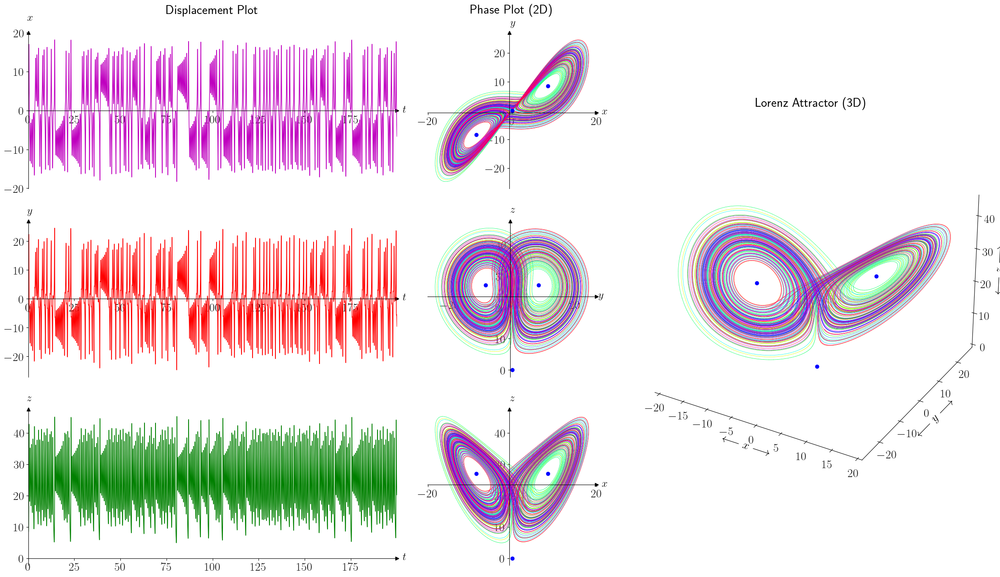

In [10]:
fig = plt.figure(figsize=(24, 14))
#fig.suptitle(
#    'Lorentz System'
#    + r'$ \\ \dot{x}= \sigma(y-x)  \\ \dot{y}= x(\rho-z)-y \\ \dot{z}=xy-{\beta z} \\ $'
#    + r'$ \sigma = 10, \rho = 28, \beta = \frac{8}{3} $',
#    fontsize=30, y=1.02)

# Grid spec
gs = fig.add_gridspec(3, 5)
ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[1, 0:2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[0, 2])
ax5 = fig.add_subplot(gs[1, 2])
ax6 = fig.add_subplot(gs[2, 2])
ax7 = fig.add_subplot(gs[0:3, 3:5], projection='3d')

# Time series labels
for ax, data, label in zip([ax1, ax2, ax3], [xx, yy, zz], ['x', 'y', 'z']):
    ax.set_xlim([t[0], t[-1]])
    ax.text(-0.5, np.max(data) + 5, fr'${label}$', fontsize=18)
    ax.text(t[-1] + 3, -0.5, r'$t$', fontsize=18)
    customize_axes(ax,x_p=0, y_p=0,)

axes_2d = [ax4, ax5, ax6]
coords  = [(xx, yy, 'x', 'y'), (yy, zz, 'y', 'z'), (xx, zz, 'x', 'z')]
for ax, (x_data, y_data, x_label, y_label) in zip(axes_2d, coords):
    customize_axes(ax, x_p=np.mean(y_data), y_p=np.mean(x_data))
    ax.text(-0.5, np.max(y_data) + 5, fr'${y_label}$', fontsize=18)
    ax.text(np.max(x_data) + 3, np.mean(y_data)-0.5, fr'${x_label}$', fontsize=18)
 
# 3D plot tweaks
ax7.xaxis.set_pane_color((1, 1, 1, 1))
ax7.yaxis.set_pane_color((1, 1, 1, 1))
ax7.zaxis.set_pane_color((1, 1, 1, 1))
ax7.xaxis.pane.set_edgecolor('w')
ax7.yaxis.pane.set_edgecolor('w')
ax7.zaxis.pane.set_edgecolor('w')
ax7.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax7.set_ylabel(r'$\longleftarrow y \longrightarrow$')
ax7.set_zlabel(r'$\longleftarrow z \longrightarrow$')

# 1D time series plots
ax1.plot(t, xx, 'm', linewidth=1.1)
ax2.plot(t, yy, 'r', linewidth=1.1)
ax3.plot(t, zz, 'g', linewidth=1.1)

# 2D + 3D plots
s = 10
n = len(t)
for i in range(0, n - s, s):
    ax4.plot(xx[i:i+s+1], yy[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax5.plot(yy[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax6.plot(xx[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax7.plot(xx[i:i+s+1], yy[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)

# Mark fixed points
for p in fixed_points(b, r):
    xp, yp, zp = p
    ax4.plot(xp, yp, 'bo')
    ax5.plot(yp, zp, 'bo')
    ax6.plot(xp, zp, 'bo')
    ax7.plot(xp, yp, zp, 'bo')

ax1.set_title('Displacement Plot', fontsize=22,y=1.1)
ax4.set_title('Phase Plot (2D)', fontsize=22,y=1.1)
ax7.set_title('Lorenz Attractor (3D)', fontsize=22,y=1.1)
ax7.grid(False)
plt.tight_layout()
plt.show()

---

<span style="color:red">(Exponential divergence)                                                                                                   
Using numerical integration of two nearby trajectories, estimate the largest Liapunov exponent for the Lorenz system,                
assuming that the parameters have their standard values $r = 28, \sigma = 10, b = 8 / 3$.<span style="color:red">  


<span style="color:red">(Time horizon)                                                                                                             
To illustrate the “time horizon” after which prediction becomes impossible,                                                                         
numerically integrate the Lorenz equations for $r = 28, \sigma = 10, b = 8 / 3$.                                                                                              
Start two trajectories from nearby initial conditions, and plot $x ( t )$ for both of them on the same graph. <span style="color:red">

---

### $\textit{Liapunov exponent from Exponential Divergence of Nearby Trajectories}$                                                         
Suppose that we let transients decay, so that a trajectory is “on” the attractor.                                            
Suppose $x(t)$ is a point on the attractor at time $t$, and consider a nearby point, say $x(t)+\delta(t)$,                     
where $\delta$ is a tiny separation vector of initial length $||\delta_0 || = 10^{–15}$, say                                     
In numerical studies of the Lorenz attractor, one finds that                                                                         
$\qquad || \delta ( t ) || \sim || \delta_0 || \exp(\lambda t)$
where $\lambda = 0.9$.                                                                                                       
Hence neighboring trajectories separate exponentially fast.                                                                                 
Equivalently, if we plot $\ln ||\delta ( t ) ||$ versus $t$, we find a curve that is close to a straight line with a positive slope of $\lambda$                                                                                                      
We need to add some qualifications:
1. The curve is never exactly straight.                                                                                       
It has wiggles because the strength of the exponential divergence varies somewhat along the attractor.                              
2. The exponential divergence must stop when the separation is comparable to the “diameter” of the attractor                   
the trajectories obviously can’t get any farther apart than that. This explains the leveling off or saturation of the curve      
3. The number $\lambda$ is often called the Liapunov exponent, although this is a sloppy use of the term, for two reasons:                      
   i. First, there are actually n different Liapunov exponents for an n-dimensional system, defined as follows.              
   Consider the evolution of an infinitesimal sphere of perturbed initial conditions.                                         
   During its evolution, the sphere will become distorted into an infinitesimal ellipsoid.                                         
   Let $\delta_k(t), k=1,... , n,$ denote the length of the kth principal axis of the ellipsoid.                              
   Then $\delta_k(t)\sim\delta_k(t)\exp(\lambda t),$ where the $\lambda_k$ are the Liapunov exponents.                        
   For large $t$, the diameter of the ellipsoid is controlled by the most positive $\lambda_k$.                             
   Thus our $\lambda$ is actually the largest Liapunov exponent.                                                                
   ii. Second, $\lambda$ depends (slightly) on which trajectory we study.     
   We should average over many different points on the same trajectory to get the true value of $\lambda$.                           
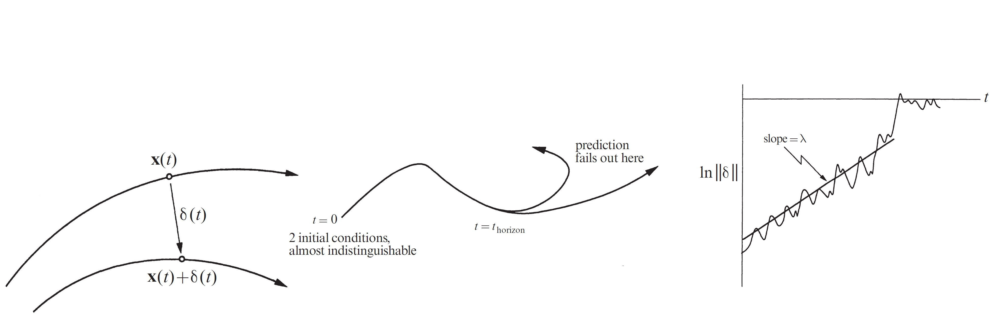

### $\textit{Linear Regression}$

Best fit of Linear regressions:                                                                                                                  
$\qquad \displaystyle{m = \frac{N\sum x_i y_i - \sum x_i \sum y_i}{N\sum x_i^2 - \big(\sum x_i \big)^2} ;\qquad c = \frac{\sum y_i \sum x_i^2 - \sum x_i \sum x_i y_i}{N\sum x_i^2 - \big(\sum x_i\big)^2} }$

We use the Slope intercept form for the straight line :**$\quad \displaystyle{ y = mx + c }$**                                         
where                                                                                                                      
- $m$ is the slope                                                                                                         
- $c$ is the y-intercept

In [10]:
def fit(x,y):
    n = len(x)
    sx = sum(x)
    sy = sum(y)
    sx2 = sum(x*x)
    sxy = sum(x*y)
    b = (n*sx2 - sx**2)
    m = (n*sxy - sx*sy) / b
    c = (sy*sx2 - sx*sxy) / b
    return m, c

Algorithm :                                                                                                                       
           1. Setting a perturbeted initial condition with $ z\rightarrow z+\delta$                                                           
           2. Setting $\displaystyle \text{displacement  }(S)=\sqrt{(x-x_p)^2+(y-y_p)^2+(z-z_p)^2}$                                                                  
           3. Setting $\displaystyle S \rightarrow \log(S)$ for plot                                                                          
           4. Set the time period length for regression then find $m=\lambda$ from the fit. Where $ Y = \exp(\lambda t)+c$

In [11]:
# Perturb z by 𝛿
d = 0.001
init_perturbed = [x0, y0, z0 + d]  
t_p, M_p = RK4( Lorenzfunction, t_span, const, dt, init_perturbed)
xx_p, yy_p, zz_p = M_p[:, 0], M_p[:, 1], M_p[:, 2]


S = np.sqrt((xx - xx_p)**2 + (yy - yy_p)**2 + (zz - zz_p)**2)             # Divergence of Nearby Trajectories
point_x = 10.4
m, c = fit(t[int(1/dt):int(point_x/dt)], np.log(S[int(1/dt):int(point_x/dt)]))
t_   = t[int(1/dt):int(point_x/dt)]
Y    = np.exp(m * t_ + c)
err  = ((0.9-m)/0.9)*100

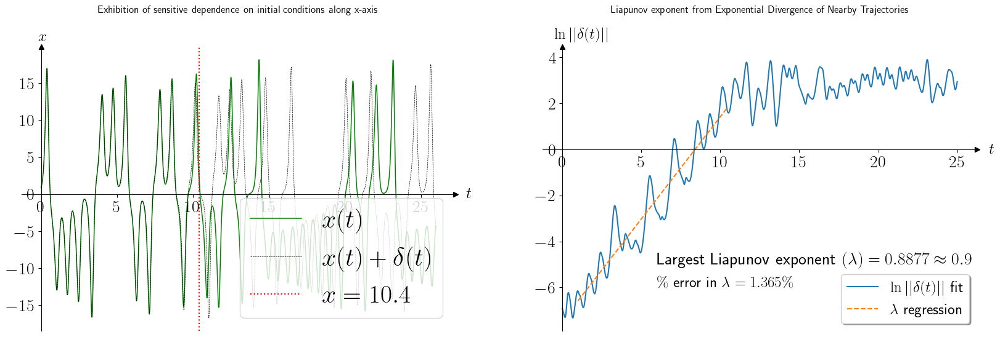

In [12]:
fig = plt.figure(figsize=(20, 6))

gs=fig.add_gridspec(1,2)
ax1=fig.add_subplot(gs[0])
ax2=fig.add_subplot(gs[1])
customize_axes(ax1)
customize_axes(ax2,x_p=0.0, y_p=0 )

# 1D Displacement plot
ax1.plot(t[:int(26/dt)],xx[:int(26/dt)],  'g',   linewidth=1.1, label=r'$x(t)$')
ax1.plot(t[:int(26/dt)],xx_p[:int(26/dt)],'k--', linewidth=0.5, label=r"$ x(t)+\delta(t)$")
ax1.axvline(point_x, color="r", linestyle=":", label=f'$x={point_x}$')
ax1.legend(loc='lower right')
ax1.set_title('Exhibition of sensitive dependence on initial conditions along x-axis', y=1.1, fontsize=12)
ax1.text(-0.2, np.max(xx) + 2.5, r'$ x $', fontsize=18)
ax1.text(t[int(26/dt)] + 2, -0.5, r'$t$', fontsize=18)

ax2.plot(t[:int(25/dt)], np.log(S[:int(25/dt)]), label=r"$\ln || \delta(t)||$  fit")  # Exponential Divergence
ax2.plot(t_, np.log(Y), '--', label="$\lambda$  regression")     # Liapunov plot 
ax2.text(6,-5, r'Largest Liapunov exponent $ ( \lambda ) = {:.4} \approx 0.9$'.format(m), fontsize=20)
ax2.text(6,-6, r' $ \% $ error in $ \lambda = {:.4}\% $'.format(err), fontsize=18)
ax2.legend(fontsize=18,loc='lower right',  fancybox=True, shadow=True, ncol=1)
ax2.set_title('Liapunov exponent from Exponential Divergence of Nearby Trajectories', y=1.1, fontsize=12)
ax2.text(-0.5, np.max(np.log(S)) + 0.8, r'$ \ln ||\delta(t)|| $', fontsize=18)
ax2.text(t[int(25/dt)] + 2, -0.2, r'$t$', fontsize=18)
#ax2.set_yscale("log")
plt.show()

<span style="color:red">Using numerical integration, compute the Lorenz map  $r = 28, \sigma = 10, b = 8 / 3$.<span style="color:red">
    
---
    
### **$\textit{Lorenz Map}$**
The “single feature” that Lorenz focuses on is $z_n$, the $n^{th}$ local maximum of $z(t)$. His idea is that $z_n$ should predict $z_{n+1}$.                                                                                                                  
The function $z_{n+1}=f(z_n)$ shown in Figure is now called the $\it{\text{Lorenz Map}}$.                                     
The key observation is that the graph in Figure right satisfies $|f'(z)|>1$ everywhere.                                           
This property ultimately implies that if any limit cycles exist, they are necessarily unstable.                                                               
Given a list of numbers $ \{z_1, z_2, \ldots, z_n\}$, the algorithm aims to identify local maxima,                          
which are elements in the list that are greater than both their preceding and succeeding elements (if they exist).                              
Here's a mathematical interpretation of each step:                                                                             
1.  Let $ n $ be the length of the list of numbers, i.e., $ n = | \{z_1, z_2, \ldots, z_n\} | $.   
2.  If $ n \geq 2 $, check the first element $z_1$:                             
    If $z_1 > z_2 $, add $ z_1 $ to $ M $. This implies that $z_1$ is a local maximum.                     
3.  If $n > 3$, loop through the elements from index 2 to $n-1$ (inclusive):                     
  For each element $ z_i $ at index $i$, check if it is greater than its preceding $ z_{i-1} $ and succeeding $ z_{i+1} $ elements:                                                                                                                         
       If $ z_i > z_{i-1}$ and $ z_i > z_{i+1} $, add $ z_i $ to $M$.                                                      
4.  Check the last element $ z_n $:                                                                                                                     
      If $z_n > z_{n-1}$, add $z_n$ to $M$. This implies that $z_n$ is a local maximum.                                           
                                                                                                                                      
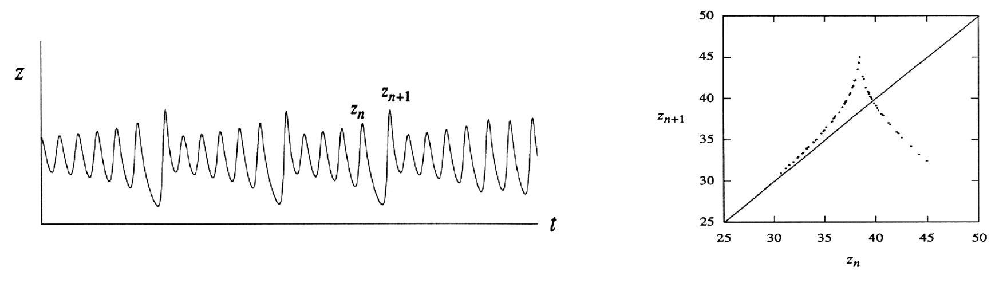
The $\textit{Lorenz Map}$ is different from $\textit{Poincaré map}$ because it characterizes the trajectory by only one number, not two.                                                                                                                           
This simpler approach works only if the attractor is very “flat”, i.e., close to 2D, as the Lorenz attractor is.

In [13]:
def FindMaxima(z,t):
    Mz = []         # max z 
    Tz = []         # time of max z
    n = len(z)      # length of z-array
    
    if n >= 2:
        if z[0] > z[1]:
            Mz.append(z[0])
            Tz.append(t[0])

    if n > 3:
        for i in range(1, n-1):     
            if z[i] > z[i-1] and z[i] > z[i+1]:
                Mz.append(z[i])
                Tz.append(t[i])
    
    if z[n-1] > z[n-2]:    
        Mz.append(z[n-1])  
        Tz.append(t[n-1])
    return Mz,Tz

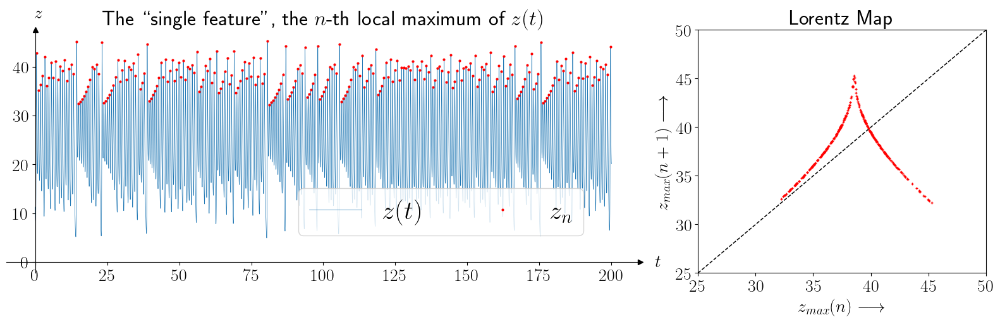

In [21]:
z_n,t_n = FindMaxima(zz, t) # Lorenz Map (Maxima z_n)

fig = plt.figure(figsize=(20,5))
gs=fig.add_gridspec(1,3)
ax1=fig.add_subplot(gs[0,0:2])
ax2=fig.add_subplot(gs[0,2])

ax1.text(215, -0.9, r'$t$')
ax1.text(-0.1, 50, r'$z$')
ax2.set_xlabel(r'$z_{max} (n) \longrightarrow$')
ax2.set_ylabel(r'$z_{max} (n+1) \longrightarrow$')
customize_axes(ax1, y_p=0)
ax1.plot(t, zz, linewidth=0.5, label=r'$z(t)$')
ax1.plot(t_n[1:-1], z_n[1:-1], 'ro', ms=2, label=r'$z_n$')                  # Local Maxima of z_n
ax1.set_title(r'The “single feature”, the $n$-th local maximum of $z(t)$')
ax1.legend(loc='lower left', bbox_to_anchor=(0.44, 0.1),  fancybox=True, shadow=False, ncol=2)

#ax2.plot(z_n[0:-1], z_n[0:-1], 'k--')
ax2.axline([0, 0], [1, 1], color = 'black', linestyle = '--', linewidth = 1.1)  # PI/4 angle
ax2.plot(z_n[1:-2], z_n[2:-1], 'r+', lw=0.2, ms=3)                                    # Lorenz Map
ax2.set_xlim([25,50])
ax2.set_ylim([25,50])
ax2.set_title('Lorentz Map')
plt.show()

---

<span style="color:red">(An ellipsoidal trapping region for the Lorenz equations)                                                                     
Show that there is a certain ellipsoidal region $E$ of the form $rx^2 + \sigma y^2 + \sigma( z – 2r )^2 \le C $         
such that all trajectories of the Lorenz equations eventually enter $E$ and stay in there forever.                                     
For a much stiffer challenge, try to obtain the smallest possible value of $C$ with this property.   </span>  

---

The Lorenz equations are:

$\begin{aligned} \dot{x} &= \sigma (y - x), \\ \dot{y} &= r x - y - xz, \\ \dot{z} &= xy - b z, \end{aligned}$

where $\sigma, r, b$ are positive constants.

Let,                                                                                                                         
$ V(x, y, z) = r x^2 + \sigma y^2 + \sigma (z - 2r)^2 $

$\begin{aligned} \dot{V} &= \frac{\partial V}{\partial x} \dot{x} + \frac{\partial V}{\partial y} \dot{y} + \frac{\partial V}{\partial z} \dot{z} \\ &= 2r x \dot{x} + 2\sigma y \dot{y} + 2\sigma (z - 2r)\dot{z} \\ &= 2r x (\sigma(y - x)) + 2\sigma y (rx - y - xz) + 2\sigma (z - 2r)(xy - b z) \\ &= 2r \sigma x y - 2r \sigma x^2 + 2r\sigma x y - 2\sigma y^2 - 2\sigma x y z + 2\sigma xy(z - 2r)  - 2\sigma b z (z - 2r) \\ &= 2r \sigma x y - 2r \sigma x^2 + 2r\sigma x y - 2\sigma y^2 - 2\sigma x y z + 2\sigma xyz - 4r\sigma xy  - 2\sigma b z^2 + 4r\sigma b z  \\ &= 4r \sigma x y - 4r\sigma xy  - 2r \sigma x^2 - 2\sigma y^2 - 2\sigma x y z + 2\sigma xyz - 2\sigma b z^2 + 4r\sigma b z  \\ &= - 2r \sigma x^2 - 2\sigma y^2 - 2\sigma b z^2 + 4r\sigma b z < 0 \end{aligned}$

#### **Behavior of $ \dot{V}$**
- For sufficiently large $ x, y, z $, the quadratic terms $ -2r \sigma x^2, -2\sigma y^2, -2\sigma b z^2 $ dominate, ensuring $ \dot{V} < 0 $ outside a certain region.
- Inside this region, the dynamics may allow trajectories to grow, but $ \dot{V} $ ensures that trajectories are eventually attracted to a bounded region.

#### **Bounding $ C$**
The smallest $C $ occurs when $ \dot{V} = 0 $ exactly on the boundary of the ellipsoid:

$r x^2 + \sigma y^2 + \sigma (z - 2r)^2 = C$

---

<span style="color:red">(A spherical trapping region)                                                                                                
Show that all trajectories eventually enter and remain inside a large sphere $S$ of the form $x^2 + y^2 + ( z – r – \sigma )^2 = C,$ for $C$ sufficiently large.                                                                                 
(Hint: Show that $x^2 + y^2 + ( z – r – \sigma )^2 $ decreases along trajectories for all $( x,y,z ) $ outside a certain fixed ellipsoid.                                                                                                            
Then pick C large enough so that the sphere $S$ encloses this ellipsoid.)  </span>  

---

For the **Lorenz system**, the equations are:

$\begin{aligned} \dot{x} &= \sigma (y - x), \\ \dot{y} &= r x - y - x z, \\ \dot{z} &= x y - b z, \end{aligned} $

where $\sigma,r$ and $b$ are parameters. 

Let,

$\begin{aligned} V(x, y, z)  = x^2 + y^2 + ( z – r – \sigma )^2 \end{aligned}$

$\begin{aligned} \dot{V} &= 2x\dot{x} + 2y\dot{y} + 2( z – r – \sigma )\dot{z} \\ &= 2x \sigma (y - x) + 2y (r x - y - x z) + 2( z – r – \sigma ) (x y - b z) \end{aligned}$

$\begin{aligned} \frac{1}{2}\dot{V} &= x \sigma (y - x) + y (r x - y - x z) + ( z – r – \sigma ) (x y - b z) \\ &= xy\sigma  - x^2\sigma + r x y - y^2 - xyz +  x y( z – r – \sigma ) - b z( z – r – \sigma ) \\ &= xy\sigma - x^2\sigma + rxy - y^2 - xyz +  xyz – rxy – xy\sigma  - bz^2 – brz – bz\sigma  \\ &=  - x^2\sigma - y^2 - b\left(z^2-(\sigma+r)z \right)  \\ &=  - x^2\sigma - y^2 - b\left(z^2-(\sigma+r)z \right)  \\ &=  - x^2\sigma - y^2 - b\left[z^2-(\sigma+r)z + \frac{(\sigma+r)^2}{4} - \frac{(\sigma+r)^2}{4} \right]  \\ &= - x^2\sigma - y^2 - b\left[z^2-(\sigma+r)z + \frac{(\sigma+r)^2}{4} - \frac{(\sigma+r)^2}{4} \right]  \\   &=  - x^2\sigma - y^2 - b\left(z - \frac{(\sigma+r)}{2}\right)^2 + b\frac{(\sigma+r)^2}{4} < 0  \end{aligned}$

For the trajectories to points inwards on surface : $ \dot{V} < 0$ 

$\begin{aligned} - x^2\sigma - y^2 - b\left(z - \frac{(\sigma+r)}{2}\right)^2 + b\frac{(\sigma+r)^2}{4}   < 0 \end{aligned}$

$\begin{aligned} b\frac{(\sigma+r)^2}{4}  <  x^2\sigma + y^2 + b\left(z - \frac{(\sigma+r)}{2}\right)^2 \end{aligned}$

$\begin{aligned} 1  <  \frac{x^2\sigma}{b\frac{(\sigma+r)^2}{4}} + \frac{y^2}{b\frac{(\sigma+r)^2}{4}} + \frac{b\left(z - \frac{(\sigma+r)}{2}\right)^2}{b\frac{(\sigma+r)^2}{4}} \end{aligned}$

$\begin{aligned} 1  < \frac{4\sigma}{b(\sigma+r)^2} x^2 + \frac{4}{b(\sigma+r)^2} y^2 + \frac{4}{(\sigma+r)^2} \left(z - \frac{(\sigma+r)}{2}\right)^2 \end{aligned}$

Centered point at $\begin{aligned}\left(0,0,\frac{\sigma + r}{2} \right)\end{aligned}$.

And the maximum distance from the center , i.e. axes of ellipsoid (semi-axis)                                                                              

$\begin{aligned} \qquad x: \frac{4\sigma}{b(\sigma+r)^2} x^2 > 1 &=> x =\pm\sqrt{ \frac{b(\sigma+r)^2}{4\sigma} } \\   
   \qquad y : \frac{4}{b(\sigma+r)^2} y^2 > 1 &=> y =\pm\sqrt{ \frac{b(\sigma+r)^2}{4} }   \\   
   \qquad z : \frac{4}{(\sigma+r)^2} z^2 > 1 &=> z =\pm\sqrt{ \frac{(\sigma+r)^2}{4} } \end{aligned}$
   

---

#### Enclosing the Ellipsoid with a Sphere
The maximum distance from the center of the ellipsoid is:
$R = \sqrt{\max(a_x^2,a_y^2,a_z^2)} = \max \left( \sqrt{ \frac{b(\sigma+r)^2}{4\sigma} } , \sqrt{ \frac{b(\sigma+r)^2}{4} }, \sqrt{ \frac{(\sigma+r)^2}{2} } \right)$

Choose $C$ such that $C>R^2$

This guarantees that the sphere:

$x^2 + y^2 + ( z – r – \sigma )^2 \le C $

encloses the ellipsoid. Since $\dot{𝑉}<0$ outside the ellipsoid, trajectories will eventually enter the sphere and remain there.

---



<span style="color:red"> (z-axis is invariant)                                                                                                                               
Show that the z-axis is an invariant line for the Lorenz equations.                                                                                            
In other words, a trajectory that starts on the z-axis stays on it forever . <span>                                                                                           
---

The Lorenz equations are given by:

$\begin{aligned}
\dot{x} &= \sigma (y - x), \\
\dot{y} &= x(r - z) - y, \\
\dot{z} &= xy - bz.
\end{aligned}$

1. Assume the trajectory starts on the $ z $-axis, i.e., $ x(0) = 0$ and $y(0) = 0 $.                                 

   Then, $x(t) = 0 $ and $ y(t) = 0 $ for all $t$ if the trajectory remains on the $ z $-axis.

2. Substituting $x = 0$ and $y = 0$ into the equations:
   - From $\dot{x} = \sigma (y - x)$:
     
     $\dot{x} = \sigma (0 - 0) = 0.$
     
     Hence, $x(t) = 0 $.

   - From $\dot{y} = x(r - z) - y$:
     
     $\dot{y} = 0 \cdot (r - z) - 0 = 0.$
     
     Hence, $ y(t) = 0 $.

   - From $\dot{z} = xy - bz$:
     
     $\dot{z} = 0 \cdot 0 - bz = -bz.$
     
     This describes the evolution of $ z(t) $ along the $z$-axis.

On solving the eqn.

$\begin{aligned} \dot{z} &= -bz \\ \int \frac{dz}{z} &= -b \int dt \\ \ln z &= -bt+C \qquad\qquad\qquad\qquad\qquad\qquad \ \because C=const. \\ z &= \exp(-bt+C) = \exp(C)\cdot\exp(-bt) \\ z(t) &= z(0)\cdot\exp(-bt)\qquad\qquad\qquad\qquad\qquad \because z(0)=\exp(C) \end{aligned}$.      
     
Thus, if the trajectory starts on the $z$-axis $(x(0) = 0, y(0) = 0 )$, it will remain on the $ z $-axis.                   

Now we can check it 

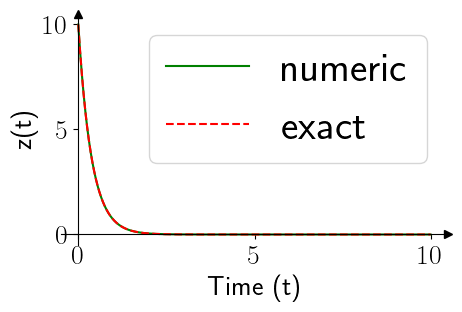

In [124]:
x0 = [0, 0, 10]  
tz, sol = RK4(Lorenzfunction, (0, 10), [sigma, b, r], 0.01, x0)
x, y, z = sol[:, 0], sol[:, 1], sol[:, 2]

fig, ax = plt.subplots(figsize=(5,3))
ax.plot(tz, z, 'g-', label='numeric')
ax.plot(tz, 10*np.exp(-b*tz), 'r--', label='exact')
customize_axes(ax)
#plt.title("Lorenz System Trajectory on the z-axis")
plt.xlabel("Time (t)")
plt.ylabel("z(t)")
plt.legend()
plt.show()

---

<span style="color:red">(Stability diagram)                                                                   
Using the analytical results obtained about bifurcations in the Lorenz equations, give a partial sketch of the stability diagram.                                                                                                                        
Specifically, assume $b = 1$ as in the waterwheel, and then plot the pitchfork and Hopf bifurcation curves in the $( \sigma, r )$ parameter plane.                                                                                                 
As always, assume $\sigma, r \ge 0$ .                                                             
(For a numerical computation of the stability diagram, including chaotic regions, see Kolar and Gumbs (1992).)<span style="color:red">

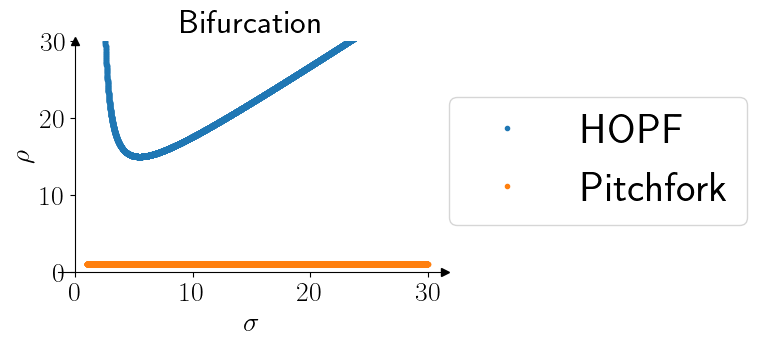

In [126]:
s = np.linspace(1, 30, 10000)
bs = 1

fig, ax = plt.subplots(figsize=(5,3))
customize_axes(ax)
ax.plot(s, s*(s+bs+3)/(s-bs-1), '.', label='HOPF')
ax.plot(s, np.ones(len(s)), '.', label='Pitchfork')
plt.xlabel('$\\sigma$')
plt.ylabel('$\\rho$')
plt.title('Bifurcation')
plt.ylim([0,30])
plt.legend(loc=(1.01,0.2))
plt.show()

---

<span style="color:red">  (Quasiperiodicity $\ne$ chaos)                                                                                                                                             
The trajectories of the quasiperiodic system $\dot{\theta_{\tiny 1}} = \omega_{\tiny 1} \; , \; \dot{\theta_{\tiny 2}} = \omega_{\tiny 2} \; , \; ( \omega_{\tiny 1} /  \omega_{\tiny 2} $  irrational $)$ are not periodic.                                   
a) Why isn’t this system considered chaotic ?                                                                                                                 
b) Without using a computer, find the largest Liapunov exponent for the system.
<span> 

---


#### **(a): Why the system is not chaotic**

  1. **Definition of chaos:**
   A system is considered chaotic if it satisfies three main properties:

   * Sensitivity to initial conditions (small differences grow exponentially).
   * Topological mixing (trajectories spread over phase space).
   * Dense periodic orbits (trajectories come arbitrarily close to previous states).

  2. **Quasiperiodic system dynamics:**
     The solutions to the system are simply:

   $$
   \theta_1(t) = \theta_1(0) + \omega_1 t, \quad
   \theta_2(t) = \theta_2(0) + \omega_2 t
   $$

   * Both $\theta_1(t)$ and $\theta_2(t)$ **increase linearly with time**.
   * Because $\omega_1 / \omega_2$ is **irrational**, the trajectory **never closes on itself**, so it is **not periodic**.
   * Geometrically, the trajectory fills densely a **2-torus** ($S^1 \times S^1$) without repeating.

  3. **Sensitivity to initial conditions:**

   * Take two nearby initial conditions: $(\theta_1(0), \theta_2(0))$ and $(\theta_1(0)+\delta_1, \theta_2(0)+\delta_2)$.
   * Their separation is:

   $$
   \delta \theta(t) = (\theta_1(t) - \theta_1'(t), \theta_2(t) - \theta_2'(t)) = (\delta_1, \delta_2)
   $$

   * This **difference does not grow in time**; it remains constant.

 **Conclusion:** There is **no sensitivity to initial conditions**, so the system is **not chaotic**, even though it is **non-periodic**.


#### **(b): Largest Lyapunov exponent**

  1. **Lyapunov exponent definition:**

   For a trajectory $\mathbf{\theta}(t)$, a small perturbation $\delta \mathbf{\theta}(0)$ evolves as:

   $$
   \delta \mathbf{\theta}(t) \approx e^{\lambda t} \delta \mathbf{\theta}(0)
   $$

   where $\lambda$ is the Lyapunov exponent.

  2. **Evolution of perturbations in this system:**

   Let a small perturbation be $\delta \theta_1(0) = \epsilon_1$, $\delta \theta_2(0) = \epsilon_2$.
   
   Then,

   $$
   \delta \theta_1(t) = \theta_1(t; \theta_1(0)+\epsilon_1) - \theta_1(t; \theta_1(0)) = \epsilon_1
   $$

   $$
   \delta \theta_2(t) = \theta_2(t; \theta_2(0)+\epsilon_2) - \theta_2(t; \theta_2(0)) = \epsilon_2
   $$

   * These perturbations are **constant in time**, not growing or shrinking.

  3. **Compute the Lyapunov exponent:**

    The largest Lyapunov exponent is defined as:

   $$
   \lambda_{\text{max}} = \lim_{t \to \infty} \frac{1}{t} \ln \frac{||\delta \mathbf{\theta}(t)||}{||\delta \mathbf{\theta}(0)||}
   $$

   Substitute $\delta \mathbf{\theta}(t) = \delta \mathbf{\theta}(0)$:

   $$
   \lambda_{\text{max}} = \lim_{t \to \infty} \frac{1}{t} \ln \frac{||\delta \mathbf{\theta}(0)||}{||\delta \mathbf{\theta}(0)||}
   = \lim_{t \to \infty} \frac{1}{t} \ln 1 = 0
   $$

   **Conclusion:** The **largest Lyapunov exponent is zero**, indicating that small perturbations **neither grow nor decay**.


### **Geometric intuition:**

   * Think of the trajectory as a **point moving on a torus**: one circle along $\theta_1$, another along $\theta_2$.
   * The motion is steady; nearby points move together without diverging.
   * Hence, no stretching, folding, or chaos occurs — just smooth quasiperiodic motion.




---

<span style="color:red">      (Tent map, as model of Lorenz map)                                                                                                  
Consider the map           <span style="color:red">                                                                                                           
$\qquad\begin{equation*}x_{n+1} = \left\{\begin{array}{rl}nx_n & \text{if } 0\le x_n \le\frac{1}{2},\\ n-nx_n & \text{if } \frac{1}{2}\le x_n \le 1.\end{array} \right.\end{equation*} $   <span style="color:red">                                                                                                                       
$\qquad\quad$ <span style="color:red"> as a simple analytical model of the Lorenz map. <span style="color:red">                                                                                       
1. <span style="color:red"> Why is it called the “tent map”?  <span style="color:red">                                                                                                                                                                              
2. <span style="color:red"> Find all the fixed points, and classify their stability.          <span style="color:red">                                                                              
3. <span style="color:red"> Show that the map has a period-2 orbit. Is it stable or unstable? <span style="color:red">                                                                                       
4. <span style="color:red"> Can you find any period-3 points? <span style="color:red">                                                                                         
<span style="color:red"> How about period-4? If so, are the corresponding periodic orbits stable or unstable?  <span style="color:red">                                           
5. <span style="color:red"> Plot the orbit diagram for the tent map.  <span style="color:red">
                                         
---

1. The "tent map" is named because its graphical representation resembles a tent shape.                                         
It is a one-dimensional discrete-time dynamical system defined by a piecewise linear function.

2. To find the fixed points, we need to solve the equation $x_{n+1} = x_n$ for $x_n$.                                                 
The tent map is defined as :                                                                                              
$\qquad x_{n+1} = \left\{\begin{array}{ll}2x_n & \text{if } 0 \leq x_n < \frac{1}{2} \\ 2 - 2x_n & \text{if } \frac{1}{2} \leq x_n \leq 1 \\ \end{array} \right.$                                                                                              
Setting $x_{n+1} = x_n$, we get :                                                                                              
   i. For $0 \leq x_n < \frac{1}{2}, \quad 2x_n = x_n \Rightarrow x_n = 0$.                                                        
   ii. For $\frac{1}{2} \leq x_n \leq 1, \quad 2 - 2x_n = x_n \Rightarrow x_n = \frac{2}{3}$.                                     
So, the fixed points are $x = 0$ and $x = \frac{2}{3}$.                                                                        
To classify their stability, we can analyze the derivative of the map at these points.                                          
If $|f'(x)| < 1$, the fixed point is stable; if $|f'(x)| > 1$, it's unstable.                                                      
The derivative $ f'(x)$ is:                                                                                                                 
$ \qquad f'(x) = \begin{cases} 2 & \text{if } 0 \leq x < \frac{1}{2}, \\ -2 & \text{if } \frac{1}{2} \leq x \leq 1. \end{cases} $          
i. **At $ x = 0 $**:
$f'(0) = 2. $ Since $ |f'(0)| = 2 > 1 $, the fixed point at $ x = 0 $ is unstable.                                                   
ii. **At $x = \frac{2}{3} $**:
$ f'\left(\frac{2}{3}\right) = -2. $
Since $ |f'\left(\frac{2}{3}\right)| = 2 > 1 $, the fixed point at $ x = \frac{2}{3}$ is also unstable.                 
Both fixed points are unstable because $ |f'(x)| > 1 $ at each point.

3. To find a period-2 orbit, we need to find $x_0$ such that $f(f(x_0)) = x_0$.                                              
We can iterate the tent map starting from different initial conditions until we find a value that satisfies this condition.        
Once we find such a value, we need to determine its stability by analyzing the behavior of nearby points under iteration.

4. Similarly, we can search for period-3 and period-4 points by finding $x_0$ such that $f(f(f(x_0))) = x_0$ and $f(f(f(f(x_0)))) = x_0$, respectively.                                                                                          
Then, we analyze their stability based on the behavior of nearby points under iteration.

Found period-2 orbit: 0.4 -> 0.3999999999999999
Stability: unstable 
 [0.4, 0.8, 0.3999999999999999]
Period-3 orbit not found within the initial conditions.
Found period-4 orbit: 0.4 -> 0.40000000000000036
Stability: unstable 
 [0.4, 0.8, 0.3999999999999999, 0.7999999999999998, 0.40000000000000036]


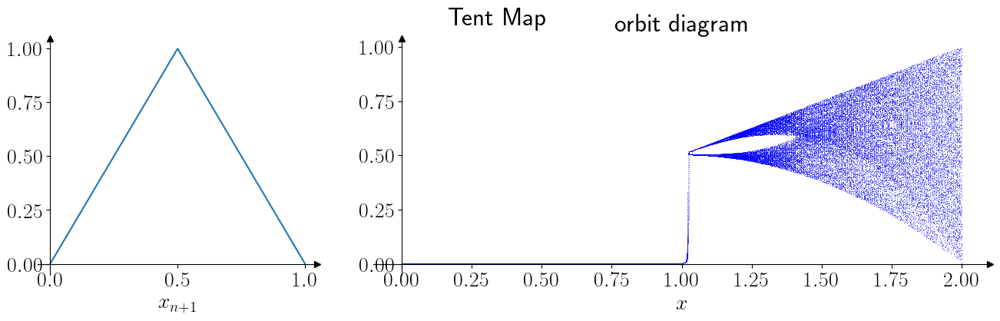

In [127]:
def tent_map(x_n, r):
    if 0 <= x_n <= 0.5:
        return r * x_n
    elif 0.5 <= x_n <= 1:
        return r * (1 - x_n)
    else:
        return None  

def find_period_n_orbit(tent_map, X, n, num_iterations=1000):
    for x0 in X:
        x = x0
        for i in range(n):
            x = tent_map(x, r=2)        
        if abs(x - x0) < 1e-12:  # Adjust tolerance as needed
            print(f"Found period-{n} orbit: {x0} -> {x}")            
            x_values = [x0]
            derivative_product = 1.0
            for i in range(n):
                if 0 <= x_values[-1] < 0.5:
                    f_prime = 2
                else:
                    f_prime = -2
                derivative_product *= f_prime
                x_values.append(tent_map(x_values[-1], r=2))     
            stability = "stable" if abs(derivative_product) < 1 else "unstable"
            print(f"Stability: {stability}",'\n',x_values)
            return 
    print(f"Period-{n} orbit not found within the initial conditions.")

X = np.arange(0.1, 1., 0.1)
find_period_n_orbit(tent_map, X, 2)
find_period_n_orbit(tent_map, X, 3)
find_period_n_orbit(tent_map, X, 4)

# Parameters
r_min = 0
r_max = 2
n_r = 1000
n_iterations = 500
n_last = 100

r_values = np.linspace(r_min, r_max, n_r)
x_next_values = [tent_map(x, r=2) for x in r_values] 

fig=plt.figure(figsize=(16,4))
fig.suptitle("Tent Map")
gs=fig.add_gridspec(1,3)
ax1=fig.add_subplot(gs[0,0])
ax2=fig.add_subplot(gs[0,1:])
customize_axes(ax1)
customize_axes(ax2)

for r in r_values:
    x = 1e-5  
    for i in range(n_iterations):
        x = tent_map(x, r)
        if i >= (n_iterations - n_last):
            ax2.plot(r, x, ',b', alpha=0.5)

ax1.plot(r_values, x_next_values)
ax2.set_title('orbit diagram')
ax1.set_xlabel('$x_n$')
ax1.set_xlabel('$x_{n+1}$')
ax2.set_xlabel('$r$')
ax2.set_xlabel('$x$')
plt.show()

### $\textit{Poincaré Map }$

To construct a $\textit{Poincaré map}$ for a 3D flow, we compute a trajectory’s successive intersections with a 2D surface.                                                                                                           
The $\textit{Poincaré map}$ takes a point on that surface, specified by two coordinates,                                              
and then tells us how those two coordinates change after the first return to the surface.                                           
Detect intersections with the plane $z = r - 1$ is a good choice, which is the level of the two fixed points .                    
 Then, at each time step, you will need to perform a test with the updated $z-$coordinate $(z_{new}, say)$ and the previous $z-$coordinate $(z_{old})$.                                                                                                      
 More precisely, you will need to add an $(x, y)$ point to your $\textit{Poincaré section}$ if $z − (r − 1)$ changes sign.        
We might need to take care to get a neat $\textit{Poincaré section } :$                                                                      
   1. We will need to run your code for a long time to get enough points – perhaps a thousand.                                 
  2. We may wish to consider whether or not you wish to use all the points obtained, or simply those over a certain portion of the evolution.                                                                                                    
  3. We may need to interpolate between $x_{new}$ and $x_{old}$ to find more precisely the values of $x$ and $y$ for your plot. 



In [15]:
# Generate Poincaré section
def poincare_section(x,y,z, t, r):
    
    # Define Poincaré section condition
    def poincare_c(z, r):
        return z - (r - 1)    
    
    poincare_x = []
    poincare_y = []
    
    for i in range(1, len(t)):
        
        if poincare_c(z[i], r) * poincare_c(z[i-1], r) < 0:
            # Interpolate to find more precise (x, y) values
            alpha = abs(poincare_c(z[i], r) / (poincare_c(z[i], r) - poincare_c(z[i-1], r)))
            x_p = x[i-1] + alpha * (x[i] - x[i-1])
            y_p = y[i-1] + alpha * (y[i] - y[i-1])
            poincare_x.append(x_p)
            poincare_y.append(y_p)
    return np.array([poincare_x, poincare_y])

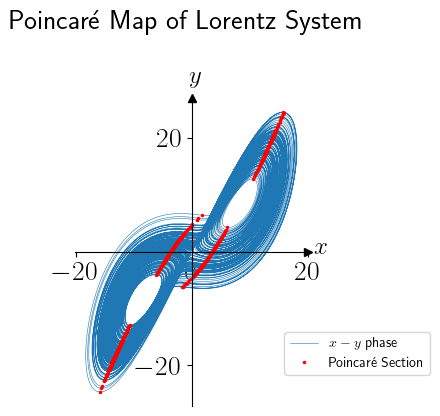

In [26]:
# Poincaré Map 
poincare_x, poincare_y  = poincare_section(xx, yy, zz, t, r=28)

fig = plt.figure(figsize=(3,4))
fig.suptitle('Poincaré Map of Lorentz System', fontsize=20,y=1.1)
gs=fig.add_gridspec(1,1)
ax1=fig.add_subplot(gs[0,0])
ax1.plot(xx, yy, linewidth=0.4, label=r'$x-y$ phase')            # x-y phase of Lorenz Attractor
ax1.plot(poincare_x, poincare_y, 'r.', label='Poincaré Section', ms=3) # Poincaré Section Plot
ax1.legend(loc=(0.9,0.1), fontsize=10)
ax1.text(-0.5, np.max(yy) + 5, fr'$y$', fontsize=18)
ax1.text(np.max(xx) + 3, -0.5, fr'$x$', fontsize=18)
customize_axes(ax1)
plt.show()

### $\textit{Poincaré section for varying }\rho :$

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['animation.embed_limit'] = 2**8

rounded_rho = np.round(np.arange(10, 100, 0.2), 2)

fig, ax = plt.subplots()
line, = ax.plot([], [], '.', markersize=0.51)

def update(rho):
    const = sigma, b, rho
    t, M = RK4(Lorenzfunction, t_span, const, dt, init_main)
    xx, yy, zz = M[:, 0], M[:, 1], M[:, 2]
    
    poincare_x, poincare_y = poincare_section(xx, yy, zz, t, rho) # Compute Poincaré section
    
    traj_line.set_data(xx, yy)  # Update trajectory line
    poincare_line.set_data(poincare_x, poincare_y)  # Update Poincaré section points
    title.set_text(r'$\rho={}$'.format(rho))
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    return traj_line, poincare_line,

traj_line, = plt.plot([], [], color='grey', linewidth=0.4,label=r'$x-y$ phase')
poincare_line, = plt.plot([], [], 'r.',  label='Poincaré Section', ms=3)
title = plt.title('')
plt.legend(loc='upper left', fontsize=8, fancybox=False)
ani = FuncAnimation(fig, update, frames=rounded_rho, interval=100)
#ani.save('Poincaré_Lorenz.gif', writer='pillow', fps=20)
HTML(ani.to_jshtml())

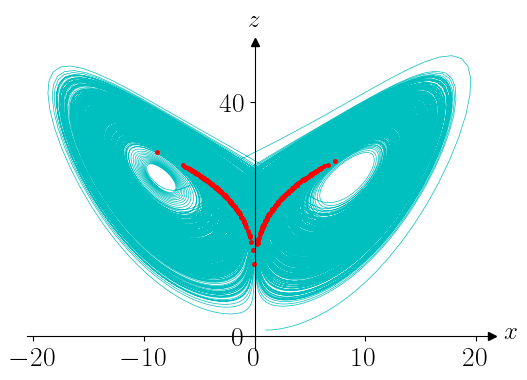

In [27]:
# initials
x0 = 1
y0 = 1
z0 = 1
init_main = [x0, y0, z0]

t_sol, M = RK4(Lorenzfunction, [0, 500], (10, 8/3, 28), 0.01, init_main)
xx, yy, zz = M[:, 0], M[:, 1], M[:, 2]
zero_crossings = np.where(np.diff(np.sign(xx)))[0]
points = []

for i in zero_crossings:
    t1, t2 = t_sol[i], t_sol[i+1]
    x1, x2 = xx[i], xx[i+1]
    y1, y2 = yy[i], yy[i+1]
    z1, z2 = zz[i], zz[i+1]
    t_zero = t1 - x1 * (t2 - t1) / (x2 - x1)
    x_zero = x1 + (x2 - x1) * (t_zero - t1) / (t2 - t1)
    y_zero = y1 + (y2 - y1) * (t_zero - t1) / (t2 - t1)
    z_zero = z1 + (z2 - z1) * (t_zero - t1) / (t2 - t1)
    points.append([ x_zero, y_zero, z_zero])
points = np.array(points)

fig, ax = plt.subplots(figsize=(6,4))
ax.plot(xx, zz, 'c', linewidth=0.5)
ax.plot(points[:, 1], points[:, 2], 'r.', ms=5)
ax.text(-0.5, np.max(zz) + 5, fr'$z$', fontsize=18)
ax.text(np.max(xx) + 3, -0.5, fr'$x$', fontsize=18)
customize_axes(ax)
plt.show()

### Discrete Fourier Transform (DFT)


$\qquad\displaystyle X_k=\sum_{n=0}^{N−1}x_n\cdot \exp\bigg(−\frac{2\pi ikn}{N}\bigg)$

In [34]:
def dft(x):
    N = len(x)
    n = np.arange(N)
    k = n.reshape((N, 1))
    e = np.exp(-2j*np.pi*k*n/N)
    X = np.dot(e, x)
    return X

def freq(X, dt):
    N_2 = len(X)
    n_2 = np.arange(N_2)
    frq = (n_2/N_2)*dt
    return frq

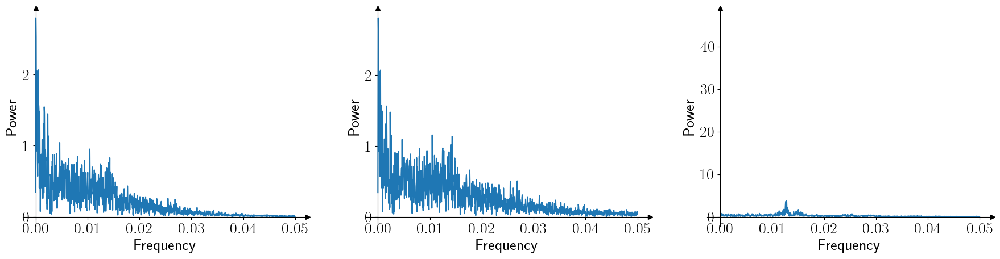

In [213]:
dt = 0.1
t, M = RK4( Lorenzfunction, t_span, const, dt, init_main)
xx, yy, zz = M[:, 0], M[:, 1], M[:, 2]
X, Y, Z = dft(xx), dft(yy), dft(zz)
Nx, Ny, Nz = len(X), len(Y), len(Z)
xf, yf, zf = freq(X, dt), freq(Y, dt), freq(Z, dt)

fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xf[:Nx//2], 2.0/Nx * np.abs(X[:Nx//2]))
ax1.set_xlabel('Frequency')
ax1.set_ylabel('Power')
customize_axes(ax1)

ax2.plot(yf[:Ny//2], 2.0/Ny * np.abs(Y[:Ny//2]))
ax2.set_xlabel('Frequency')
ax2.set_ylabel('Power')
customize_axes(ax2)

ax3.plot(zf[:Nz//2], 2.0/Nz * np.abs(Z[:Nz//2]))
ax3.set_xlabel('Frequency')
ax3.set_ylabel('Power')
customize_axes(ax3)

plt.show()

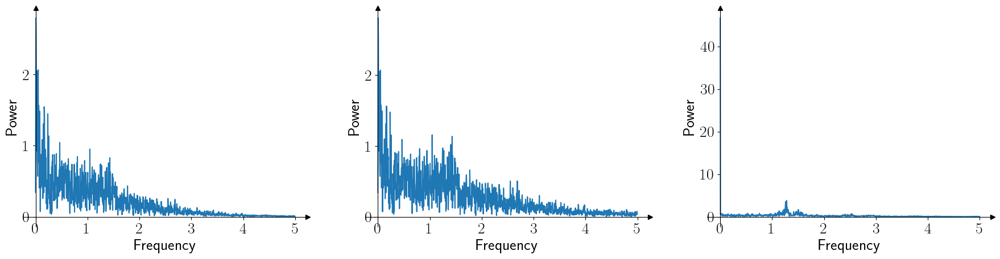

In [214]:
from scipy.fft import fft, fftfreq 

xN = len(xx)
XF = fft(xx)
fx = fftfreq(xN, dt)[:xN//2]

yN = len(yy)
YF = fft(yy)
fy = fftfreq(yN, dt)[:yN//2]

zN = len(zz)
ZF = fft(zz)
fz = fftfreq(zN, dt)[:zN//2]

fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(fx[:xN//2], 2.0/xN * np.abs(XF[:xN//2]))
ax1.set_xlabel('Frequency')
ax1.set_ylabel('Power')
customize_axes(ax1)

ax2.plot(fy[:yN//2], 2.0/yN * np.abs(YF[:yN//2]))
ax2.set_xlabel('Frequency')
ax2.set_ylabel('Power')
customize_axes(ax2)

ax3.plot(fz[:zN//2], 2.0/zN * np.abs(ZF[:zN//2]))
ax3.set_xlabel('Frequency')
ax3.set_ylabel('Power')
customize_axes(ax3)

plt.show()

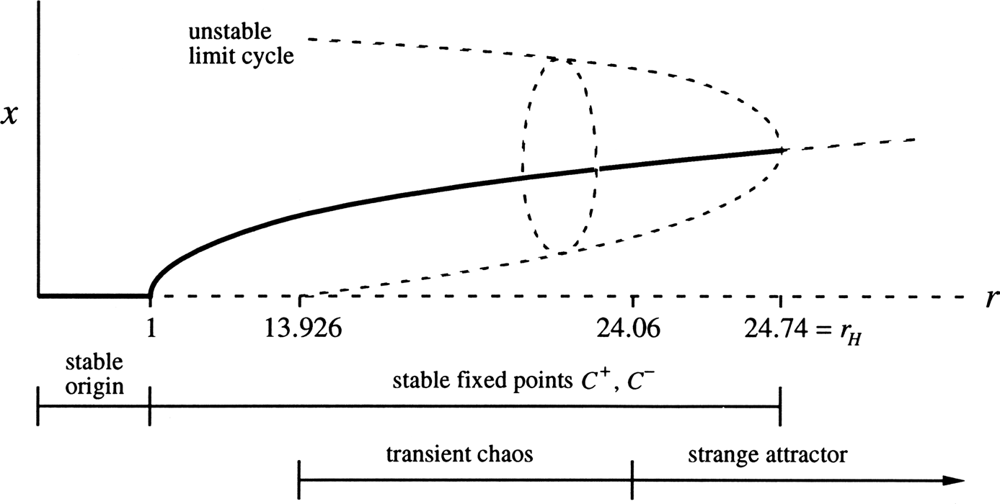

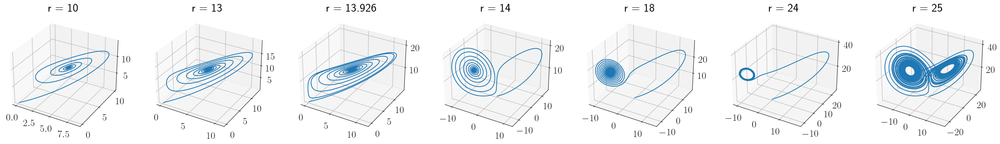

In [60]:
r_values = [10,13, 13.926,14, 18,24,25]  
initial_conditions = [0.1, 0.1, 0.1]
t_span = (0, 50)

fig = plt.figure(figsize=(36,8))
gs=fig.add_gridspec(1,len(r_values))
ax = []
for i,r in enumerate(r_values):
    t, M = RK4( Lorenzfunction, t_span, (sigma, b, r), dt, initial_conditions)
    x, y, z = M[:, 0], M[:, 1], M[:, 2]
    subplot_ax = fig.add_subplot(gs[0, i], projection='3d')  # Add subplot
    ax.append(subplot_ax)
    ax[i].plot(x, y, z, label=f"r = {r}")
    ax[i].set_title(f'r = {r}')

plt.show()

## $$\textit{Bifurcation}$$

#### Bifurcation Detection



<img loc="right" width="300" src="https://raw.githubusercontent.com/Chaks1603/Storage/main/bir.png">

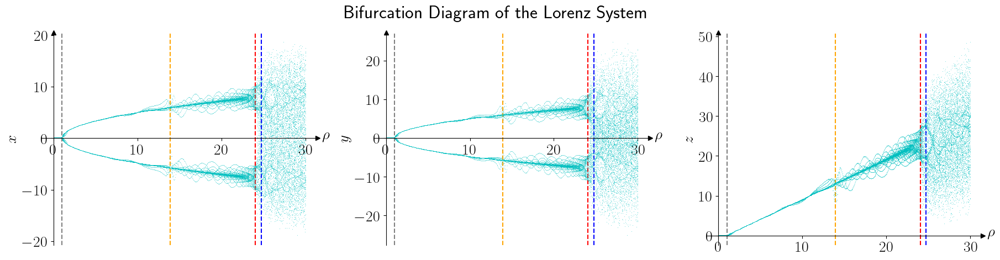

In [29]:
dt = 0.01
sampler = [int(x / dt) for x in range(5, 50)] 

fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.axvline(1,      color='gray',   linestyle='--', label="r = 1 (Pitchfork Bifurcation)")
ax1.axvline(13.926, color='orange', linestyle='--', label="r = 13.926 (Homoclinic)")
ax1.axvline(24.06,  color='red',    linestyle='--', label="r = 24.06 (Chaos Onset)")
ax1.axvline(24.74,  color='blue',   linestyle='--', label="r = 24.06 (Chaos Onset)")
ax2.axvline(1,      color='gray',   linestyle='--', label="r = 1 (Pitchfork Bifurcation)")
ax2.axvline(13.926, color='orange', linestyle='--', label="r = 13.926 (Homoclinic)")
ax2.axvline(24.06,  color='red',    linestyle='--', label="r = 24.06 (Chaos Onset)")
ax2.axvline(24.74,  color='blue',   linestyle='--', label="r = 24.06 (Chaos Onset)")
ax3.axvline(1,      color='gray',   linestyle='--', label="r = 1 (Pitchfork Bifurcation)")
ax3.axvline(13.926, color='orange', linestyle='--', label="r = 13.926 (Homoclinic)")
ax3.axvline(24.06,  color='red',    linestyle='--', label="r = 24.06 (Chaos Onset)")
ax3.axvline(24.74,  color='blue',   linestyle='--', label="r = 24.06 (Chaos Onset)")

for x0 in ([0.1,0.1,0.1], [-0.1,-0.1,-0.1]):
    x_bif,y_bif,z_bif = [],[],[]
    for rho in np.linspace(0., 30.0, 500):
        t, sol = RK4(Lorenzfunction, [0, 50], (sigma, b, rho), dt, x0)
        x, y, z = sol[:, 0], sol[:, 1], sol[:, 2]
        xS,yS,zS = x[sampler], y[sampler], z[sampler]  
        AppendX  = [[rho, xVal] for xVal in xS]
        AppendY  = [[rho, yVal] for yVal in yS]
        AppendZ  = [[rho, zVal] for zVal in zS]
        x_bif.extend(AppendX)
        y_bif.extend(AppendY)
        z_bif.extend(AppendZ)

    x_bif, y_bif, z_bif  = np.array(x_bif), np.array(y_bif), np.array(z_bif)
    ax1.plot(x_bif[:, 0], x_bif[:, 1], ',c', alpha=0.5)
    ax2.plot(y_bif[:, 0], y_bif[:, 1], ',c', alpha=0.5)
    ax3.plot(z_bif[:, 0], z_bif[:, 1], ',c', alpha=0.5)    

ax1.text(32, -0.2, r'$\rho$')
ax1.set_ylabel(r'$x$')
ax2.text(32, -0.2, r'$\rho$')
ax2.set_ylabel(r'$y$')
ax3.text(32, -0.2, r'$\rho$')
ax3.set_ylabel(r'$z$')

customize_axes(ax1)
customize_axes(ax2)
customize_axes(ax3)

fig.suptitle('Bifurcation Diagram of the Lorenz System')
plt.show()

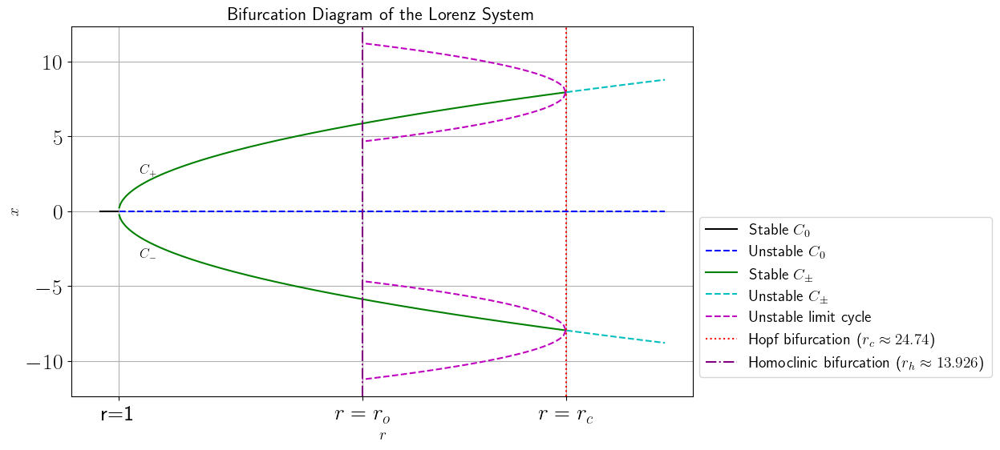

In [39]:
rc     = sigma * (sigma + b + 3) / (sigma - b - 1)  # Critical value of r for Hopf bifurcation
r0     = 13.926                                     # Homoclinic bifurcation value
r_vals = np.linspace(0, 30, 500)

# Fixed points
x_0  = np.zeros_like(r_vals)                  # c_0: x = 0
x_pm = np.sqrt(b * (r_vals - 1))              # c_±: x = ±sqrt(b(r - 1))

# Stability regions
stable_0    = r_vals < 1                      # C_0 stable for r < 1
unstable_0  = r_vals >= 1                     # C_0 unstable for r >= 1
stable_pm   = (r_vals > 1) & (r_vals < rc)    # C_± stable for 1 < r < rc
unstable_pm = r_vals >= rc                    # C_± unstable for r >= rc

# Unstable limit cycle
r_cycle        = np.linspace(rc, r0, 100)
unstable_cycle = (rc - r_cycle)**0.5 

plt.figure(figsize=(10, 6))
plt.title("Bifurcation Diagram of the Lorenz System", fontsize=16)

# Plot origin (C_0)
plt.plot(r_vals[stable_0], x_0[stable_0], 'k-', label="Stable $C_0$")
plt.plot(r_vals[unstable_0], x_0[unstable_0], 'b--', label="Unstable $C_0$")

# Plot stable branches (C_±)
plt.plot(r_vals[stable_pm],  x_pm[stable_pm], 'g-', label="Stable $C_\\pm$")
plt.plot(r_vals[stable_pm], -x_pm[stable_pm], 'g-')

# Plot unstable branches (C_±)
plt.plot(r_vals[unstable_pm], x_pm[unstable_pm], 'c--', label="Unstable $C_\\pm$")
plt.plot(r_vals[unstable_pm], -x_pm[unstable_pm], 'c--')

# Find the index closest to r_c in r_vals
index_rc = np.argmin(np.abs(r_vals - rc))

# Plot unstable limit cycles
plt.plot(r_cycle, x_pm[index_rc]+unstable_cycle, 'm--', label="Unstable limit cycle")
plt.plot(r_cycle, x_pm[index_rc]-unstable_cycle, 'm--')
plt.plot(r_cycle,-x_pm[index_rc]+unstable_cycle, 'm--')
plt.plot(r_cycle,-x_pm[index_rc]-unstable_cycle, 'm--')

plt.axvline(rc, color='r', linestyle=':', label=f"Hopf bifurcation ($r_c \\approx {rc:.2f}$)")
plt.axvline(r0, color='purple', linestyle='-.', label=f"Homoclinic bifurcation ($r_h \\approx {r0}$)")
plt.annotate('$C_+$', xy=(2 + 0.1, 2.5), fontsize=12, color='k')
plt.annotate('$C_-$', xy=(2 + 0.1,-3), fontsize=12, color='k')
plt.xticks([1, r0, rc], ['r=1', '$r=r_o$', '$r=r_c$'])
plt.legend(loc=(1.01, 0.051), fontsize=14)
plt.xlabel("$r$", fontsize=14)
plt.ylabel("$x$", fontsize=14)
plt.grid(True)
plt.show()

#### Bifurcation Detection

1. **State Variable Time Series**:
   - For each $(r)$ value, the Lorenz system is integrated over time span to obtain series for $x,y,$ and $z$.

2. **Finding Local Extrema**:
   - For a given time series $ (s = \{s_i\})$ (representing $x,y,$ or $z,$)                                                                                           
     Local maxima and minima are identified by checking the conditions:                                                                
     $\text{Maxima }(C^+)  : \quad s[i-1] < s[i] \text{ and } s[i] > s[i+1]$                                                              
     $\text{Minima }\ (C^- ) : \quad s[i-1] > s[i] \text{ and } s[i] < s[i+1]$

3. **Collecting Results**:
   - The values of $r$ corresponding to the detected $C^+ \ \& \ C^-$ are stored.


In [3]:
def bifurcation(s, rho):
    r_maxes, r_mins, s_maxes, s_mins = [], [], [], []
    for i in range(1, len(s) - 1):
        if s[i - 1] < s[i] and s[i] > s[i + 1]:
            r_maxes.append(rho)
            s_maxes.append(s[i])
        elif s[i - 1] > s[i] and s[i] < s[i + 1]:
            r_mins.append(rho)
            s_mins.append(s[i])
    return r_maxes, s_maxes, r_mins, s_mins

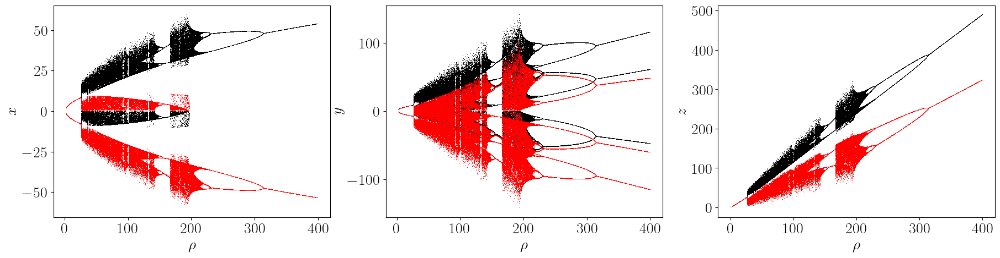

In [136]:
dr = 0.1
r_values = np.arange(0, 400, dr)
dt = 0.001
t_span = [0, 10]

xr_maxes, xs_maxes, xr_mins, xs_mins = [], [], [], []
yr_maxes, ys_maxes, yr_mins, ys_mins = [], [], [], []
zr_maxes, zs_maxes, zr_mins, zs_mins = [], [], [], []

fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

for x0 in ([0.1,0.1,0.1], [-0.1,-0.1,-0.1]):
    for rho in r_values:
        const = sigma, b, rho
        t, M = RK4(Lorenzfunction, t_span, const, dt, x0)
        xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
        xr_max, xs_max, xr_min, xs_min = bifurcation(xs, rho)
        yr_max, ys_max, yr_min, ys_min = bifurcation(ys, rho)
        zr_max, zs_max, zr_min, zs_min = bifurcation(zs, rho)

        xr_maxes.extend(xr_max)
        xs_maxes.extend(xs_max)
        xr_mins.extend(xr_min)
        xs_mins.extend(xs_min)

        yr_maxes.extend(yr_max)
        ys_maxes.extend(ys_max)
        yr_mins.extend(yr_min)
        ys_mins.extend(ys_min)

        zr_maxes.extend(zr_max)
        zs_maxes.extend(zs_max)
        zr_mins.extend(zr_min)
        zs_mins.extend(zs_min)

        x0 = [xs[-1], ys[-1], zs[-1]]
        
    ax1.plot(xr_maxes, xs_maxes, 'k,', ms=0.4)
    ax1.plot(xr_mins, xs_mins, 'r,', ms=0.4)
    ax1.set_xlabel(r'$\rho$')
    ax1.set_ylabel(r'$x$')

    ax2.plot(yr_maxes, ys_maxes, 'k,', ms=0.4)
    ax2.plot(yr_mins, ys_mins, 'r,', ms=0.4)
    ax2.set_xlabel(r'$\rho$')
    ax2.set_ylabel(r'$y$')

    ax3.plot(zr_maxes, zs_maxes, 'k,', ms=0.4)
    ax3.plot(zr_mins, zs_mins, 'r,', ms=0.4)
    ax3.set_xlabel(r'$\rho$')
    ax3.set_ylabel(r'$z$')
plt.show()

<span style="color:red">(Practice with the definition of an attractor)   <span style="color:red">                           
    
An attractor is a closed set A satisfying the following properties :                                                                              
 * A is an invariant set: any trajectory x(t) that starts in A stays in A for all time.           
* A attracts on open set of initial conditions: there is an open set U containing A such that if $x(0)\in U$,               
then the distance from x(t) to A tends to zero as $t\rightarrow\infty$.                                                    
This means that A attracts all trajectories that start sufficiently close to it.                                           
That largest such U is called the basin of attraction.                                                                     
* A is minimal: there is no proper subset of A that satisfes the above two conditions.                                        

<span style="color:red">Consider the following familiar system in polar coordinates: $\dot{r}= r(l−r^2),\dot{\theta}=1$.                            
<span style="color:red">Let $D$ be the disk $x^2+y^2\le1$.                                                                                                    
<span style="color:red">a) Is $D$ an invariant set?                                                                                                          
<span style="color:red">b) Does $D$ attract an open set of initial conditions?                                                                         
<span style="color:red">c) Is $D$ an attractor? If not, why not? If so, find its basin of attraction.                                                                  
<span style="color:red">d) Repeat part (c) for the circle $x^2+ y^2= 1$.<span style="color:red">

---

We analyze the given system in polar coordinates:

$\dot{r} = r(1 - r^2), \quad \dot{\theta} = 1,$

and its implications for the disk $ D: x^2 + y^2 \leq 1 $ and the circle $ C: x^2 + y^2 = 1 $

---

To determine if $ D $ is invariant,                                                                                           
we check whether a trajectory starting inside or on D remains in D for all t.

- The disk D  corresponds to $ r \leq 1 $ in polar coordinates.
- From $\dot{r} = r(1 - r^2)$:
  - If $ r = 1 , \dot{r} = 0$, so $ r = 1 $ is a fixed point.
  - If $ r < 1 , \dot{r} > 0$, so $ r $ increases toward 1.
  - If $ r > 1 , \dot{r} < 0$, so $ r $ decreases toward 1.

Thus, any trajectory starting in  D  (where $ r \leq 1 $) stays in D for all t, and D is an invariant set.

---

To check if D  attracts an open set of initial conditions:
- For $r > 1$, trajectories are drawn into D (since $ \dot{r} < 0 $).
- For $r < 1 $, trajectories stay in D  and converge to $ r = 1 $.

Thus, D  attracts all trajectories in the open set $ U = \{(r, \theta) : r > 0 \}$, meaning it attracts an open set of initial conditions.

---

To determine if  D  is an attractor:
1. **Invariant set:**  D  is invariant, as shown in part (a).
2. **Attracts an open set:** D  attracts trajectories in an open set, as shown in part (b).
3. **Minimality:** D is not minimal because the circle $ C: x^2 + y^2 = 1 $ (corresponding to  r = 1 ) is a proper subset of D that satisfies the first two conditions (invariance and attraction).

Thus, **D is not an attractor**, as it fails the minimality condition. The basin of attraction of $ D $ is $ \{(r, \theta): r > 0 \}$.

---

To determine if C is an attractor:
1. **Invariant set:** C (corresponding to  r = 1 ) is invariant because if  r = 1 , $\dot{r} = 0$, so trajectories starting on  C remain on  C .
2. **Attracts an open set:** C  attracts trajectories in $ \{(r, \theta): r > 0\} $, as $\dot{r} \to 0 $ and $ r \to 1 $.
3. **Minimality:** C is minimal because there is no proper subset of \( C \) that satisfies invariance and attraction.

Thus, **C is an attractor**, and its **basin of attraction** is $ \{(r, \theta): r > 0\} $.
    
---

---

<span style="color:red">For each of the values of $r$ given below, use a computer to explore the dynamics of the Lorenz system,                                                    
assuming $\sigma= 10$ and $\beta=\frac{8}{3}$ as usual.                                                                      
In each case, plot $x(t), y(t),$ and $x$ vs. $z$.                                                                          
You should investigate the consequences of choosing different initial conditions and lengths of integration.             
Also, in some cases you may want to ignore the transient behavior, and plot only the sustained long-term behavior.                                                                              
9.3.2 $r= 10$                                                                                                                       
9.3.3 $r= 22$ (transient chaos)                                                                                                        
9.3.4 $r= 24.5$ (chaos and stable point co-exist)                                                                                  
9.3.5 $r= 100$ (surprise)                                                                                                       
9.3.6 $r= 126.52$                                                                                                                    
9.3.7 $r= 400$<span style="color:red">

In [131]:
def compute(t, x, y, z):
    # Smaller, more balanced figure size
    fig = plt.figure(figsize=(12, 4))
    gs = fig.add_gridspec(2, 3, hspace=0.4, wspace=0.3)

    # Subplots
    ax1 = fig.add_subplot(gs[0, 0:2])   # x vs t
    ax2 = fig.add_subplot(gs[1, 0:2])   # y vs t
    ax3 = fig.add_subplot(gs[:, 2])     # x vs z

    # --- X(t) plot
    ax1.plot(t, x, 'g', linewidth=0.5)
    ax1.text(t[-1]+7 ,np.mean(x)-0.5, r'$t$', fontsize=18)
    ax1.text(0.5, np.max(x) + 0.5, r'$x$', fontsize=18)
    customize_axes(ax1, x_p=np.mean(x), y_p=0)
    ax1.set_title(r'$x(t)$', fontsize=12)
    ax1.grid(True, linestyle='--', alpha=0.3)

    # --- Y(t) plot
    ax2.plot(t, y, 'r', linewidth=0.5)
    ax2.text(t[-1]+7 ,np.mean(y)-0.5, r'$t$', fontsize=18)
    ax2.text(0.5, np.max(y) + 0.5, r'$y$', fontsize=18)
    customize_axes(ax2, x_p=np.mean(y), y_p=0)
    ax2.set_title(r'$y(t)$', fontsize=12)
    ax2.grid(True, linestyle='--', alpha=0.3)

    # --- Phase portrait (x–z)
    ax3.plot(x, z, color='b', linewidth=0.5)
    ax3.text(np.max(x)+0.2, np.mean(z)+0.05, r'$x$', fontsize=14)
    ax3.text(np.mean(x)+0.05, np.max(z)+0.2, r'$z$', fontsize=14)
    ax3.set_xlim(np.min(x), np.max(x))
    ax3.set_ylim(np.min(z), np.max(z))
    customize_axes(ax3, x_p=np.mean(z), y_p=np.mean(x))
    ax3.grid(True, linestyle='--', alpha=0.3)

    plt.tight_layout(pad=0.8)
    plt.show()


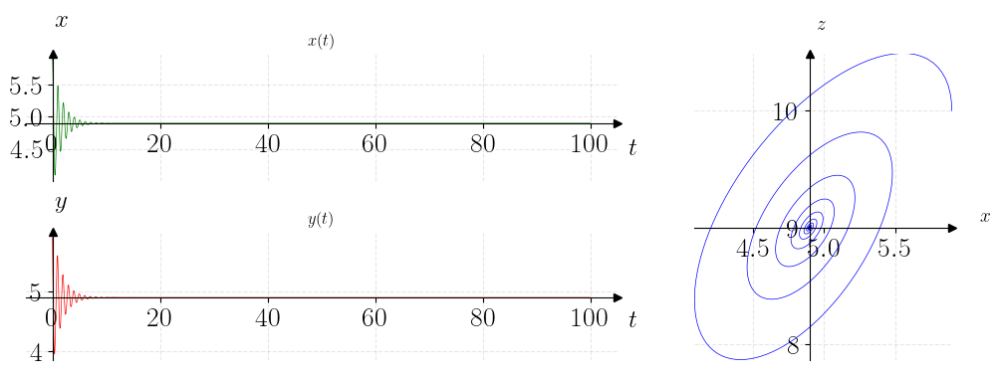

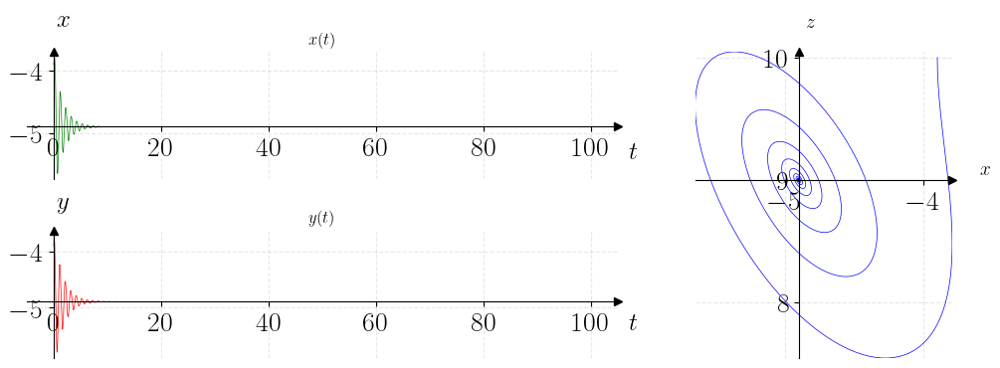

In [132]:
r = 10
b = 8/3
s = 10
dt = 0.01
xt = np.round(fixed_points(8/3, r),2)+1

for x0 in xt[1:]:
    t, M = RK4(Lorenzfunction, [0, 100], (s,b,r), dt, x0)
    x,y,z = M[:,0],M[:,1],M[:,2]
    compute(t, x, y, z)
    plt.show()

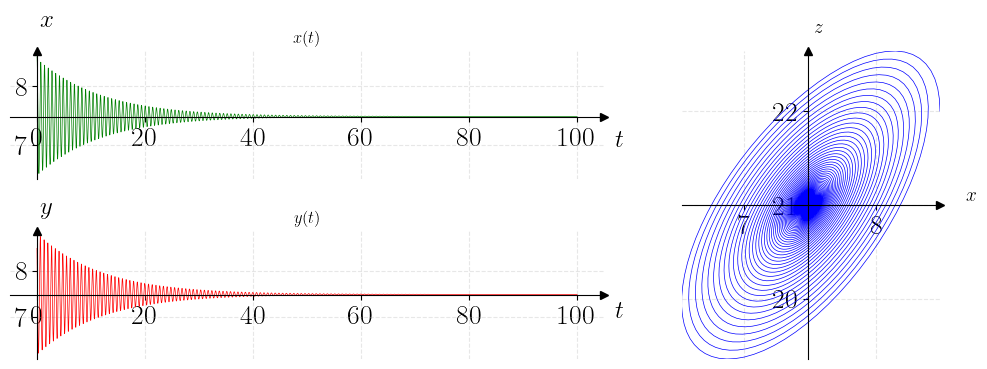

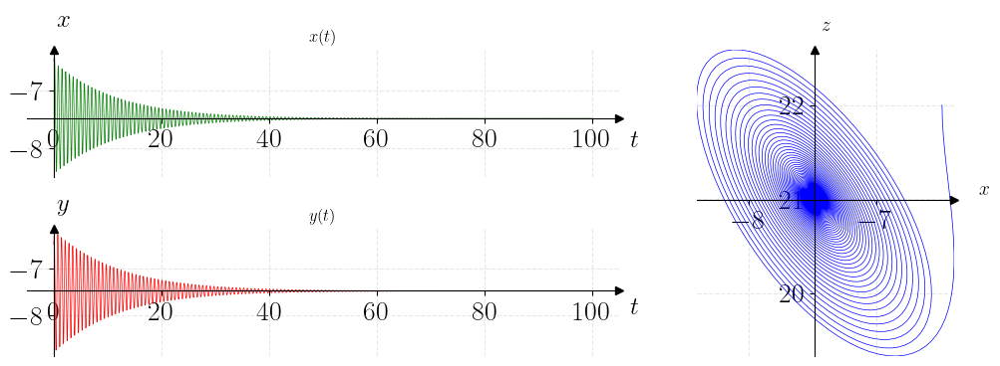

In [133]:
r = 22
b = 8/3
s = 10
dt = 0.01
xt = np.round(fixed_points(8/3, r),2)+1

for x0 in xt[1:]:
    t, M = RK4(Lorenzfunction, [0, 100], (s,b,r), dt, x0)
    x,y,z = M[:,0],M[:,1],M[:,2]
    compute(t, x, y, z)

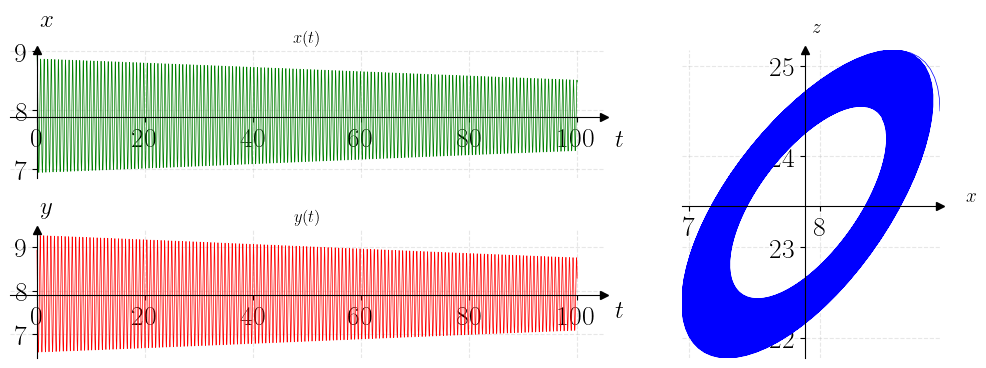

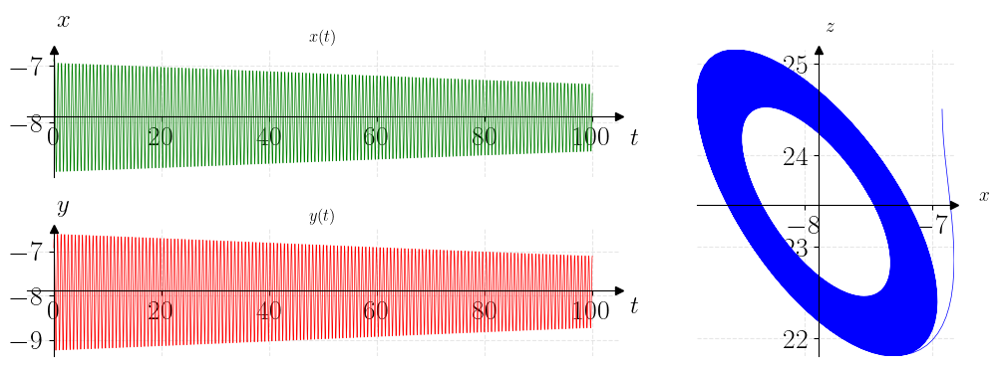

In [134]:
r = 24.5
b = 8/3
s = 10
dt = 0.01
xt = np.round(fixed_points(8/3, r),2)+1

for x0 in xt[1:]:
    t, M = RK4(Lorenzfunction, [0, 100], (s,b,r), dt, x0)
    x,y,z = M[:,0],M[:,1],M[:,2]
    compute(t, x, y, z)

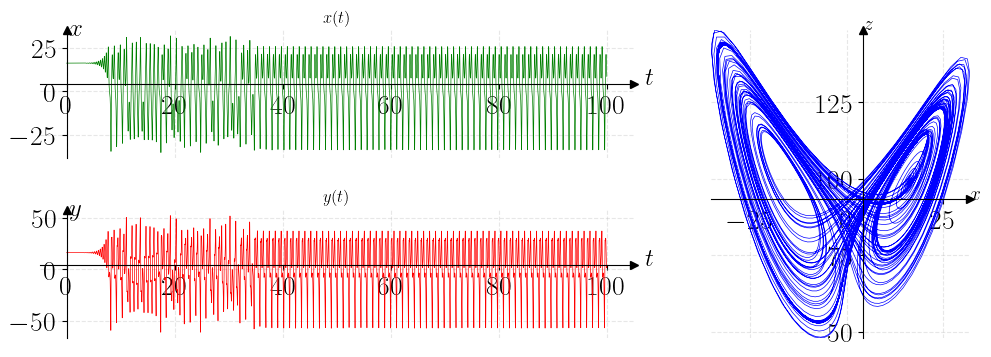

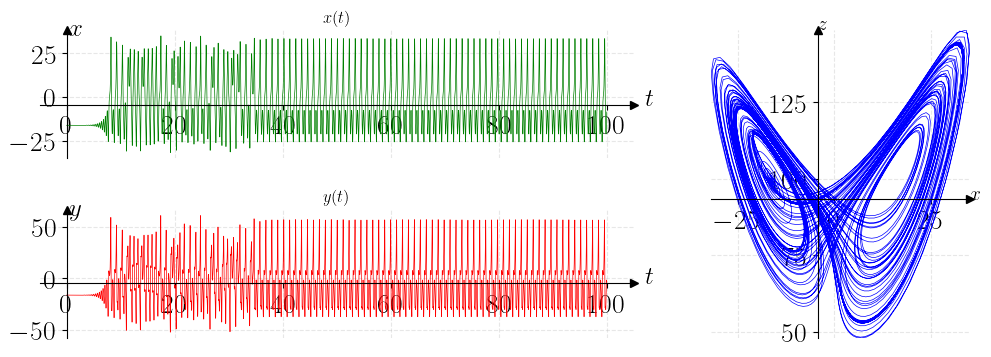

In [135]:
r = 100
b = 8/3
s = 10
dt = 0.01
xt = np.round(fixed_points(8/3, r),2)

for x0 in xt[1:]:
    t, M = RK4(Lorenzfunction, [0, 100], (s,b,r), dt, x0)
    x,y,z = M[:,0],M[:,1],M[:,2]
    compute(t, x, y, z)

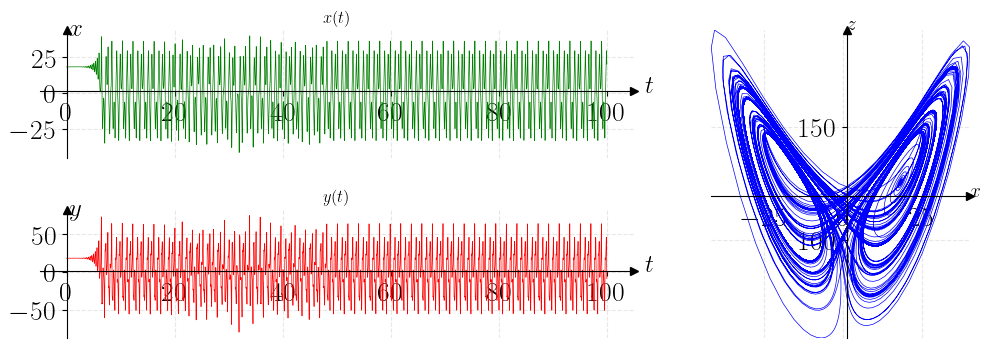

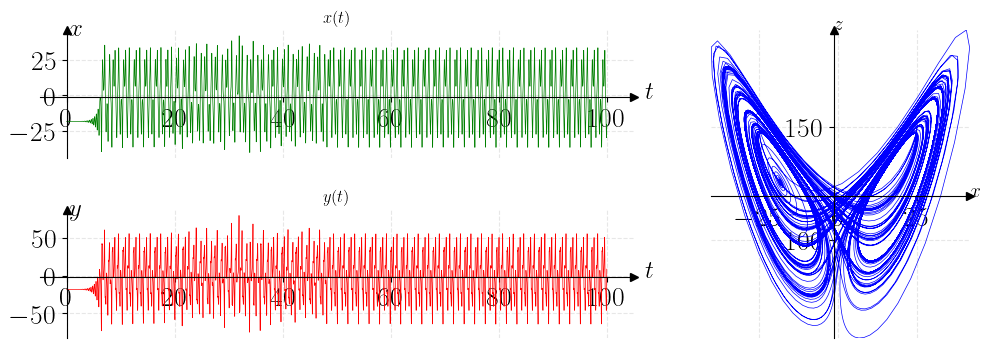

In [136]:
r = 126.52
b = 8/3
s = 10
dt = 0.01
xt = np.round(fixed_points(8/3, r),2)

for x0 in xt[1:]:
    t, M = RK4(Lorenzfunction, [0, 100], (s,b,r), dt, x0)
    x,y,z = M[:,0],M[:,1],M[:,2]
    compute(t, x, y, z)

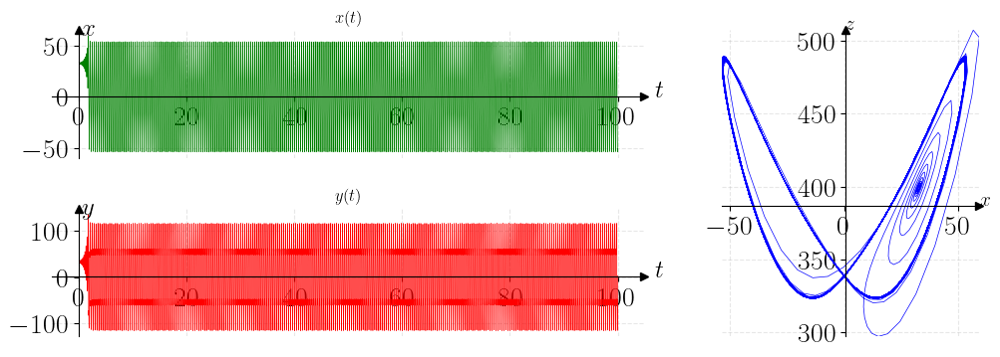

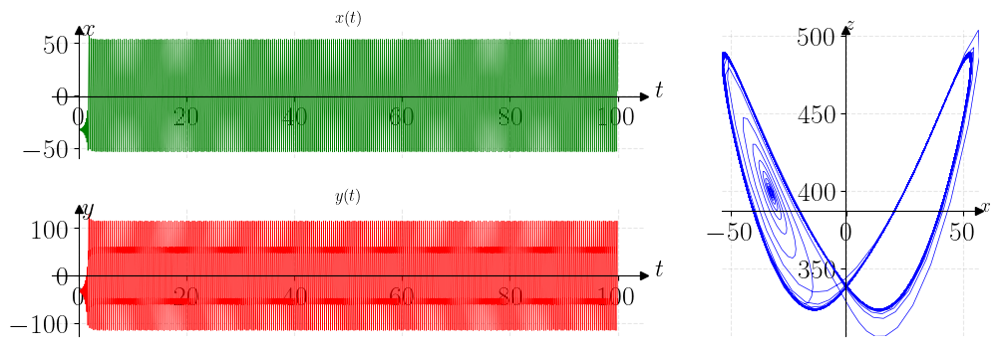

In [137]:
r = 400
b = 8/3
s = 10
dt = 0.01
xt = np.round(fixed_points(8/3, r),2)+1

for x0 in xt[1:]:
    t, M = RK4(Lorenzfunction, [0, 100], (s,b,r), dt, x0)
    x,y,z = M[:,0],M[:,1],M[:,2]
    compute(t, x, y, z)

---

<span style="color:red">9.5 Exploring Parameter Space (Numerical experiments)                                                                    
For each of the values of r given below, use a computer to explore the dynamics of the Lorenz system,                  
assuming $\sigma= 10$ and $\beta=\frac{8}{3}$ as usual. In each case, plot $x ( t ), y ( t ),$ and $x$ vs. $z.$                    
9.5.1 $r = 166.3$ (intermittent chaos)                                                                                           
9.5.2 $r = 212$ (noisy periodicity)                                                                                          
9.5.3 the interval $145 < r < 166$ (period-doubling)<span>

In [199]:
def compute(t, x, y, z, r):
    fig = plt.figure(figsize=(30,15))
    fig.suptitle( r'For $\rho = {}$'.format(r),fontsize=30,y=0.92)
    gs=fig.add_gridspec(3,3)
    ax1=fig.add_subplot(gs[0,0:2])
    ax2=fig.add_subplot(gs[1,0:2])
    ax3=fig.add_subplot(gs[:2,2])
    ax1.text(t[-1]+2 ,-0.8, r'$t$', fontsize=18)
    ax1.text(0.8, np.max(x) + 9, r'$x$', fontsize=18)
    ax2.text(t[-1]+2 ,-0.8, r'$t$', fontsize=18)
    ax2.text(0.8, np.max(y) + 9, r'$y$', fontsize=18)
    ax3.text(np.max(x)+9, np.mean(z)-0.8, r'$x$', fontsize=14)
    ax3.text(np.mean(x)-0.8, np.max(z)+21, r'$z$', fontsize=14)
    customize_axes(ax1, x_p=np.mean(x))
    customize_axes(ax2, x_p=np.mean(y))
    customize_axes(ax3, x_p=np.mean(z), y_p=np.mean(x))
    ax1.plot( t, x,'g', linewidth=0.5)
    ax2.plot( t, y,'r', linewidth=0.7)
    ax3.plot( x, z, linewidth=0.5)
    plt.show()

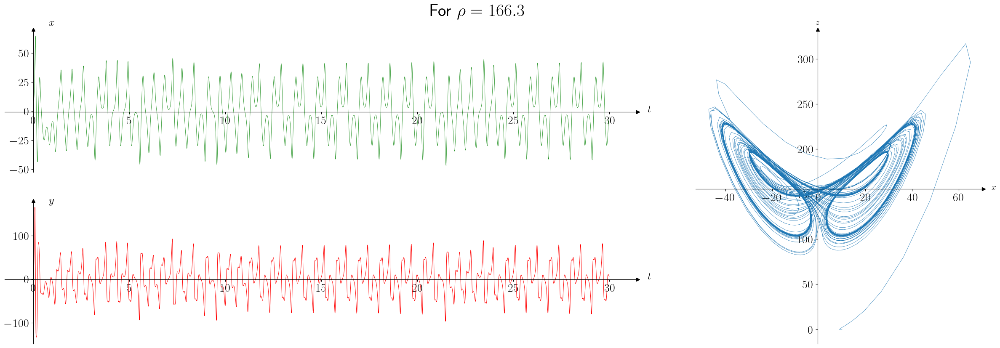

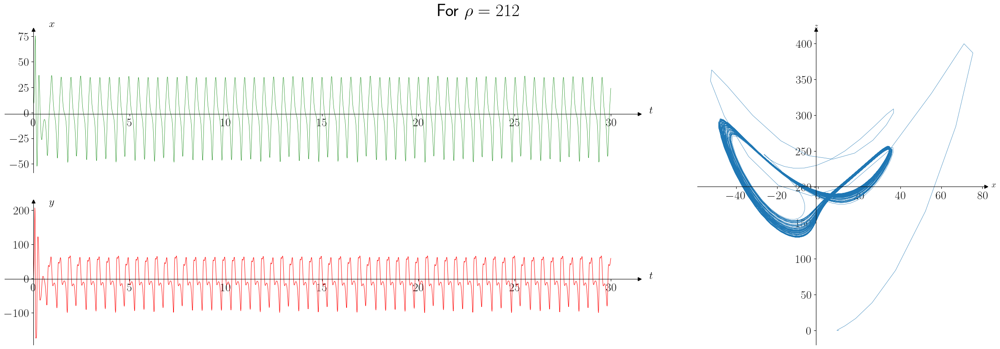

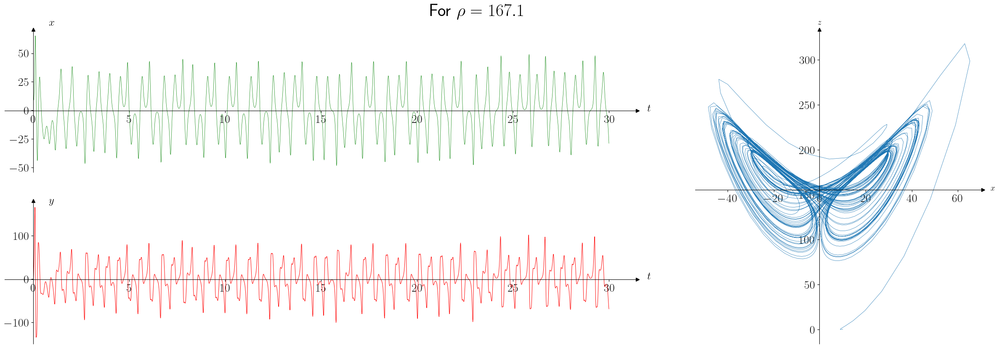

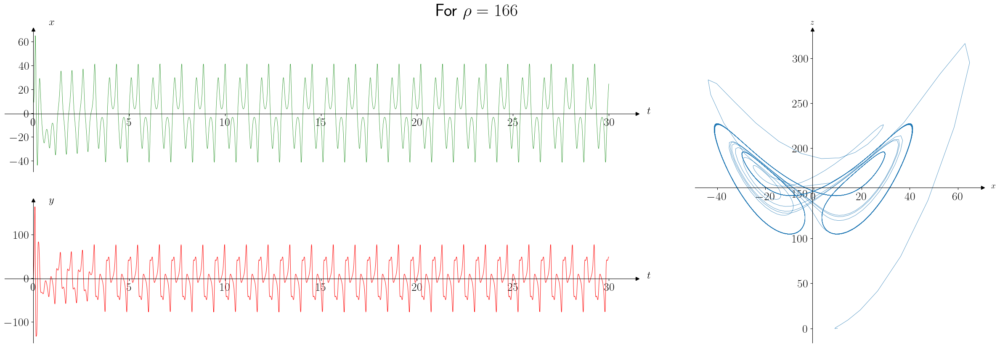

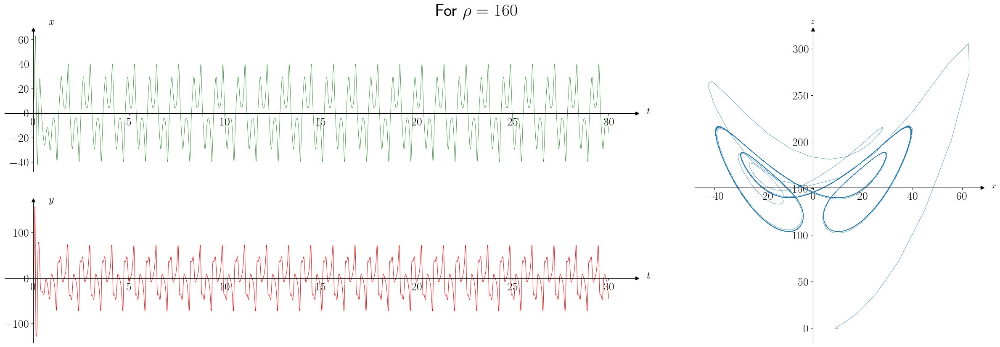

...

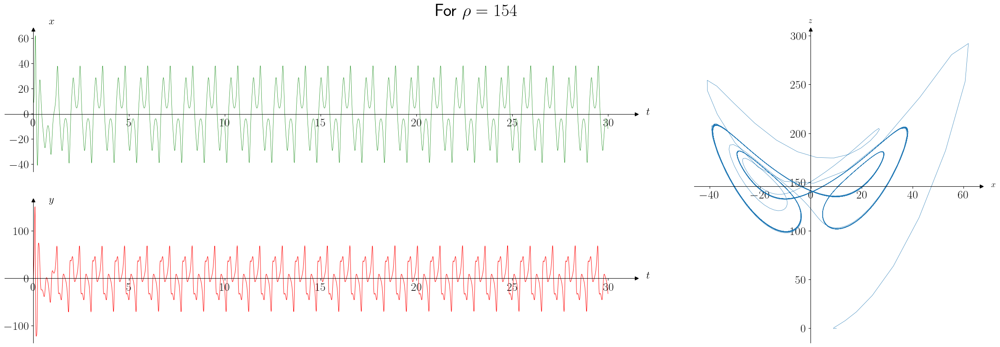

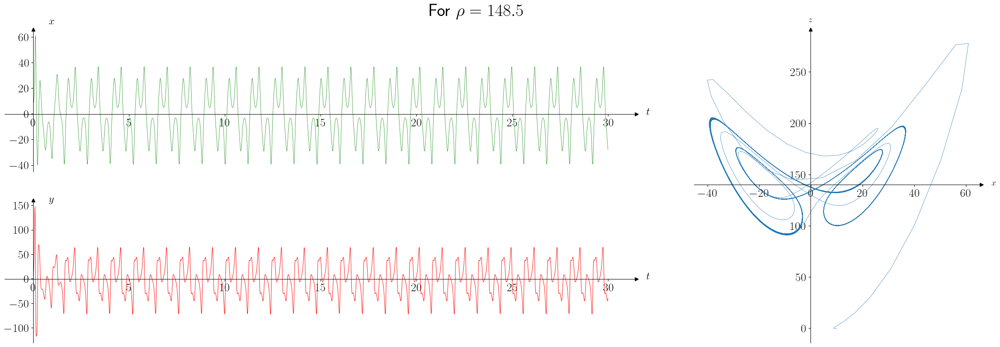

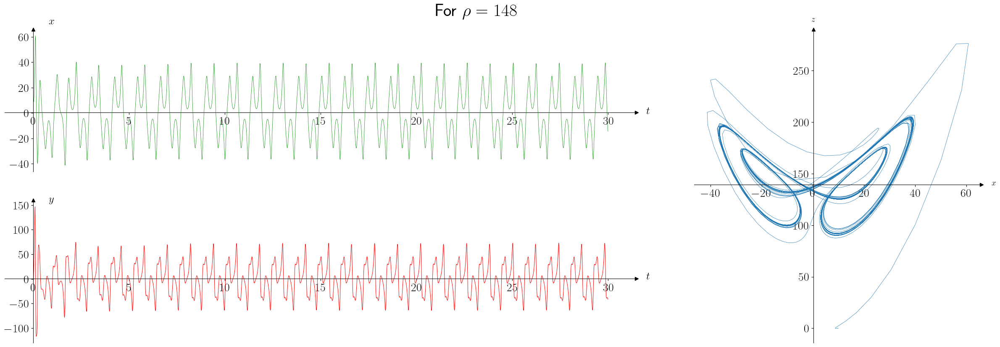

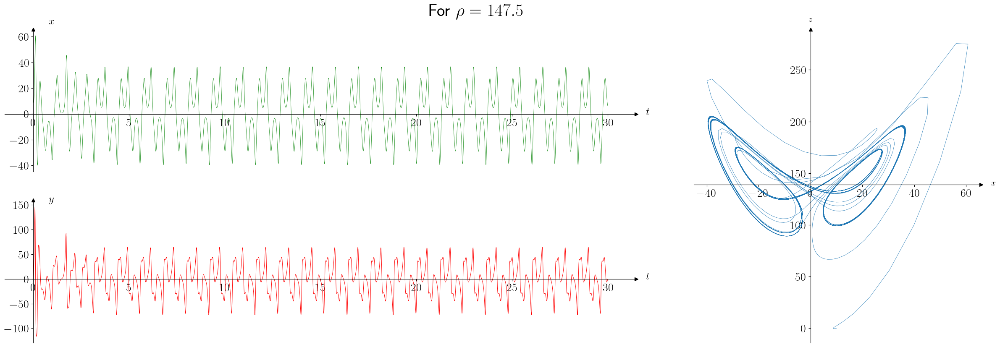

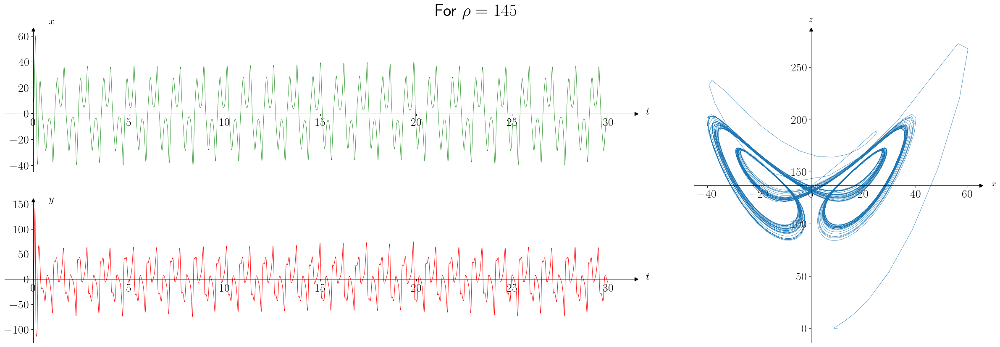

In [200]:
dt = 0.01           # time interval
t_span = [0, 30]
y = [10,-10,0]
sigma = 10.    # constant in Lorentz eqs
b =  8./3.

for r in [166.3, 212, 167.1, 166, 160, 155, 154, 148.5, 148, 147.5, 145]:
    const = sigma, b, r
    t, M = RK4(Lorenzfunction, t_span, const, dt, y)
    xx,yy,zz = M[:,0],M[:,1],M[:,2]
    compute(t, xx, yy, zz, r)

<span style="color:red">(Intermittency in the Lorenz equations)                                                                              
Solve the Lorenz equations numerically for $\sigma = 10, b = 8/3$ , and $r$ near $166$.                                              
a) Show that if $r = 166$, all trajectories are attracted to a stable limit cycle.                                          
Plot both the $xz$ projection of the cycle, and the time series $x(t)$.                                                                                             
b) Show that if $r = 166.2$, the trajectory looks like the old limit cycle for much of the time, but occasionally it is interrupted by chaotic bursts.                                                                                              
This is the signature of intermittency.                                                             
c) Show that as $r$ increases, the bursts become more frequent and last longer.<span>

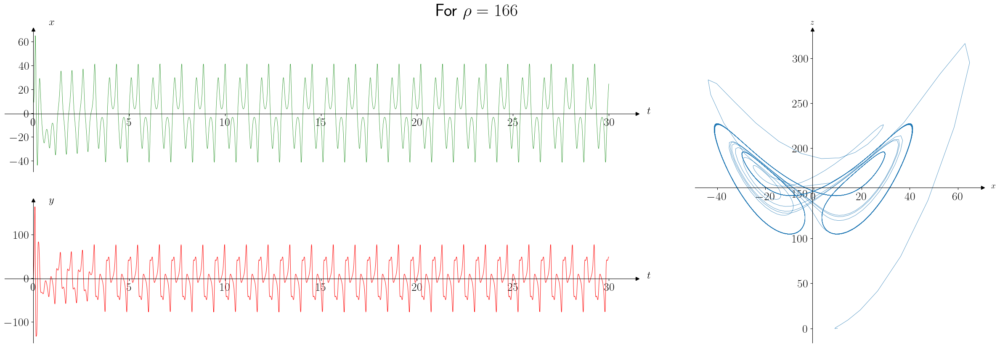

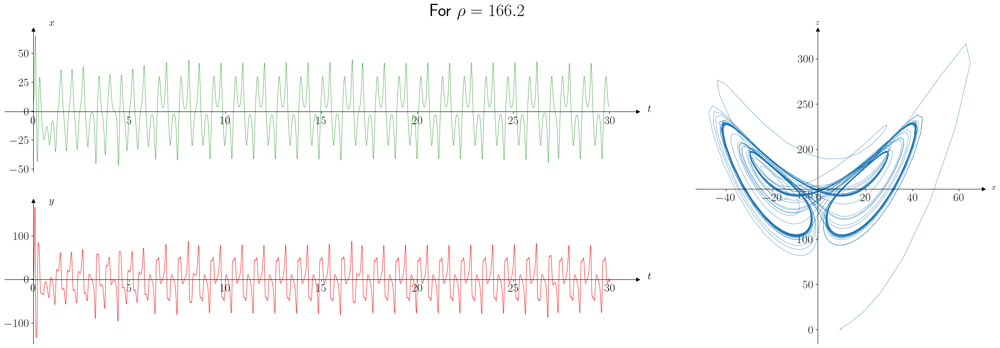

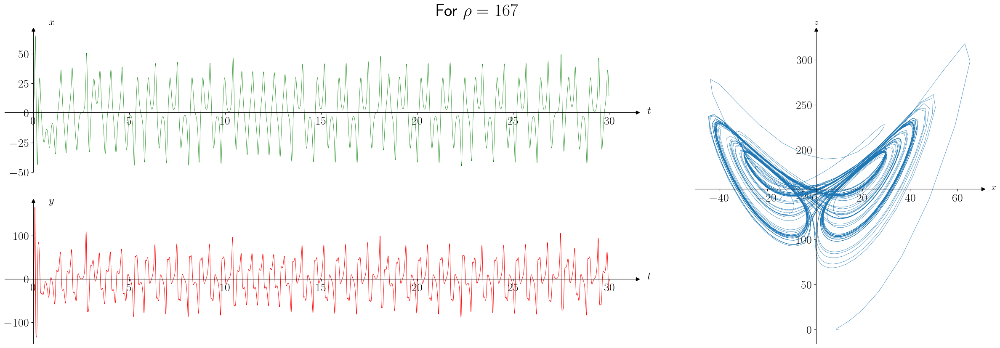

In [201]:
dt = 0.01           # time interval
t_span = [0, 30]
y = [10,-10,0]
sigma = 10.    # constant in Lorentz eqs
b =  8./3.

for r in [166, 166.2, 167]:
    const = sigma, b, r
    t, M = RK4(Lorenzfunction, t_span, const, dt, y)
    xx,yy,zz = M[:,0],M[:,1],M[:,2]
    compute(t, xx, yy, zz, r)

---

<span style="color:red">(Period-doubling in the Lorenz equations)                                                                                  
Solve the Lorenz equations numerically for $\sigma = 10, b = 8/3$ , and $r = 148.5$.                                          
You should find a stable limit cycle. Then repeat the experiment for $r = 147.5$ to see a period-doubled version of this cycle.                                                                                                  
(When plotting your results, discard the initial transient, and use the $xy$ projections of the attractors.)<span>

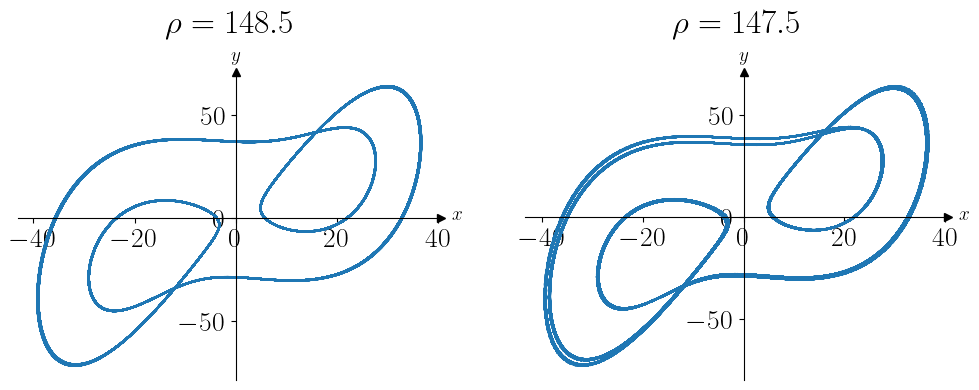

In [180]:
sigma = 10
b = 8/3
r_values = [148.5, 147.5]  # Stable limit cycle and period-doubling
t_span = [0, 200]
dt = 0.01

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
for i,r in enumerate([148.5, 147.5]) :
    const = sigma, b, r
    t, M = RK4(Lorenzfunction, t_span, const, dt, y)
    xx,yy,zz = M[int(100 / dt):,0],M[int(100 / dt):,1],M[int(100 / dt):,2]
    ax[i].plot(xx, yy)
    ax[i].set_title(f'$\\rho={r}$', y=1.1)
    customize_axes(ax[i])
    ax[i].text(np.max(xx)+6, np.mean(yy)-0.8, r'$x$', fontsize=14)
    ax[i].text(np.mean(xx)-0.8, np.max(yy)+12, r'$y$', fontsize=14)

---

<span style="color:red">Numerically integrate the Lorenz system for $r =28, b =8 / 3, \sigma=10.$ and obtain a long time series for $x(t)$.                                       
Then use the attractor-reconstruction method for various values of the delay and plot $(x(t), x(t+\tau))$.                           
Find a value of $\tau$ for which the reconstructed attractor looks similar to the actual Lorenz attractor.                      
How does that $\tau$ compare to typical orbital periods of the system ?

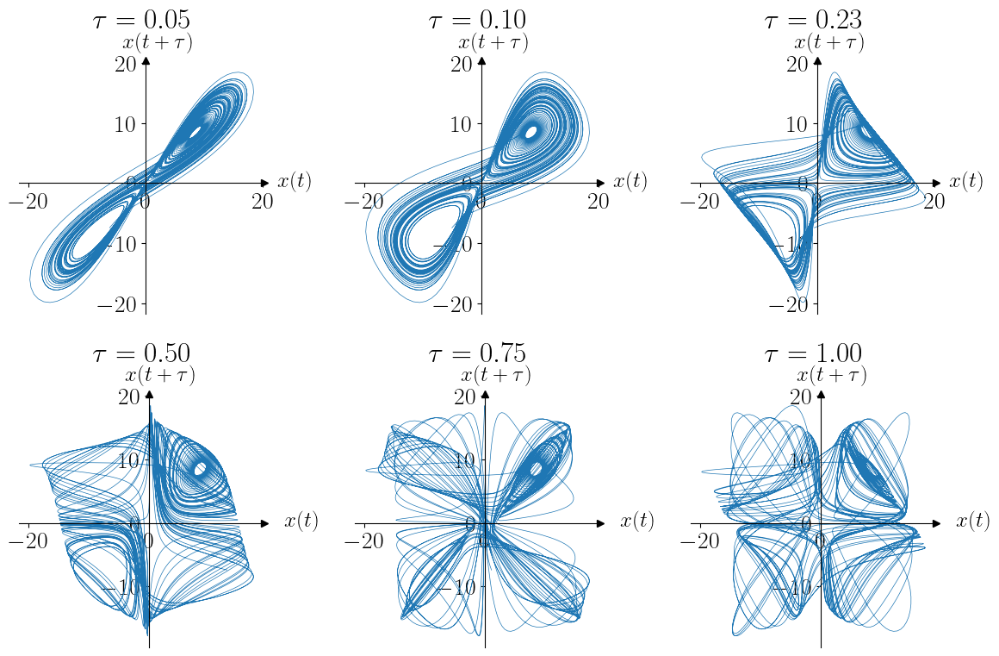

In [148]:
sigma = 10
rho = 28
beta = 8 / 3
dt = 0.01   
t_span = [0, 80]
x0 = [-1.0, 0.0, 0.0]
const = (sigma, beta, rho)
delays = [5,10,23, 50,75, 100]  
tau_values = np.array(delays) * dt

t, trajectory = RK4(Lorenzfunction, t_span, const, dt, x0)
x = trajectory[:, 0]   

plt.figure(figsize=(12, 8))
for i, delay in enumerate(delays):
    ax = plt.subplot(2, 3, i + 1)  # Keep this as the Axes object
    ax.plot(x[:-delay], x[delay:], lw=0.5)  # Just call plot; don't assign it
    ax.set_title(rf"$ \tau = {tau_values[i]:.2f}$",y=1.1)
    #ax.set_xlabel("$x(t)$")
    #ax.set_ylabel("$x(t+\\tau)$")
    customize_axes(ax)
    ax.text(-4, np.max(x) + 4, r'$x(t+\tau)$', fontsize=18)
    ax.text(np.max(x) + 4, -0.5, r'$x(t)$', fontsize=18)
plt.tight_layout()
plt.show()

---

<span style="color:red">In their signal-masking approach, Cuomo and Oppenheim (1992, 1993) use the following receiver dynamics:                               
$\qquad\begin{aligned} \dot{x}_r &= \sigma(y_r − x_r) \\ \dot{y}_r &= r s(t) − y_r − s(t) z_r \\ \dot{z}_r &= s(t) y_r − b z_r \end{aligned}$                                                                                                                      
where $s(t) = x(t) +m(t)$, and $m(t)$ is the low-power message added to the much stronger chaotic mask $x(t)$.                           
If the receiver has synchronized with the drive, then $x_r(t) ≈ x(t)$ and so $m(t)$ may be recovered as $\hat{m}(t) = s(t) − x_r(t)$.       
Test this approach numerically, using a sine wave for $m(t)$. How close is the estimate $\hat{m}(t)$ to the actual message $m(t)? $       
How does the error depend on the frequency of the sine wave $?$


The idea here is that the receiver and transmitter will still synchronize even though we aren't transmitting $x(t)$                                       
but $s(t) = x(t)+m(t)$ instead.                                                                                                
As long as $m(t)$ has a small amplitude relative to $x(t)$ on the strange attractor,                                        
then $s(t)≈x(t)$ and the receiver $x_r(t)$ should still synchronize to the transmitter's $x(t)$ pretty closely.                                                        
In all the following simulations, we start the transmitter and receiver variables at                                        
$(x; y; z) = (x_r; y_r; z_r) = (7.6200; 9.6101; 48.3368)$,                                                                    
which is already close to the Lorenz attractor since we assume the receiver and transmitter will synchronize.                
Then we add a sine wave $A\sin(2\pi ft) \ (A = 0.1$ and $f$ is varied $)$ to $x_r$ and simulate for ten periods of the sine wave.                                                                                                                        
Lastly, we simulate for ten more periods of the sine wave, record $E(f) = max|m(t)-\hat{m}(t)|$ for this time interval,        
and graph the results from $1 Hz$ to $20,000 Hz$.                                                                                   
Parameters : $ r = 60, \ \sigma = 10 \  b = \frac{8}{3}$

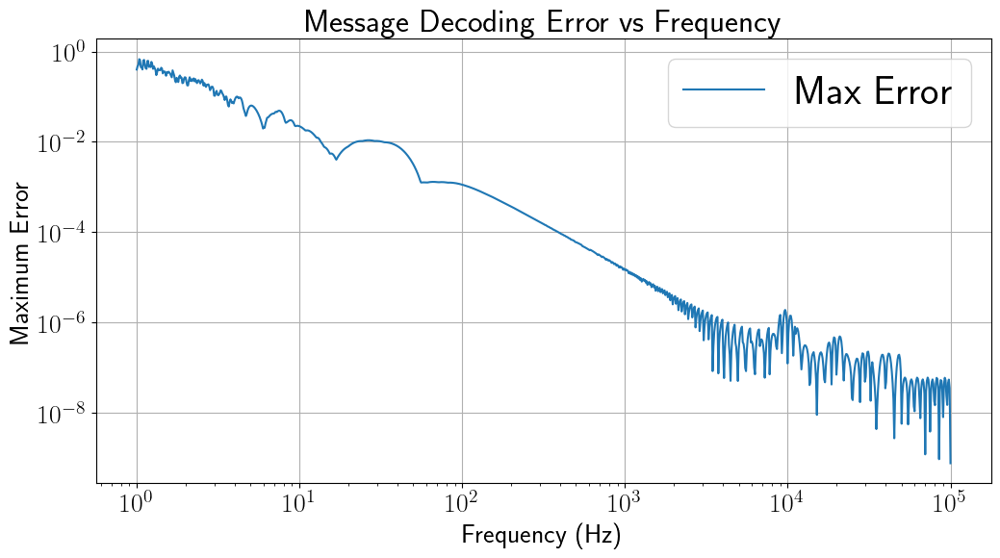

In [5]:
def RK4_step(f, t, state, dt, *args):          # RK4 integrator
    k1 = f(t, state, *args)
    k2 = f(t + 0.5 * dt, state + 0.5 * k1 * dt, *args)
    k3 = f(t + 0.5 * dt, state + 0.5 * k2 * dt, *args)
    k4 = f(t + dt, state + k3 * dt, *args)
    return state + (k1 + 2 * k2 + 2 * k3 + k4) * dt / 6

def lorenz_transmitter(t, state):               # Lorenz transmitter equations
    x, y, z = state
    dx = sigma * (y - x)
    dy = r * x - y - x * z
    dz = x * y - b * z
    return np.array([dx, dy, dz])

def lorenz_receiver(t, state, transmitter_x, m):  # Lorenz receiver equations
    xr, yr, zr = state
    s = transmitter_x + m
    dxr = sigma * (yr - xr)
    dyr = r * s - yr - s * zr
    dzr = s * yr - b * zr
    return np.array([dxr, dyr, dzr])

sigma = 10
r = 60
b = 8 / 3
A = 0.1                                # Amplitude of the sine wave
frequencies = np.logspace(0, 5, 1000)  # More points for smoother curve
dt = 0.0001                              # Time step
T_periods = 10                         # Number of sine wave periods to simulate
errors = []

for f in frequencies:
    time = np.arange(0, T_periods / f, dt)  # Simulate for 10 periods of sine wave
    m = A * np.sin(2 * np.pi * f * time)    # Generate sine wave message
    transmitter = np.array([7.6200, 9.6101, 48.3368])
    receiver = transmitter.copy()
    for t in time[: len(time) // 2]:
        transmitter = RK4_step(lorenz_transmitter, t, transmitter, dt)
        receiver = RK4_step(lorenz_receiver, t, receiver, dt, transmitter[0], 0)  # No message during transient
    max_error = 0
    for t, msg in zip(time[len(time) // 2 :], m[len(time) // 2 :]):
        transmitter = RK4_step(lorenz_transmitter, t, transmitter, dt)
        receiver = RK4_step(lorenz_receiver, t, receiver, dt, transmitter[0], msg)
        estimated_m = transmitter[0] + msg - receiver[0]# Estimate message
        max_error = max(max_error, abs(msg - estimated_m))
    errors.append(max_error) # Record maximum error for this frequency

plt.figure(figsize=(12, 6))
plt.semilogy(frequencies, errors, label="Max Error")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Maximum Error")
plt.title("Message Decoding Error vs Frequency")
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
# Lorenz transmitter
def lorenz(X):
    x, y, z = X
    dx = sigma * (y - x)
    dy = r * x - y - x * z
    dz = x * y - b * z
    return np.array([dx, dy, dz])

# Receiver system
def receiver(Xr, s):
    xr, yr, zr = Xr
    dxr = sigma * (yr - xr)
    dyr = r * s - yr - s * zr
    dzr = s * yr - b * zr
    return np.array([dxr, dyr, dzr])

# RK4 integrator step
def rk4_step(f, X, dt, *args):
    k1 = dt * f(X, *args)
    k2 = dt * f(X + 0.5 * k1, *args)
    k3 = dt * f(X + 0.5 * k2, *args)
    k4 = dt * f(X + k3, *args)
    return X + (k1 + 2 * k2 + 2 * k3 + k4) / 6

sigma = 10
r = 60
b = 8 / 3
A = 0.1  # Amplitude of the message
dt = 1e-6  # Time step
frequencies = np.logspace(np.log10(1), np.log10(200000), num=50)  # 50 log-spaced frequencies
initial_state = np.array([7.6200, 9.6101, 48.3368])
errors = []

for f in frequencies:
    T = 10 / f  # one period
    t = np.arange(0, 2 * T, dt)
    x = np.zeros((len(t), 3))
    xr = np.zeros((len(t), 3))
    m = A * np.sin(2 * np.pi * f * t)
    s = np.zeros(len(t))
    mhat = np.zeros(len(t))
    
    x[0] = initial_state
    xr[0] = initial_state

    for i in range(len(t) - 1):
        x[i+1] = rk4_step(lambda X: lorenz(X), x[i], dt)
        s[i] = x[i, 0] + m[i]
        xr[i+1] = rk4_step(lambda X: receiver(X, s[i]), xr[i], dt)

    s[-1] = x[-1, 0] + m[-1]
    mhat = s - xr[:, 0]
    
    # Only compute error on second half of the data (last 10 periods)
    #cutoff = len(t) // 2
    #error = np.max(np.abs(m[cutoff:] - mhat[cutoff:]))
    error = np.max(np.abs(m - mhat))
    errors.append(error)

frequencies, errors


In [ ]:
plt.figure(figsize=(12, 6))
plt.semilogy(frequencies, errors, label="Max Error")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Maximum Error")
plt.title("Message Decoding Error vs Frequency")
plt.grid(True)
plt.legend()
plt.show()

### $\text{Point-wise and Correlation Dimensions}$ 

First we generate a set of very many points ${x_i , i =1, . . . , n}$ on the attractor by letting the system evolve for a long time                                                                                                                         
(after taking care to discard the initial transient, as usual).                                                     
To get better statistics, we could repeat this procedure for several different trajectories.                                   
In practice, however, almost all trajectories on a strange attractor have the same long-term statistics                       
so it’s sufficient to run one trajectory for an extremely long time.                                                                                
**Grassberger and Procaccia (1983)** proposed an efficient approach that has become standard.                                    
Fix a point $\mathbf{x}$ on the attractor $A$. Let $N_x (\varepsilon)$ denote the number of points on $A$ inside a ball of radius $\varepsilon$ about $\mathbf{x}$                                                                                                                
Most of the points in the ball are unrelated to the immediate portion of the trajectory through $\mathbf{x};$                 
instead they come from later parts that just happen to pass close to $\mathbf{x}.$                                                    
Thus $N_x(\varepsilon)$ measures how frequently a typical trajectory visits an $\varepsilon$ neighborhood of $\mathbf{x}.$                      
Now vary $\varepsilon$. As $\varepsilon$ increases, the number of points in the ball typically grows as a power law:              
$\qquad N_x(\varepsilon) \varpropto \varepsilon^d,$                                                                                                
where $d$ is called the **pointwise dimension** at $\mathbf{x}$.                                                
The **pointwise dimension** can depend significantly on $\mathbf{x};$ it will be smaller in rarefied regions of the attractor.                                                                                             
To get an overall dimension of $A,$ one averages $N_x(\varepsilon)$ over many $\mathbf{x}.$                          
The resulting quantity $C (\varepsilon)$ is found empirically to scale as                                    
$ \qquad C(\varepsilon)\varpropto d,$                                                                       
where $d$ is called the **correlation dimension**.                                                                                     
The correlation dimension takes account of the density of points on the attractor, and thus differs from the box dimension,   
which weights all occupied boxes equally, no matter how many points they contain. (Mathematically speaking,                 
the correlation dimension involves an invariant measure supported on a fractal, not just the fractal itself.)                                                                                                                 
In general, $d_{correlation}\le d_{box},$ although they are usually very close.                                                         
To estimate $d,$ one plots $\log C (\varepsilon)$ vs. $\log \varepsilon$.                                                    
If the relation $C(\varepsilon) \varpropto d,$ were valid for all $\varepsilon$, we’d find a straight line of slope $d$.      
In practice, the power law holds only over an intermediate range of $\varepsilon$.                                           
<img height="100" width="800" src="https://raw.githubusercontent.com/Chaks1603/Storage/main/rrf.jpg">                                                                     
The curve saturates at large $\varepsilon$ because the $\varepsilon$-balls engulf the whole attractor and so $N_x (\varepsilon)$ can grow no further.                                                                                                                          
On the other hand, at extremely small $\varepsilon$, the only point in each $\varepsilon$-ball is $\mathbf{x}$ itself.             
So the power law is expected to hold only in the scaling region where                                                                
$\qquad ( \text{minimum separation of points on} A) << \varepsilon<< ( \text{diameter of} A).$               
<img width="300" src="https://raw.githubusercontent.com/Chaks1603/Storage/main/ppo.jpg">

In [24]:
def compute_lorenz_trajectory(t_span, dt, initial_state, const):

    def wrapper(t, y):
        return Lorenzfunction(t, y, const)
    
    t = np.arange(t_span[0], t_span[1], dt)
    sol = sc.integrate.solve_ivp(wrapper, t_span, initial_state, t_eval=t, method="RK45")
    return sol.t, sol.y.T

def correlation_sum(trajectory, r):
    pairwise_distances = sc.spatial.distance.pdist(trajectory, metric="euclidean")
    return np.sum(pairwise_distances < r) / len(pairwise_distances)

def compute_correlation_dimension(trajectory, r_values):
    C_r = [correlation_sum(trajectory, r) for r in r_values]
    return np.log(r_values), np.log(C_r)

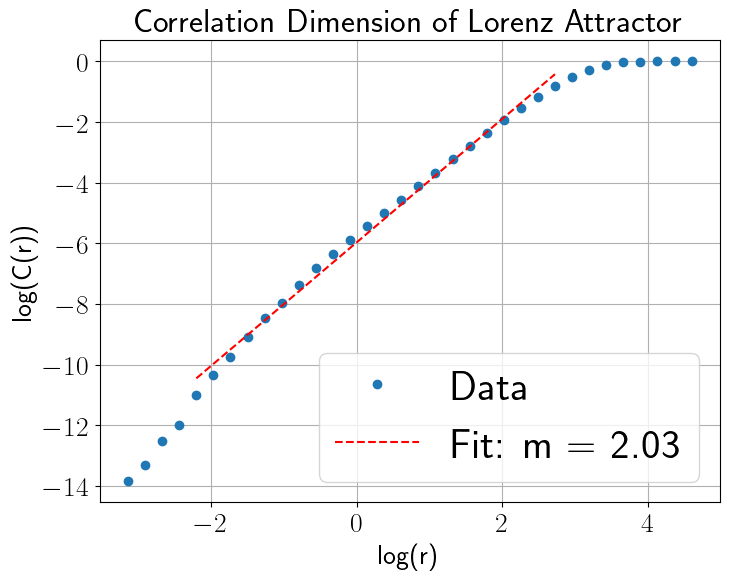

In [39]:
r = 28
s = 10
b = 8/3
const = (s,b,r)
t_span = (0, 50)
dt = 0.01
initial_state = [1, 1, 1]
r_values = np.logspace(-3,2, 50)  # Logarithmically spaced radii

t, trajectory = compute_lorenz_trajectory(t_span, dt, initial_state, const)
log_r, log_C_r = compute_correlation_dimension(trajectory, r_values)
m,c = fit(log_r[20:42], log_C_r[20:42])

plt.figure(figsize=(8, 6))
plt.plot(log_r, log_C_r, "o", label="Data")
plt.plot(log_r[20:42], m * log_r[20:42] + c, "r--", label=f"Fit: m = {m:.2f}")
plt.xlabel("log(r)")
plt.ylabel("log(C(r))")
plt.title("Correlation Dimension of Lorenz Attractor")
plt.legend()
plt.grid()
plt.show()

---

<span style="color:red">(Rikitake model of geomagnetic reversals)                                                                                                                      
 Consider the system                                                                                                                                       
$\qquad\begin{aligned}
\dot{x} &= -vx + zy\, \\
\dot{y} &= -vy + (z-a)x\, \\
\dot{z} &= 1-xy
\end{aligned}$                                                                                                                                              
where $a, v > 0$ are parameters.                                                                                                                                
a) Show that the system is dissipative.                                                                                                                      
b) Show that the fixed points may be written in parametric form as $x^{*} = \pm\, k \, , y^{*}=\pm\, k^{–1}\, , z^{*}= vk^2\, ,$ where $v ( k^2 – k^{–2} ) = a$.        
c) Classify the fixed points.                                                                                                                                  
These equations were proposed by **Rikitake (1958)** as a model for the self-generation of the Earth’s magnetic field by large current-carrying eddies in the core.                                                                                                                                                 
Computer experiments show that the model exhibits chaotic solutions for some parameter values.                                                           
These solutions are loosely analogous to the irregular reversals of the Earth’s magnetic field inferred from geological data.                             
See **Cox (1982)** for the geophysical background.<span>

---


### a) Dissipative

The divergence of the vector field

$$\begin{aligned} \mathbf{F}(x,y,z) &= \mathbf{\hat{x}}\Big(-vx+zy \Big)+\mathbf{\hat{y}}\Big(-vy+(z-a)x\Big)+\mathbf{\hat{z}}\Big(1-xy\Big). \\
\nabla\cdot\mathbf{F} &=\frac{\partial}{\partial x}\Big(-vx+zy \Big)+\frac{\partial}{\partial y}\Big(-vy+(z-a)x\Big)+\frac{\partial}{\partial z}\Big(1-xy\Big) =-v +(-v) +0 = -2v. \end{aligned}$$

Since $v>0$ we have $\nabla\cdot\mathbf{F}=-2v<0$ everywhere, so the flow is volume-contracting (dissipative).


### b) Fixed points (parametric form)

Set $\dot x=\dot y=\dot z=0$.

From $\dot z=0$ ,

$$1-xy=0 \quad\Rightarrow\quad xy=1 \quad\Rightarrow\quad y=\frac{1}{x}. \tag{1}$$

Plug into $\dot x=0$ ,

$$-v x + z y =0 \Rightarrow zy = vx \Rightarrow z\frac{1}{x} = vx \Rightarrow z = v x^2. \tag{2}$$

Using $(1)\, \& \,(2)$ in $\dot y=0$,

$$0=-v y + (z-a)x = -v\frac{1}{x} + (v x^2 - a)x.$$

Multiply by $x$,

$$-v + v x^4 - a x^2 = 0 \quad\Rightarrow\quad v x^4 - a x^2 - v =0. \tag{3}$$

Let $k=|x|$.                                                                                                                                                   
$$v k^4 - a k^2 - v =0. \tag{4}$$

$$ v \left( k^2 \right)^2 - a k^2 - v =0.$$

The quadratic eqn.

$$ k^2 = \frac{-(-a) \pm \sqrt{(-a)^2 - 4\cdot v\cdot (-v)}}{2v} = \frac{a \pm \sqrt{a^2 + 4v^2}}{2v}$$

$$ k = \sqrt{\frac{a \pm \sqrt{a^2 + 4v^2}}{2v}} \tag{5}$$

From $(4)$,

$$v k^4 - a k^2 - v =0$$

Dividing both side by $k^2$,

$$v k^2 - a - \frac{v}{k^2} =0$$

$$a =v\left( k^2  - \frac{1}{k^2}\right)=v\left( k^2  - k^{-2}\right) \tag{6}$$

Thus the fixed points may be written as

$$\begin{aligned}x^* &=\pm k\,\\ \qquad y^* &=\pm k^{-1}\, [\, \text{ from }(1) \,] \\ \qquad z^* &=v k^2 \,\;\;\; [\, \text{ from }(2) \,] \end{aligned}$$

Now then,
$$a=v(k^2-k^{-2})>0 \quad\Rightarrow\quad \frac{a}{v}=(k^2-k^{-2})>0 \quad\Rightarrow\quad k^2>k^{-2} \quad\Rightarrow\quad k^4 > 1 \quad\Rightarrow\quad k^2 > 1 \quad\Rightarrow\quad k > 1 \, .$$



### c) Linearization and classification

Jacobian 
$$
J^* = 
\begin{pmatrix}
-v & v k^2 & k^{-1}  \\
v k^{-2} & -v & k  \\
-k^{-1} & -k & 0
\end{pmatrix}.
$$

We want to compute $\det(J^* - \lambda I)=0$ :

$$
J^* - \lambda I =
\begin{pmatrix}
-v - \lambda & v k^2 & k^{-1} \\
v k^{-2} & -v - \lambda & k  \\
-k^{-1} & -k & -\lambda
\end{pmatrix}.
$$


Let

$$
A = -v - \lambda, \quad B = v k^2, \quad C = k^{-1}.
$$

Then

$$ \det(J^* - \lambda I) = A \begin{vmatrix} -v - \lambda & k \\ -k & -\lambda \end{vmatrix} - B \begin{vmatrix}  v k^{-2} & k \\   -k^{-1} & -\lambda
  \end{vmatrix} + C   \begin{vmatrix}  v k^{-2} & -v - \lambda \\   -k^{-1} & -k  \end{vmatrix} \, =\, 0. $$


1. First minor:

$$
\begin{vmatrix}
-v - \lambda & k \\
-k & -\lambda
\end{vmatrix}
= (-v - \lambda)(-\lambda) - (k)(-k)
= \lambda(v + \lambda) + k^2.
$$

2. Second minor:

$$
\begin{vmatrix}
v k^{-2} & k \\
-k^{-1} & -\lambda
\end{vmatrix}
= v k^{-2}(-\lambda) - k(-k^{-1})
= -v\lambda k^{-2} + 1.
$$

3. Third minor:

$$
\begin{vmatrix} v k^{-2} & -v - \lambda \\ -k^{-1} & -k \end{vmatrix} = v k^{-2}(-k) - (-v - \lambda)(-k^{-1}) = -v k^{-1} - (v + \lambda)k^{-1}
= -(2v + \lambda)k^{-1}.$$

Thus,

$$\begin{aligned} \det(J^* - \lambda I)
&= (-v - \lambda)\big[\lambda(v + \lambda) + k^2\big] -v k^2\big[-v\lambda k^{-2} + 1\big] + k^{-1}\big[-(2v + \lambda)k^{-1}\big] \\
&= -(v + \lambda)\big[\lambda(v + \lambda) + k^2\big] + v k^2(v\lambda k^{-2} - 1) - (2v + \lambda)k^{-2}.
\end{aligned}$$


Expand the first term ,

$$
-(v + \lambda)\big[\lambda(v + \lambda) + k^2\big]
= -\lambda^3 - 2v\lambda^2 - v^2\lambda - \lambda k^2 - v k^2.
$$

The second term,

$$
v k^2(v\lambda k^{-2} - 1) = v^2\lambda - v k^2.
$$

The third term,

$$
-(2v + \lambda)k^{-2} = -2v k^{-2} - \lambda k^{-2}.
$$

Combine everything,

$$\begin{aligned}
\det(J^* - \lambda I)
&= -\lambda^3 - 2v\lambda^2 - v^2\lambda - \lambda k^2 - v k^2 + v^2\lambda - v k^2 - 2v k^{-2} - \lambda k^{-2} \\
&= -\lambda^3 - 2v\lambda^2 - 2v k^2 - \lambda k^2 - 2v k^{-2} - \lambda k^{-2} \\
&= -\lambda^3 - 2v\lambda^2 - \lambda(k^2 + k^{-2}) - 2v(k^2 + k^{-2}) \\
&= -(\lambda + 2v)\lambda^2 - (\lambda+ 2v)(k^2 + k^{-2}) \\
&= -(\lambda + 2v)(\lambda^2 + k^2 + k^{-2}) \\
&= 0
\end{aligned}$$

Thus,
$$\lambda + 2v = 0 \qquad\qquad\qquad\qquad\qquad\qquad \lambda^2 + k^2 + k^{-2} = 0$$

The roots satisfy either factor being zero:

1. Linear factor    :

$$
\lambda + 2v = 0 \quad \implies \quad \lambda_1 = -2v,
$$

2. Quadratic factor  :

$$
\lambda^2 + k^2 + k^{-2} = 0 \quad \implies \quad \lambda_{2,3} = \pm i \sqrt{k^2 + k^{-2}}.
$$


**Interpretation / classification**

* One real eigenvalue $\lambda_1=-2v<0$, a single contracting direction (1D stable manifold).
* A purely imaginary pair $\lambda_{2,3}=\pm i\omega$ with $\omega=\sqrt{k^2+k^{-2}}>0$, a two-dimensional center (oscillatory) subspace.

Therefore each fixed point is **non-hyperbolic**  
it has a one-dimensional stable direction and a two-dimensional center manifold.                       
In dynamical-systems terminology this is often called a **saddle–center** type contraction along one direction, neutral oscillations in the transverse 2D manifold.                                                                                                               
Linearization does **not** give asymptotic stability (the presence of purely imaginary eigenvalues means the linear test is inconclusive for the 2D subspace),                                                                                                                                             
so nonlinear terms determine whether nearby trajectories produce sustained oscillations (periodic orbits), quasiperiodic motion, or more complicated behavior                                                                                                                                                  
(the Rikitake system is known to exhibit oscillatory reversals and complex dynamics).


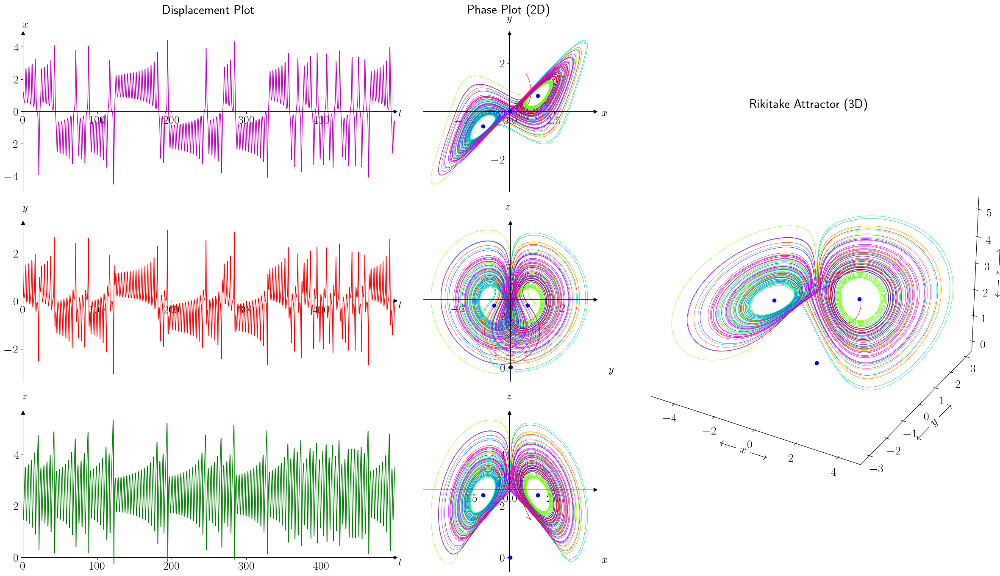

In [92]:
def Rikitake(t, y,const):      
    a, v = const                      # constant in Rikitake eqns
    dx = -v*y[0] + y[1]*y[2]          # dx/dt =  -v*x + y*z
    dy = -v*y[1] + (y[2] - a)*y[0]    # dy/dt =  -v*y + (z-a)*x
    dz = 1 - y[0]*y[1]                # dz/dt =   1   + x*y
    return np.array([dx, dy, dz])

def rikitake_fixed_points(a, v):
    points = []
    points.append((0.0, 0.0, 0.0))
    discriminant = np.sqrt(a**2 + 4*v**2)
    X1 = (a + discriminant) / (2*v)
    X2 = (a - discriminant) / (2*v)
    for X in [X1, X2]:
        if X > 0:                       # only positive real solutions
            x = np.sqrt(X)
            y = 1 / x
            z = v * x**2
            points.append(( x,  y, z))
            points.append((-x, -y, z))  # symmetric points
    return np.array(points)


dt = 0.001
t_span = [0, 500]

# constants
v = 1
a = 2
const = a, v

# initials
x0 = 0.8961
y0 = 1.5605
z0 = 1.5605
init_main = [x0, y0, z0]
t, M = RK4( Rikitake, t_span, const, dt, init_main)
xx, yy, zz = M[:, 0], M[:, 1], M[:, 2]

fig = plt.figure(figsize=(24, 14))
'''fig.suptitle('Rikitake System )'''

# Grid spec
gs = fig.add_gridspec(3, 5)
ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[1, 0:2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[0, 2])
ax5 = fig.add_subplot(gs[1, 2])
ax6 = fig.add_subplot(gs[2, 2])
ax7 = fig.add_subplot(gs[0:3, 3:5], projection='3d')

# Time series labels
for ax, data, label in zip([ax1, ax2, ax3], [xx, yy, zz], ['x', 'y', 'z']):
    ax.set_xlim([t[0], t[-1]])
    ax.text(-0.5, np.max(data) + 0.8, fr'${label}$', fontsize=18)
    ax.text(t[-1] + 4, -0.3, r'$t$', fontsize=18)
    customize_axes(ax, x_p=0, y_p=0)

axes_2d = [ax4, ax5, ax6]
coords  = [(xx, yy, 'x', 'y'), (yy, zz, 'y', 'z'), (xx, zz, 'x', 'z')]
for ax, (x_data, y_data, x_label, y_label) in zip(axes_2d, coords):
    customize_axes(ax, x_p=np.mean(y_data), y_p=np.mean(x_data))
    ax.text(-0.2, np.max(y_data) + 0.8, fr'${y_label}$', fontsize=18)
    ax.text(np.max(x_data) + 0.8, -0.2, fr'${x_label}$', fontsize=18)

# 3D plot tweaks
ax7.xaxis.set_pane_color((1, 1, 1, 1))
ax7.yaxis.set_pane_color((1, 1, 1, 1))
ax7.zaxis.set_pane_color((1, 1, 1, 1))
ax7.xaxis.pane.set_edgecolor('w')
ax7.yaxis.pane.set_edgecolor('w')
ax7.zaxis.pane.set_edgecolor('w')
ax7.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax7.set_ylabel(r'$\longleftarrow y \longrightarrow$')
ax7.set_zlabel(r'$\longleftarrow z \longrightarrow$')

# 1D time series plots
ax1.plot(t, xx, 'm', linewidth=1.1)
ax2.plot(t, yy, 'r', linewidth=1.1)
ax3.plot(t, zz, 'g', linewidth=1.1)

# 2D + 3D plots
s = 10
n = len(t)
for i in range(0, n - s, s):
    ax4.plot(xx[i:i+s+1], yy[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax5.plot(yy[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax6.plot(xx[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax7.plot(xx[i:i+s+1], yy[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)

# Mark fixed points
for p in rikitake_fixed_points(a, v):
    xp, yp, zp = p
    ax4.plot(xp, yp, 'bo')
    ax5.plot(yp, zp, 'bo')
    ax6.plot(xp, zp, 'bo')
    ax7.plot(xp, yp, zp, 'bo')

ax1.set_title('Displacement Plot', fontsize=22,y=1.1)
ax4.set_title('Phase Plot (2D)', fontsize=22,y=1.1)
ax7.set_title('Rikitake Attractor (3D)', fontsize=22,y=1.1)
ax7.grid(False)
plt.tight_layout()
plt.show()

---

<span style="color:red">Chen's system / Generalised Lorentz system                                                                                              
Consider the system                                                                                                                                       
$\qquad\begin{aligned}
\dot{x} &= a(y-x)\, \\
\dot{y} &= (c-a)x - xz + cy\, \\
\dot{z} &= xy-bz
\end{aligned}$                                                                                                                                              
where $a,b,c>0$ are parameters.                                                                                                                                 
a) Show that the system is dissipative.                                                                                                                             
b) Classify the fixed points. <span>

---

### 1) Dissipativity

The divergence of the vector field,

$$
\operatorname{div}F=\frac{\partial\dot x}{\partial x}+\frac{\partial\dot y}{\partial y}+\frac{\partial\dot z}{\partial z}
=-a + c - b = c-(a+b).$$

So:

* if $c < a+b$ the divergence is negative and the flow is **dissipative** (volumes contract);
* if $c > a+b$ volumes expand in total.

### 2) Fixed points

Set $\dot x=\dot y=\dot z=0$.

From $\dot x=0 \ :\ a(y-x)=0 \Rightarrow y=x.$

Substitute $y=x$ into the other two equilibrium conditions:

$$\begin{aligned}
0 &= (c-a)x - xz + cx = x\big(2c-a-z\big), \\
0 &= x^2 - b z \quad\Rightarrow\quad z=\frac{x^2}{b}.
\end{aligned}$$


Thus two possibilities:

1. $x=0$. Then $y=0$, and from $x^2-bz=0$ we get $z=0$. So always  $P_0=(0,0,0).$

2. $z=2c-a$. Combining with $z=x^2/b$ gives $x^2 = b(2c-a).$
   
   Hence nonzero real equilibria exist **iff** $b(2c-a)\ge 0$. With $b>0$ that reduces to
   
   $$2c-a \ge 0 \quad\text{(i.e. } a\le 2c\text{).}$$
   
   When $2c-a>0$ there are two symmetric equilibria
   
   $$P_\pm = \big(\pm \sqrt{b(2c-a)},; \pm \sqrt{b(2c-a)},; 2c-a\big).$$

Summary,

* Always: $P_0=(0,0,0)$.
* If $2c-a>0$ (and $b>0$) then also $P_\pm$ above.


### 3) Jacobian 

Jacobian

$$J(x,y,z)= \begin{pmatrix} -a & a & 0 \\  c-a-z & c & -x \\  y & x & -b  \end{pmatrix}.$$

### 4) Characteristic equation / eigenvalues

#### (a) At the origin $P_0=(0,0,0)$

Evaluate $J$ at the origin:

$$J_0=\begin{pmatrix}-a & a & 0 \\ c-a & c & 0 \\ 0 & 0 & -b\end{pmatrix}.$$

Its characteristic polynomial factors as the product of the decoupled $z$-direction and a $2\times 2$ block:

$$\det(J_0-\lambda I)=(-b-\lambda)\Big[( -a-\lambda)(c-\lambda)-a(c-a)\Big].$$

Equivalently

$$(\lambda + b)\,\big(\lambda^2 + (a-c)\lambda + a( a-2c)\big)=0.$$

So the eigenvalues are

$$\boxed{\;\lambda_1=-b\, ,\qquad \lambda_{2,3}\ \text{roots of}\ \lambda^2+(a-c)\lambda+a(a-2c)=0\; }.$$

Remarks:

* The sign of the real parts of $\lambda_{2,3}$ depends on $a,c$ (discriminant $(a-c)^2-4a(a-2c)$);
  
  the origin can be stable or have other linear behaviour depending on parameters.


### (b) At the nonzero equilibria $P_\pm$ (when $2c-a>0$)

For $P_\pm$ set

$$s=\pm\sqrt{b(2c-a)},\qquad z=2c-a,\qquad y=s,\qquad x=s.$$

At that point the Jacobian simplifies because $c-a-z = c-a-(2c-a) = -c$. Thus

$$J(P_\pm)=\begin{pmatrix} -a & a & 0 \\ -c & c & -s \\ s & s & -b \end{pmatrix}.$$

The characteristic polynomial (expanded) at $P_\pm$ is

$$\det\big(J(P_\pm)-\lambda I\big) = \; \lambda^{3} + (a+b-c)\,\lambda^{2} + (b c)\,\lambda + 2ab(2c-a)$$

So the eigenvalues at $P_\pm$ are the roots of

$$\boxed{\;\lambda^{3} + (a+b-c)\lambda^{2} + (bc)\lambda + 2ab(2c-a)=0\; }.$$

*Recall this cubic is valid when $2c-a>0$; note the constant term $2ab(2c-a)$ is positive when $a<2c$ and $a,b>0$.*

## 4) Stability remarks 

* Divergence $=c-(a+b)$ controls volume growth/shrink globally.
* The origin always exists; its linear stability is determined by the quadratic roots above plus $\lambda_1=-b$.
* When $2c-a>0$ there are two symmetric nonzero equilibria; their stability follows from the cubic.                                                      Because the constant term $2ab(2c-a)>0$ for $a<2c$, the cubic's root signs depend on the coefficients .


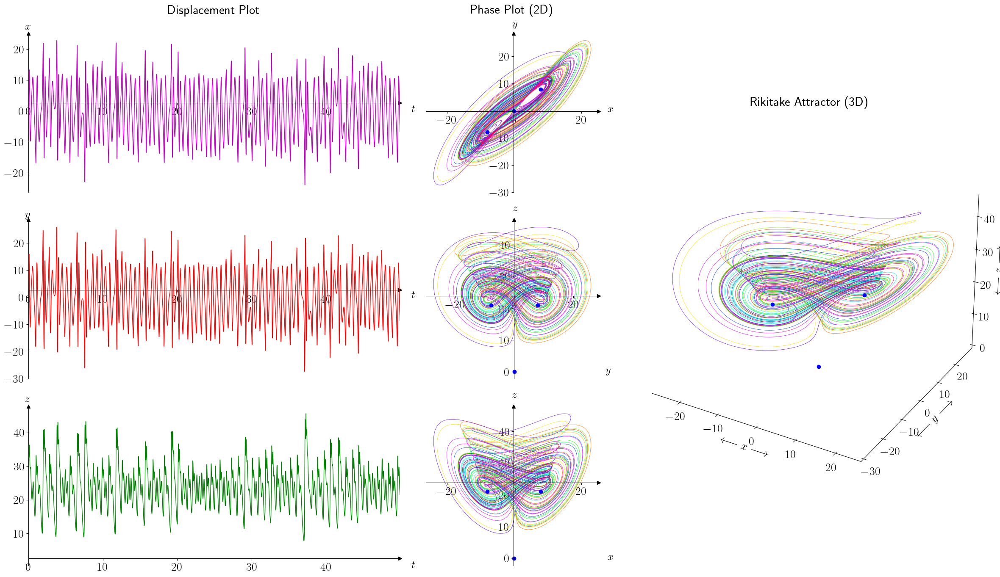

In [91]:
def Chen(t, y,const):      
    a, b, c = const                           # constant in Chen eqns
    dx = a*(y[1]-y[0])                        # dx/dt =  -v*x + y*z
    dy = (c - a)*y[0] - y[0]*y[2] + c*y[1]    # dy/dt =  -v*y + (z-a)*x
    dz = y[0]*y[1] - b*y[2]                   # dz/dt =   1   + x*y
    return np.array([dx, dy, dz])

def chen_fixed_points(a, b, c):
    points = []
    points.append((0.0, 0.0, 0.0))
    # Nonzero equilibria exist if 2c - a > 0
    if 2*c - a > 0:
        z = 2*c - a
        s = np.sqrt(b * z)
        points.append(( s,  s, z))
        points.append((-s, -s, z))
    return np.array(points)

dt = 0.001
t_span = [0, 50]

# constants
a = 35
b = 3
c = 28
const = a,b,c

# initials
x0 = -10
y0 = 0.0
z0 = 37
init_main = [x0, y0, z0]
t, M = RK4( Chen, t_span, const, dt, init_main)
xx, yy, zz = M[:, 0], M[:, 1], M[:, 2]

fig = plt.figure(figsize=(24, 14))
'''fig.suptitle('Chen System )'''

# Grid spec
gs = fig.add_gridspec(3, 5)
ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[1, 0:2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[0, 2])
ax5 = fig.add_subplot(gs[1, 2])
ax6 = fig.add_subplot(gs[2, 2])
ax7 = fig.add_subplot(gs[0:3, 3:5], projection='3d')

# Time series labels
for ax, data, label in zip([ax1, ax2, ax3], [xx, yy, zz], ['x', 'y', 'z']):
    ax.set_xlim([t[0], t[-1]])
    ax.text(-0.5, np.max(data) + 3.5, fr'${label}$', fontsize=18)
    ax.text(t[-1] + 1.5, -0.3, r'$t$', fontsize=18)
    customize_axes(ax, x_p=np.mean(y_data), y_p=np.mean(x_data))

# 2D plot tweaks 
axes_2d = [ax4, ax5, ax6]
coords  = [(xx, yy, 'x', 'y'), (yy, zz, 'y', 'z'), (xx, zz, 'x', 'z')]
for ax, (x_data, y_data, x_label, y_label) in zip(axes_2d, coords):
    customize_axes(ax, x_p=np.mean(y_data), y_p=np.mean(x_data))
    ax.text(-0.5, np.max(y_data) + 5, fr'${y_label}$', fontsize=18)
    ax.text(np.max(x_data) + 5, -0.5, fr'${x_label}$', fontsize=18)

# 3D plot tweaks
ax7.xaxis.set_pane_color((1, 1, 1, 1))
ax7.yaxis.set_pane_color((1, 1, 1, 1))
ax7.zaxis.set_pane_color((1, 1, 1, 1))
ax7.xaxis.pane.set_edgecolor('w')
ax7.yaxis.pane.set_edgecolor('w')
ax7.zaxis.pane.set_edgecolor('w')
ax7.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax7.set_ylabel(r'$\longleftarrow y \longrightarrow$')
ax7.set_zlabel(r'$\longleftarrow z \longrightarrow$')

# 1D time series plots
ax1.plot(t, xx, 'm', linewidth=1.1)
ax2.plot(t, yy, 'r', linewidth=1.1)
ax3.plot(t, zz, 'g', linewidth=1.1)

# 2D + 3D plots
s = 10
n = len(t)
for i in range(0, n - s, s):
    ax4.plot(xx[i:i+s+1], yy[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax5.plot(yy[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax6.plot(xx[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax7.plot(xx[i:i+s+1], yy[i:i+s+1], zz[i:i+s+1], color=plt.cm.hsv((i+1)/n), linewidth=0.5)

# Mark fixed points
for p in chen_fixed_points(a, b, c):
    xp, yp, zp = p
    ax4.plot(xp, yp, 'bo')
    ax5.plot(yp, zp, 'bo')
    ax6.plot(xp, zp, 'bo')
    ax7.plot(xp, yp, zp, 'bo')

ax1.set_title('Displacement Plot', fontsize=22,y=1.1)
ax4.set_title('Phase Plot (2D)', fontsize=22,y=1.1)
ax7.set_title('Rikitake Attractor (3D)', fontsize=22,y=1.1)
ax7.grid(False)
plt.tight_layout()
plt.show()

## $$\bf{\text{R}}\ddot{o}\bf{\text{essler}}$$
<span style="color:red">Investigate the simplified version of the $\bf{\text{Lorenz attractors}}$ developed by $\bf{\text{R}}\ddot{o}\bf{\text{essler}}$ [Becker(86)]:                                               
$ \quad \dot{x} = −y − z $                                                                                                      
$\quad \dot{y} = x + ay $                                                                                                        
$\quad \dot{z} = b + z(x − c) $                                                                                                        
$\quad (a, b, c) = (0.2, 0.2, 5.7). $                                                                                                            
a. Compute and plot $x(t), y(t),$ and $z(t)$ as functions of time.                                                                 
b. Plot projections of your solutions onto the $(x, y)$ and $(x, \dot{x})$ planes.                                                       
c. Make a Poincaré mapping of the transverse section $\dot{x} = 0$.                                                                      
$\quad $(A Poincaré mapping is the intersection of a periodic orbit in the phase space with a lower-dimensional subspace.)               
d. When $\dot{x} = 0, x$ has an extremum. Plot the value of the extrema $x_{i+1}$ as a function of the previous extremum $x_i$.

<span style="color:red">3. Make sure to use a small enough step size so that good precision is obtained.                                                  
$\quad $You must have confidence that you are seeing chaos and not numerical error.                                                       
<span style="color:red">4. Makes plots of $x$ versus $t, y$ versus $t,$ and $z$ versus $t.$                                                          
<span style="color:red">5. The initial behaviors in these plots are called “transients” and are not considered dynamically interesting.        
$\quad $Leave off these transients in the plots to follow.                                                                           
<span style="color:red">6. Make a **phase space** plot of $z(t)$ versus $x(t)$.                                                                    
$\quad $The distorted, number eightlike figures you obtain  are called Lorenz attractors,                                             
$\quad $“attractors” because even chaotic solutions tend to be attracted to them.                                                                                             
<span style="color:red">7. Make **phase space** plots of $y(t)$ versus $x(t)$ and $z(t)$ versus $y(t)$.                                                         
<span style="color:red">8. Make a 3-D plot of $x(t)$ versus $y(t)$ versus $z(t)$.                                                                       
9. The parameters given to you should lead to chaotic solutions.                                                       
$\quad $Check this claim by finding the smallest change you can make in a parameter that still produce different answers.              
10. Estimate the $\it{\text{largest }}\bf{\text{Liapunov exponent}}$ of two nearby trajectories for the Lorenz system.                
11. Using numerical integration, compute the $\bf{\text{Lorenz map}}$.                                                                      
12. Make a $\bf{\text{Poincaré mapping}}$  of the transverse section where $z=r-1$                                                                                                                              
$\quad $(A $\bf{\text{Poincaré mapping}}$ is the intersection of a periodic orbit in the phase space with a lower-dimensional subspace.)                                                   
13. Show the $\bf{\text{Bifurcation map}}$ for $C^+ \ \& \ C^- $ with respect to $\rho$ .                                             

In [22]:
def Rf(t,y,const):     
    a,b,c = const 
    dx_dt = -y[1]-y[2]            # xdot =  -y-z
    dy_dt = y[0] + a*y[1]         # ydot = x+ay
    dz_dt = b + y[0]*y[2]-c*y[2]  # zdot = b+xz-cz
    return np.array([dx_dt, dy_dt, dz_dt])

---
<span style="color:red">(Analysis)                                                                                                                    
Find the fixed points of the Rössler system, and state when they exist.                      
Try to classify them. Plot a partial bifurcation diagram of $x^∗ \ vs. \ c$, for fixed $a, b$.                               
Can you find a trapping region for the system ?

---

### Analyzing the Rössler System

The **Rössler system** is defined by:

$\quad\begin{aligned} \dot{x} &= -y - z, \\ \dot{y} &= x + a y, \\ \dot{z} &= b + z(x - c). \end{aligned} $

---

#### **Fixed Points**
The fixed points occur where $\dot{x} = \dot{y} = \dot{z} = 0$.

$\quad\begin{aligned} &\dot{x} = 0 \implies -y - z = 0 \implies y = -z, \\ &\dot{y} = 0 \implies x + a(-z) = 0 \implies x = az, \\ &\dot{z} = 0 \implies b + z(az - c) = 0 \implies z(az - c) = -b. \end{aligned}$

From $\dot{z} = 0$:

$\quad z = \frac{c \pm \sqrt{c^2 - 4ab}}{2a}, \quad \text{(when \(c^2 \geq 4ab\))}.$

The fixed points are:

$\quad (x^*, y^*, z^*) = \left(az, -z, z\right), \quad \text{where \(z\) satisfies the quadratic above}.$

---

#### ** Existence of Fixed Points**
- Fixed points exist if and only if $c^2 \geq 4ab$, ensuring $z$ is real.


#### **Classification of Fixed Points**
To classify the fixed points, compute the **Jacobian** matrix:

$ \qquad J = \begin{bmatrix} 0 & -1 & -1 \\ 1 & a & 0 \\ z & 0 & x - c \end{bmatrix}.$

- Substitute the fixed points $(x^*, y^*, z^*) = (az, -z, z)$ to analyze the eigenvalues of $J$.
- The nature of the eigenvalues determines stability:
  - **Real eigenvalues:** Stable node or saddle point.
  - **Complex eigenvalues:** Spiral (focus).

---
#### **Trapping Region**
A **trapping region** is a bounded region in phase space where trajectories cannot escape.                                
For the Rössler system:
- The $z$-dynamics are unbounded unless $|x| < c$.
- A potential trapping region may be constructed if $x, y, z$ are bounded.

In [23]:
def fixed_points(a,b,c):
    if c**2 >= 4*a*b:
        z1 = (c + (c**2-4*a*b)**0.5)/(2*a)
        z2 = (c - (c**2-4*a*b)**0.5)/(2*a)
    return np.array([[ a*z1, -z1, z1], [ a*z2, -z2, z2]])

a, b, c = 0.2, 0.2, 5.7
print(fixed_points(a,b,c))

[[ 5.69297380e+00 -2.84648690e+01  2.84648690e+01]
 [ 7.02620483e-03 -3.51310242e-02  3.51310242e-02]]


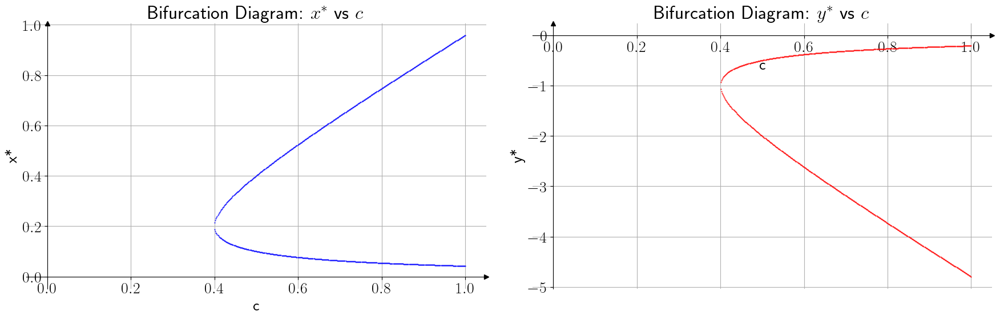

In [170]:
a, b = 0.2, 0.2
c_values = np.linspace(0.01, 1, 700)

x_star, y_star, c_valid = [], [], []

for c in c_values:
    discriminant = c**2 - 4*a*b
    if discriminant >= 0:
        z1 = (c + np.sqrt(discriminant)) / (2*a)
        z2 = (c - np.sqrt(discriminant)) / (2*a)
        x_star.extend([a*z1, a*z2])
        y_star.extend([-z1, -z2])
        c_valid.extend([c, c])  # Add c twice (for both roots)

x_star = np.array(x_star)
y_star = np.array(y_star)
c_valid = np.array(c_valid)

plt.figure(figsize=(18, 6))

# x* bifurcation
ax1 = plt.subplot(121)
ax1.plot(c_valid, x_star, '.', color='blue', markersize=1)
customize_axes(ax1)
ax1.set_xlabel("c")
ax1.set_ylabel("x*")
ax1.set_title("Bifurcation Diagram: $x^*$ vs $c$")
ax1.grid()

# y* bifurcation
ax2 = plt.subplot(122)
ax2.plot(c_valid, y_star, '.', color='red', markersize=1)
customize_axes(ax2)
ax2.set_xlabel("c")
ax2.set_ylabel("y*")
ax2.set_title("Bifurcation Diagram: $y^*$ vs $c$")
ax2.grid()

plt.tight_layout()
plt.show()

In [171]:
dt = 0.01 
t_span = [0,800]
y = [10, -2, 0.2]
a = 0.2       
b = 0.2      
c = 5.7
const = a,b,c    

tRK4, MRK4 = RK4(Rf, t_span, const, dt, y)
xx,yy,zz = MRK4[:,0],MRK4[:,1],MRK4[:,2]

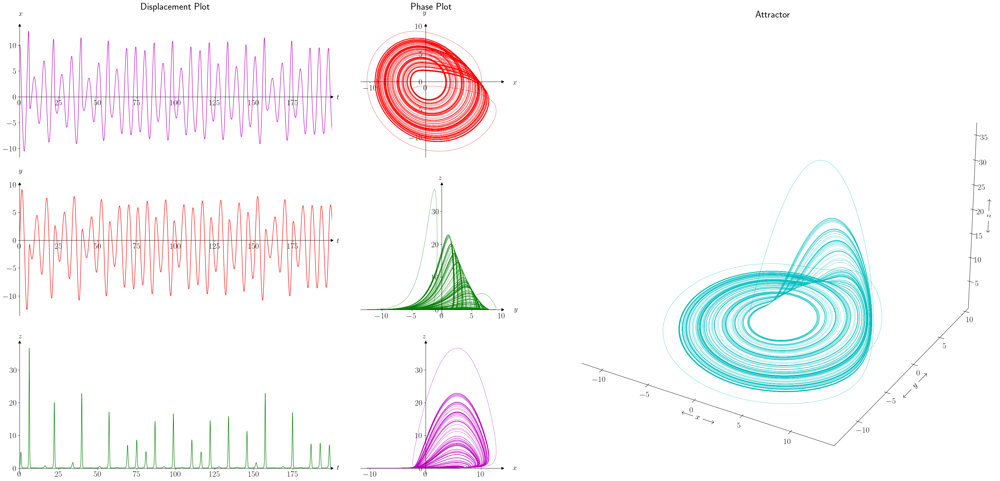

In [181]:
fig = plt.figure(figsize=(44,20))

gs=fig.add_gridspec(3,6)
ax1=fig.add_subplot(gs[0,0:2])
ax2=fig.add_subplot(gs[1,0:2])
ax3=fig.add_subplot(gs[2,0:2])
ax4=fig.add_subplot(gs[0,2])
ax5=fig.add_subplot(gs[1,2])
ax6=fig.add_subplot(gs[2,2])
ax7=fig.add_subplot(gs[0:3,3:6], projection='3d')

for ax, data, label in zip([ax1, ax2, ax3], [xx, yy, zz], ['x', 'y', 'z']):
    ax.set_xlim([t[0], t[-1]])
    ax.text(-0.5, np.max(data) + 3, fr'${label}$', fontsize=18)
    ax.text(t[-1] + 3, -0.5, r'$t$', fontsize=18)
    customize_axes(ax,x_p=0, y_p=0,)

axes_2d = [ax4, ax5, ax6]
coords  = [(xx, yy, 'x', 'y'), (yy, zz, 'y', 'z'), (xx, zz, 'x', 'z')]
for ax, (x_data, y_data, x_label, y_label) in zip(axes_2d, coords):
    customize_axes(ax)
    ax.text(-0.5, np.max(y_data) + 3, fr'${y_label}$', fontsize=18)
    ax.text(np.max(x_data) + 3, -0.5, fr'${x_label}$', fontsize=18)
 
ax7.xaxis.set_pane_color((1,1,1,1))
ax7.yaxis.set_pane_color((1,1,1,1))
ax7.zaxis.set_pane_color((1,1,1,1))
ax7.xaxis.pane.set_edgecolor('w')
ax7.yaxis.pane.set_edgecolor('w')
ax7.zaxis.pane.set_edgecolor('w')
ax7.grid(False)
ax7.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax7.set_ylabel(r'$\longleftarrow y \longrightarrow$')
ax7.set_zlabel(r'$\longleftarrow z \longrightarrow$')

# 1D Displacement plot
ax1.plot(tRK4[:int(310/dt)], xx[:int(310/dt)], 'm', linewidth=1.1, label=r'$x(t)$')
ax2.plot(tRK4[:int(310/dt)], yy[:int(310/dt)], 'r', linewidth=1.1, label=r'$y(t)$')
ax3.plot(tRK4[:int(310/dt)], zz[:int(310/dt)], 'g', linewidth=1.1, label=r'$z(t)$')

ax4.plot(xx, yy, color='r', linewidth=0.5)             # XY Phase Plot 2D
ax5.plot(yy, zz, color='g', linewidth=0.5)             # YZ Phase Plot 2D
ax6.plot(xx, zz, color='m', linewidth=0.5)             # XZ Phase Plot 2D
ax7.plot(xx, yy, zz, color='c', linewidth=0.5)         # 3D Attractor

'''for p in fixed_points(a,b,c):
    xp, yp, zp = p
    ax4.plot(xp, yp, 'bo')
    ax5.plot(yp, zp, 'bo')
    ax6.plot(xp, zp, 'bo')
    ax7.plot(xp, yp, zp, 'bo')'''


ax1.set_title('Displacement Plot',y=1.1)
ax4.set_title('Phase Plot',y=1.1)
ax7.set_title('Attractor',y=1.1)

plt.show()    

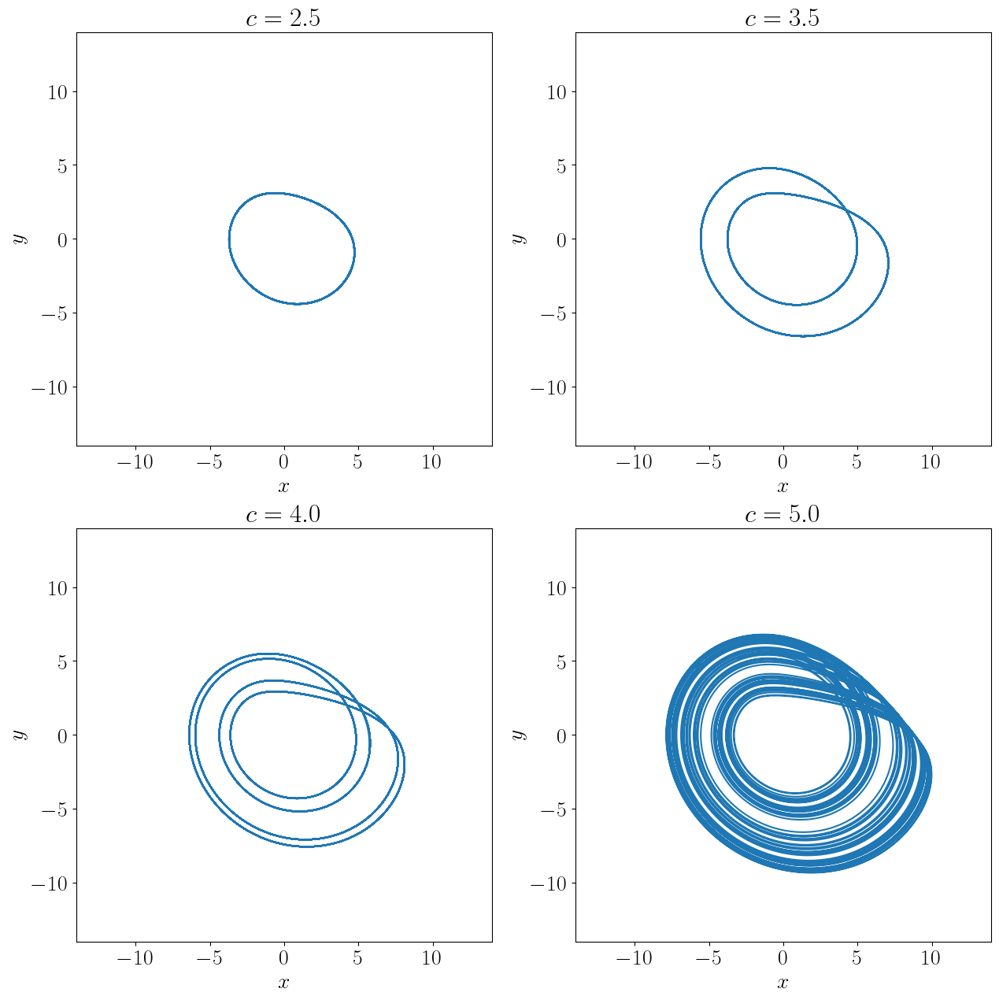

In [94]:
y = [0.2,0.2,0.2]
a = 0.2       
b = 0.2 
dt = 0.01 
t_span = [0,500]

fig = plt.figure(figsize=(15,15))
for i,c in enumerate([2.5, 3.5, 4., 5.]):
    const = a,b,c    
    tRK4, MRK4 = RK4(Rf, t_span, const, dt, y)
    xx,yy,zz = MRK4[:,0],MRK4[:,1],MRK4[:,2] 
    
    ax=fig.add_subplot(2, 2, i+1)
    ax.plot(xx[int(100/dt):], yy[int(100/dt):])
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$y$')
    ax.set_xlim([-14,14])
    ax.set_ylim([-14,14])
    ax.set_title(f'$c={c}$')
plt.show()

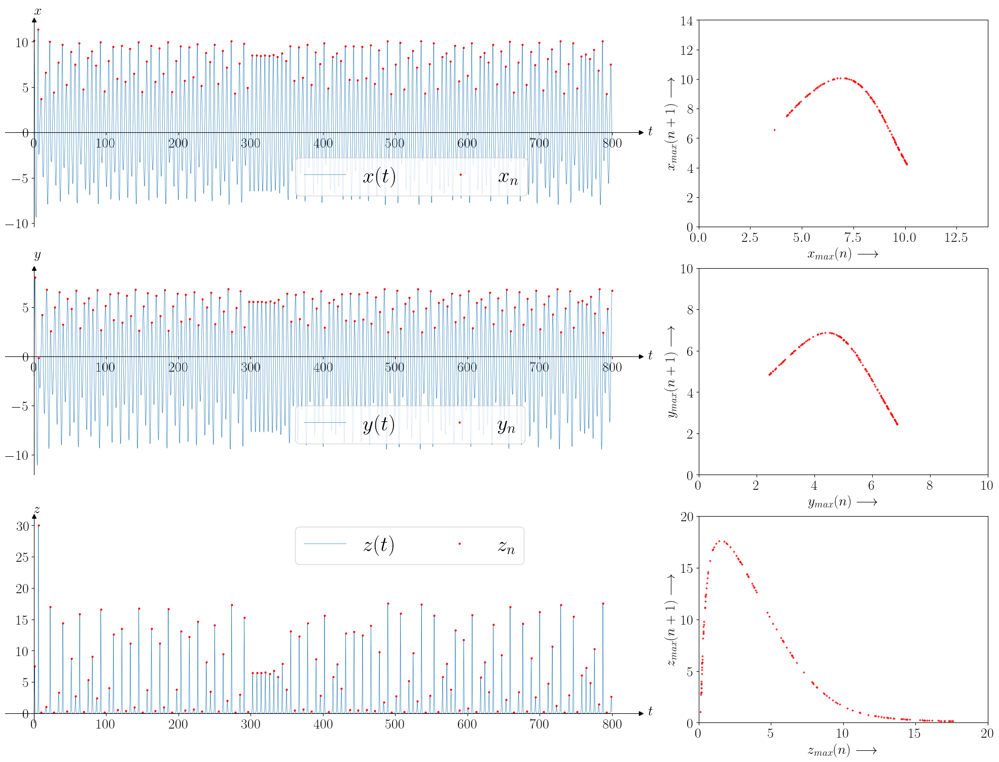

In [32]:
dt = 0.01 
t_span = [0,800]
y = [10, -2, 0.2]
a = 0.2       
b = 0.2      
c = 5.0
const = a,b,c 
t1, M1 = RK4(Rf, t_span, const, dt, y)
xx1,yy1,zz1 = M1[:,0],M1[:,1],M1[:,2]
xmax,tx = FindMaxima(xx1,t1)
ymax,ty = FindMaxima(yy1,t1)
zmax,tz = FindMaxima(zz1,t1)

fig = plt.figure(figsize=(25,18))

gs=fig.add_gridspec(3,3)
ax1=fig.add_subplot(gs[0,0:2])
ax2=fig.add_subplot(gs[0,2])
ax3=fig.add_subplot(gs[1,0:2])
ax4=fig.add_subplot(gs[1,2])
ax5=fig.add_subplot(gs[2,0:2])
ax6=fig.add_subplot(gs[2,2])

customize_axes(ax1)
customize_axes(ax3)
customize_axes(ax5)

ax1.plot(t1, xx1, linewidth=0.5, label=r'$x(t)$')
ax1.plot(tx, xmax, 'ro', ms=2, label=r'$x_n$')                  # Local Maxima of x_n
ax1.legend(loc='lower left', bbox_to_anchor=(0.44, 0.1),  fancybox=True, shadow=False, ncol=2)
ax1.text(850, -0.3, r'$t$')
ax1.text(-0.1,13,r'$x$')

ax2.plot(xmax[2:-2], xmax[3:-1], 'r+', lw=0.2, ms=3)           # Lorenz Map
ax2.set_xlim([0,14])
ax2.set_ylim([0,14])
ax2.set_xlabel(r'$x_{max} (n) \longrightarrow$')
ax2.set_ylabel(r'$x_{max} (n+1) \longrightarrow$')

ax3.plot(t1, yy1, linewidth=0.5, label=r'$y(t)$')
ax3.plot(ty, ymax, 'ro', ms=2, label=r'$y_n$')                  # Local Maxima of y_n
ax3.legend(loc='lower left', bbox_to_anchor=(0.44, 0.1),  fancybox=True, shadow=False, ncol=2)
ax3.text(850, -0.3, r'$t$')
ax3.text(-0.1, 10, r'$y$')

ax4.plot(ymax[2:-2], ymax[3:-1], 'r+', lw=0.2, ms=3)           # Lorenz Map
ax4.set_xlim([0,10])
ax4.set_ylim([0,10])
ax4.set_xlabel(r'$y_{max} (n) \longrightarrow$')
ax4.set_ylabel(r'$y_{max} (n+1) \longrightarrow$')

ax5.plot(t1, zz1, linewidth=0.5, label=r'$z(t)$')
ax5.plot(tz, zmax, 'ro', ms=2, label=r'$z_n$')                  # Local Maxima of z_n
ax5.legend(loc='upper left', bbox_to_anchor=(0.44, 1),  fancybox=True, shadow=False, ncol=2)
ax5.text(850, -0.3, r'$t$')
ax5.text(-0.1, 32, r'$z$')

ax6.plot(zmax[2:-2], zmax[3:-1], 'r+', lw=0.2, ms=3)           # Lorenz Map
ax6.set_xlim([0,20])
ax6.set_ylim([0,20])
ax6.set_xlabel(r'$z_{max} (n) \longrightarrow$')
ax6.set_ylabel(r'$z_{max} (n+1) \longrightarrow$')

plt.show()

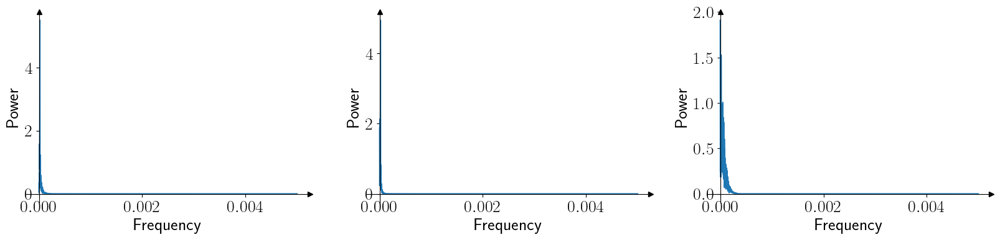

In [35]:
dt = 0.01 
t_span = [0,80]
y = [10, -2, 0.2]
a = 0.2       
b = 0.2      
c = 5.7
const = a,b,c    

tFFT, MFFT = RK4(Rf, t_span, const, dt, y)
xxF,yyF,zzF = MFFT[:,0],MFFT[:,1],MFFT[:,2]

X_FFT, Y_FFT, Z_FFT = dft(xxF), dft(yyF), dft(zzF)
Nx, Ny, Nz = len(X_FFT), len(Y_FFT), len(Z_FFT)
xf, yf, zf = freq(X_FFT, dt), freq(Y_FFT, dt), freq(Z_FFT, dt)

fig = plt.figure(figsize=(20,4))
gs=fig.add_gridspec(1,3)
ax23=fig.add_subplot(gs[0,0])
ax24=fig.add_subplot(gs[0,1])
ax25=fig.add_subplot(gs[0,2])
customize_axes(ax23)
customize_axes(ax24)
customize_axes(ax25)
ax23.plot(xf[:Nx//2], 2.0/Nx * np.abs(X_FFT[:Nx//2]))
ax24.plot(yf[:Ny//2], 2.0/Ny * np.abs(Y_FFT[:Ny//2]))
ax25.plot(zf[:Nz//2], 2.0/Nz * np.abs(Z_FFT[:Nz//2]))
ax23.set_xlabel('Frequency')
ax23.set_ylabel('Power')
ax24.set_xlabel('Frequency')
ax24.set_ylabel('Power')
ax25.set_xlabel('Frequency')
ax25.set_ylabel('Power')
plt.show()

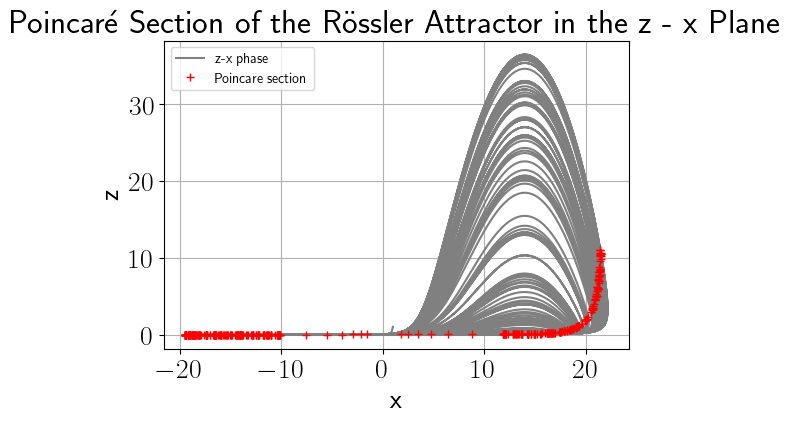

In [40]:
# Parameters
dt = 0.01
t_span = [0, 1000]
y0 = [1,1,1]
a, b, c = 0.1, 0.1, 14
const = (a, b, c)

# Integrate the system
t_p, M_p = RK4(Rf, t_span, const, dt, y0)
xx_p, yy_p, zz_p = M_p[:, 0], M_p[:, 1], M_p[:, 2]

# Poincaré Map
t_intersect = []
x_intersect = []
z_intersect = []

for i in range(len(yy_p) - 1):
    if yy_p[i] * yy_p[i+1] < 0:  # Check for sign change
        t_intersect.append(t_p[i])
        x_intersect.append(xx_p[i])
        z_intersect.append(zz_p[i])

plt.figure(figsize=(6,4))
plt.plot(xx_p, zz_p, 'gray', label='z-x phase')
plt.plot(x_intersect, z_intersect, 'r+', label='Poincare section')
plt.title('Poincaré Section of the Rössler Attractor in the z - x Plane')
plt.legend(fontsize=10)
plt.xlabel('x')
plt.ylabel('z')
plt.grid(True)
plt.show()

(Numerical experiments)                                                                                
Explore the Rössler system numerically. Fix $b = 2, c = 4,$ and increase $a$ in small steps from 0 to 0.4.                        
a) Find the approximate value of $a$ at the Hopf bifurcation and at the first period-doubling bifurcation.                       
b) For each $a$, plot the attractor, using what ever projection looks best. Also plot the time series $z(t)$.

In [13]:
da = 0.00001
a_values = np.arange(-0.1, 0.41,da)
b = 2
c = 4.7
dt = 0.01 
t_span = [0,80]  
init_main = [0.1, 0, 0]
xa_maxes,ax_maxes ,xa_mins,ax_mins = [],[],[],[]
ya_maxes,ay_maxes ,ya_mins,ay_mins = [],[],[],[]
za_maxes,az_maxes ,za_mins,az_mins = [],[],[],[]

for a in a_values:
    const = a, b, c
    t, M = RK4(Rf, t_span, const, dt, init_main)
    xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
    xa_max, ax_max, xa_min, ax_min = bifurcation(xs, a)
    ya_max, ay_max, ya_min, ay_min = bifurcation(ys, a)
    za_max, az_max, za_min, az_min = bifurcation(zs, a)

    xa_maxes.extend(xa_max)
    ax_maxes.extend(ax_max)
    #xa_mins.extend(xa_min)
    #ax_mins.extend(ax_min)

    ya_maxes.extend(ya_max)
    ay_maxes.extend(ay_max)
    #ya_mins.extend(ya_min)
    #ay_mins.extend(ay_min)

    za_maxes.extend(za_max)
    az_maxes.extend(az_max)
    #za_mins.extend(za_min)
    #az_mins.extend(az_min)

    init_main = [xs[-1], ys[-1], zs[-1]]

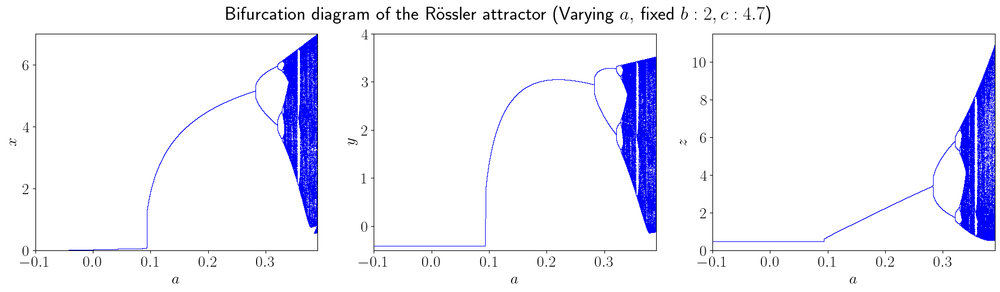

In [14]:
fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xa_maxes, ax_maxes, 'b,')
#ax1.plot(xa_mins, ax_mins, 'r,')
ax1.set_ylim([ 0, 7])
ax1.set_xlim([-0.1, 0.39])
ax1.set_xlabel(r'$a$')
ax1.set_ylabel(r'$x$')

ax2.plot(ya_maxes, ay_maxes, 'b,')
#ax2.plot(ya_mins, ay_mins, 'r,')
ax2.set_ylim([-0.5, 4])
ax2.set_xlim([-0.1, 0.39])
ax2.set_xlabel(r'$a$')
ax2.set_ylabel(r'$y$')

ax3.plot(za_maxes, az_maxes, 'b,')
#ax3.plot(za_mins, az_mins, 'r,')
ax3.set_ylim([0, 11.5])
ax3.set_xlim([-0.1, 0.39])
ax3.set_xlabel(r'$a$')
ax3.set_ylabel(r'$z$')
fig.suptitle(f'Bifurcation diagram of the Rössler attractor (Varying $a,$ fixed $b:{b}, c:{c}$) ')
plt.show()

##### Bifurcation diagram of the Rössler attractor (Varying $a$)

In [41]:
da = 0.0001
a_values = np.arange(-0.1, 0.41,da)
b = 0.2
c = 4.7
dt = 0.01 
t_span = [0,80]  
init_main = [0.1, 0, 0]
xa_maxes,ax_maxes ,xa_mins,ax_mins = [],[],[],[]
ya_maxes,ay_maxes ,ya_mins,ay_mins = [],[],[],[]
za_maxes,az_maxes ,za_mins,az_mins = [],[],[],[]

for a in a_values:
    const = a, b, c
    t, M = RK4(Rf, t_span, const, dt, init_main)
    xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
    xa_max, ax_max, xa_min, ax_min = bifurcation(xs, a)
    ya_max, ay_max, ya_min, ay_min = bifurcation(ys, a)
    za_max, az_max, za_min, az_min = bifurcation(zs, a)

    xa_maxes.extend(xa_max)
    ax_maxes.extend(ax_max)
    #xa_mins.extend(xa_min)
    #ax_mins.extend(ax_min)

    ya_maxes.extend(ya_max)
    ay_maxes.extend(ay_max)
    #ya_mins.extend(ya_min)
    #ay_mins.extend(ay_min)

    za_maxes.extend(za_max)
    az_maxes.extend(az_max)
    #za_mins.extend(za_min)
    #az_mins.extend(az_min)

    init_main = [xs[-1], ys[-1], zs[-1]]

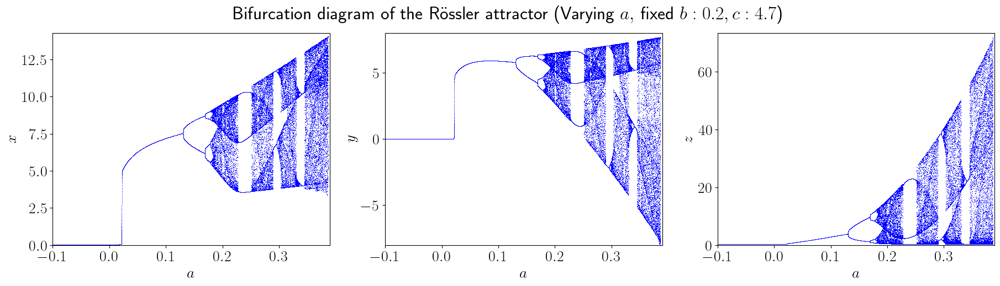

In [42]:
fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xa_maxes, ax_maxes, 'b,')
#ax1.plot(xa_mins, ax_mins, 'r,')
ax1.set_ylim([ 0, 14.3])
ax1.set_xlim([-0.1, 0.39])
ax1.set_xlabel(r'$a$')
ax1.set_ylabel(r'$x$')

ax2.plot(ya_maxes, ay_maxes, 'b,')
#ax2.plot(ya_mins, ay_mins, 'r,')
ax2.set_ylim([-8, 8])
ax2.set_xlim([-0.1, 0.39])
ax2.set_xlabel(r'$a$')
ax2.set_ylabel(r'$y$')

ax3.plot(za_maxes, az_maxes, 'b,')
#ax3.plot(za_mins, az_mins, 'r,')
ax3.set_ylim([0, 73.5])
ax3.set_xlim([-0.1, 0.39])
ax3.set_xlabel(r'$a$')
ax3.set_ylabel(r'$z$')
fig.suptitle(f'Bifurcation diagram of the Rössler attractor (Varying $a,$ fixed $b:{b}, c:{c}$) ')
plt.show()

In [43]:
da = 0.0001
a_values = np.arange(-0.1, 0.41,da)
b = 0.2
c = 5.7
dt = 0.01 
t_span = [0,80]  
init_main = [0.1, 0, 0]
xa2_maxes,ax2_maxes ,xa2_mins,ax2_mins = [],[],[],[]
ya2_maxes,ay2_maxes ,ya2_mins,ay2_mins = [],[],[],[]
za2_maxes,az2_maxes ,za2_mins,az2_mins = [],[],[],[]

for a in a_values:
    const = a, b, c
    t, M = RK4(Rf, t_span, const, dt, init_main)
    xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
    xa_max, ax_max, xa_min, ax_min = bifurcation(xs, a)
    ya_max, ay_max, ya_min, ay_min = bifurcation(ys, a)
    za_max, az_max, za_min, az_min = bifurcation(zs, a)

    xa2_maxes.extend(xa_max)
    ax2_maxes.extend(ax_max)
    #xa2_mins.extend(xa_min)
    #ax2_mins.extend(ax_min)

    ya2_maxes.extend(ya_max)
    ay2_maxes.extend(ay_max)
    #ya2_mins.extend(ya_min)
    #ay2_mins.extend(ay_min)

    za2_maxes.extend(za_max)
    az2_maxes.extend(az_max)
    #za2_mins.extend(za_min)
    #az2_mins.extend(az_min)

    init_main = [xs[-1], ys[-1], zs[-1]]

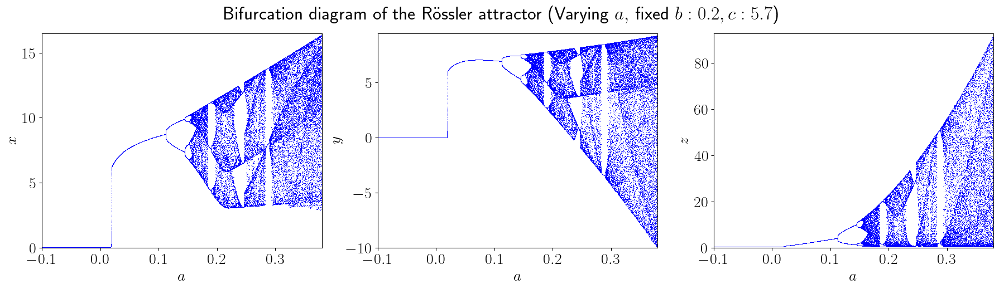

In [44]:
fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xa2_maxes, ax2_maxes, 'b,')
#ax1.plot(xa2_mins, ax2_mins, 'r,')
ax1.set_ylim([ 0, 16.5])
ax1.set_xlim([-0.1, 0.38])
ax1.set_xlabel(r'$a$')
ax1.set_ylabel(r'$x$')

ax2.plot(ya2_maxes, ay2_maxes, 'b,')
#ax2.plot(ya2_mins, ay2_mins, 'r,')
ax2.set_ylim([-10,9.5])
ax2.set_xlim([-0.1, 0.38])
ax2.set_xlabel(r'$a$')
ax2.set_ylabel(r'$y$')

ax3.plot(za2_maxes, az2_maxes, 'b,')
#ax3.plot(za2_mins, az2_mins, 'r,')
ax3.set_ylim([0, 93])
ax3.set_xlim([-0.1, 0.38])
ax3.set_xlabel(r'$a$')
ax3.set_ylabel(r'$z$')
fig.suptitle(f'Bifurcation diagram of the Rössler attractor (Varying $a,$ fixed $b:{b}, c:{c}$) ')
plt.show()

##### Bifurcation diagram of the Rössler attractor (Varying $b$)

In [45]:
db = 0.0005
a = 0.2
b_values = np.arange(1e-12, 2,db)
c = 5.
dt = 0.01 
t_span = [0,80]  
init_main = [0., 0., 0.]
xb_maxes,bx_maxes ,xb_mins,bx_mins = [],[],[],[]
yb_maxes,by_maxes ,yb_mins,by_mins = [],[],[],[]
zb_maxes,bz_maxes ,zb_mins,bz_mins = [],[],[],[]

for b in b_values:
    const = a, b, c
    t, M = RK4(Rf, t_span, const, dt, init_main)
    xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
    xb_max, bx_max, xb_min, bx_min = bifurcation(xs, b)
    yb_max, by_max, yb_min, by_min = bifurcation(ys, b)
    zb_max, bz_max, zb_min, bz_min = bifurcation(zs, b)

    xb_maxes.extend(xb_max)
    bx_maxes.extend(bx_max)
    #xb_mins.extend(xb_min)
    #bx_mins.extend(bx_min)

    yb_maxes.extend(yb_max)
    by_maxes.extend(by_max)
    #yb_mins.extend(yb_min)
    #by_mins.extend(by_min)

    zb_maxes.extend(zb_max)
    bz_maxes.extend(bz_max)
    #zb_mins.extend(zb_min)
    #bz_mins.extend(bz_min)

    init_main = [xs[-1], ys[-1], zs[-1]]

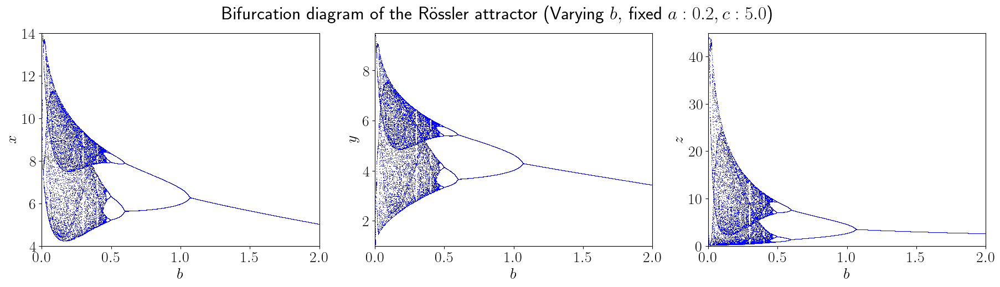

In [46]:
fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xb_maxes, bx_maxes, 'b,')
#ax1.plot(xb_mins, bx_mins, 'r,')
ax1.set_ylim([4, 14])
ax1.set_xlim([0, 2])
ax1.set_xlabel(r'$b$')
ax1.set_ylabel(r'$x$')

ax2.plot(yb_maxes, by_maxes, 'b,')
#ax2.plot(yb_mins, by_mins, 'r,')
ax2.set_ylim([1, 9.5])
ax2.set_xlim([0, 2])
ax2.set_xlabel(r'$b$')
ax2.set_ylabel(r'$y$')

ax3.plot(zb_maxes, bz_maxes, 'b,')
#ax3.plot(zb_mins, bz_mins, 'r,')
ax3.set_ylim([0, 45])
ax3.set_xlim([0, 2])
ax3.set_xlabel(r'$b$')
ax3.set_ylabel(r'$z$')
fig.suptitle(f'Bifurcation diagram of the Rössler attractor (Varying $b, $ fixed $a:{a}, c:{c}$) ')
plt.show()

In [47]:
db = 0.0005
a = 0.2
b_values = np.arange(1e-12, 2,db)
c = 5.7
dt = 0.01 
t_span = [0,80]  
init_main = [0.,0., 0.]
xb2_maxes,bx2_maxes ,xb2_mins,bx2_mins = [],[],[],[]
yb2_maxes,by2_maxes ,yb2_mins,by2_mins = [],[],[],[]
zb2_maxes,bz2_maxes ,zb2_mins,bz2_mins = [],[],[],[]

for b in b_values:
    const = a, b, c
    t, M = RK4(Rf, t_span, const, dt, init_main)
    xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
    xb_max, bx_max, xb_min, bx_min = bifurcation(xs, b)
    yb_max, by_max, yb_min, by_min = bifurcation(ys, b)
    zb_max, bz_max, zb_min, bz_min = bifurcation(zs, b)

    xb2_maxes.extend(xb_max)
    bx2_maxes.extend(bx_max)
    #xb2_mins.extend(xb_min)
    #bx2_mins.extend(bx_min)

    yb2_maxes.extend(yb_max)
    by2_maxes.extend(by_max)
    #yb2_mins.extend(yb_min)
    #by2_mins.extend(by_min)

    zb2_maxes.extend(zb_max)
    bz2_maxes.extend(bz_max)
    #zb2_mins.extend(zb_min)
    #bz2_mins.extend(bz_min)

    init_main = [xs[-1], ys[-1], zs[-1]]

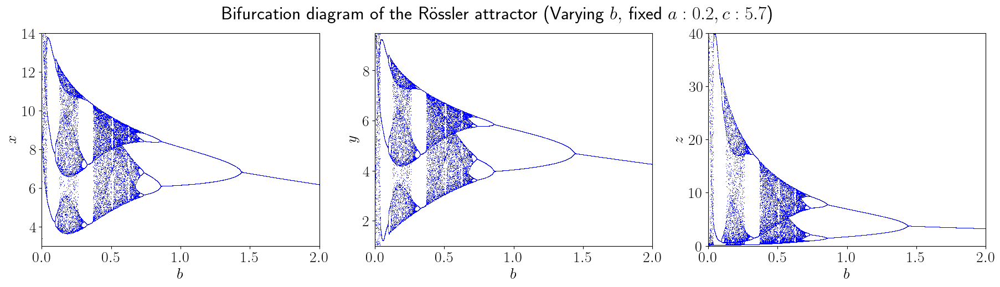

In [48]:
fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xb2_maxes, bx2_maxes, 'b,')
#ax1.plot(xb2_mins, bx2_mins, 'r,')
ax1.set_ylim([3, 14])
ax1.set_xlim([0, 2])
ax1.set_xlabel(r'$b$')
ax1.set_ylabel(r'$x$')

ax2.plot(yb2_maxes, by2_maxes, 'b,')
#ax2.plot(yb2_mins, by2_mins, 'r,')
ax2.set_ylim([1, 9.5])
ax2.set_xlim([0, 2])
ax2.set_xlabel(r'$b$')
ax2.set_ylabel(r'$y$')

ax3.plot(zb2_maxes, bz2_maxes, 'b,')
#ax3.plot(zb2_mins, bz2_mins, 'r,')
ax3.set_ylim([0, 40])
ax3.set_xlim([0, 2])
ax3.set_xlabel(r'$b$')
ax3.set_ylabel(r'$z$')
fig.suptitle(f'Bifurcation diagram of the Rössler attractor (Varying $b,$ fixed $a:{a}, c:{c}$) ')
plt.show()

##### Bifurcation diagram of the Rössler attractor (Varying $c$)

In [49]:
a = 0.2
b = 0.2
dc = 0.001
c_values = np.arange(1, 10, dc)
dt = 0.01 
t_span = [0,80]  
init_main = [0.1, 0, 0]
xc_maxes,cx_maxes ,xc_mins,cx_mins = [],[],[],[]
yc_maxes,cy_maxes ,yc_mins,cy_mins = [],[],[],[]
zc_maxes,cz_maxes ,zc_mins,cz_mins = [],[],[],[]

for c in c_values:
    const = a, b, c
    t, M = RK4(Rf, t_span, const, dt, init_main)
    xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
    xc_max, cx_max, xc_min, cx_min = bifurcation(xs, c)
    yc_max, cy_max, yc_min, cy_min = bifurcation(ys, c)
    zc_max, cz_max, zc_min, cz_min = bifurcation(zs, c)

    xc_maxes.extend(xc_max)
    cx_maxes.extend(cx_max)
    #xc_mins.extend(xc_min)
    #cx_mins.extend(cx_min)

    yc_maxes.extend(yc_max)
    cy_maxes.extend(cy_max)
    #yc_mins.extend(yc_min)
    #cy_mins.extend(cy_min)

    zc_maxes.extend(zc_max)
    cz_maxes.extend(cz_max)
    #zc_mins.extend(zc_min)
    #cz_mins.extend(cz_min)

    init_main = [xs[-1], ys[-1], zs[-1]]

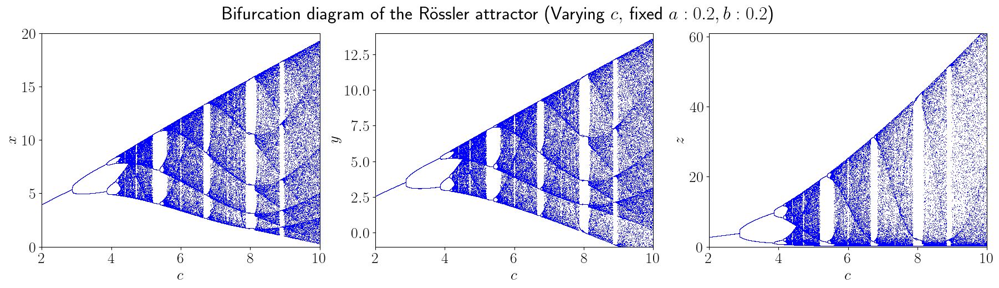

In [50]:
fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xc_maxes, cx_maxes, 'b,')
#ax1.plot(xc_mins, cx_mins, 'r,')
ax1.set_ylim([0, 20])
ax1.set_xlim([2, 10])
ax1.set_xlabel(r'$c$')
ax1.set_ylabel(r'$x$')

ax2.plot(yc_maxes, cy_maxes, 'b,')
#ax2.plot(yc_mins, cy_mins, 'r,')
ax2.set_ylim([-1, 14])
ax2.set_xlim([2, 10])
ax2.set_xlabel(r'$c$')
ax2.set_ylabel(r'$y$')

ax3.plot(zc_maxes, cz_maxes, 'b,')
#ax3.plot(zc_mins, cz_mins, 'r,')
ax3.set_ylim([0, 61])
ax3.set_xlim([2, 10])
ax3.set_xlabel(r'$c$')
ax3.set_ylabel(r'$z$')
fig.suptitle(f'Bifurcation diagram of the Rössler attractor (Varying $c,$ fixed $a:{a}, b:{b}$) ')
plt.show()

In [51]:
a = 0.2
b = 0.2
dc = 0.01
c_values = np.arange(1, 80, dc)
dt = 0.01 
t_span = [0,80]  
init_main = [0.1, 0, 0]
xc_maxes,cx_maxes ,xc_mins,cx_mins = [],[],[],[]
yc_maxes,cy_maxes ,yc_mins,cy_mins = [],[],[],[]
zc_maxes,cz_maxes ,zc_mins,cz_mins = [],[],[],[]

for c in c_values:
    const = a, b, c
    t, M = RK4(Rf, t_span, const, dt, init_main)
    xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
    xc_max, cx_max, xc_min, cx_min = bifurcation(xs, c)
    yc_max, cy_max, yc_min, cy_min = bifurcation(ys, c)
    zc_max, cz_max, zc_min, cz_min = bifurcation(zs, c)

    xc_maxes.extend(xc_max)
    cx_maxes.extend(cx_max)
    #xc_mins.extend(xc_min)
    #cx_mins.extend(cx_min)

    yc_maxes.extend(yc_max)
    cy_maxes.extend(cy_max)
    #yc_mins.extend(yc_min)
    #cy_mins.extend(cy_min)

    zc_maxes.extend(zc_max)
    cz_maxes.extend(cz_max)
    #zc_mins.extend(zc_min)
    #cz_mins.extend(cz_min)

    init_main = [xs[-1], ys[-1], zs[-1]]

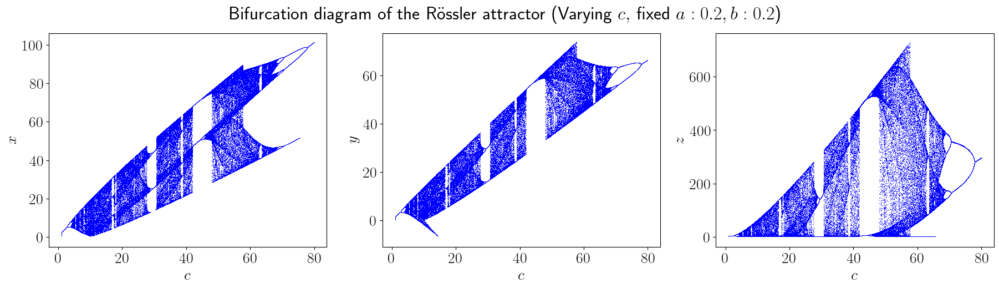

In [52]:
fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xc_maxes, cx_maxes, 'b,')
#ax1.plot(xc_mins, cx_mins, 'r,')
#ax1.set_ylim([0, 20])
#ax1.set_xlim([2, 10])
ax1.set_xlabel(r'$c$')
ax1.set_ylabel(r'$x$')

ax2.plot(yc_maxes, cy_maxes, 'b,')
#ax2.plot(yc_mins, cy_mins, 'r,')
#ax2.set_ylim([-1, 14])
#ax2.set_xlim([2, 10])
ax2.set_xlabel(r'$c$')
ax2.set_ylabel(r'$y$')

ax3.plot(zc_maxes, cz_maxes, 'b,')
#ax3.plot(zc_mins, cz_mins, 'r,')
#ax3.set_ylim([0, 61])
#ax3.set_xlim([2, 10])
ax3.set_xlabel(r'$c$')
ax3.set_ylabel(r'$z$')
fig.suptitle(f'Bifurcation diagram of the Rössler attractor (Varying $c,$ fixed $a:{a}, b:{b}$) ')
plt.show()

In [53]:
a = 0.1
b = 0.1
dc = 0.005
c_values = np.arange(1, 50, dc)
dt = 0.01 
t_span = [0,80]  
init_main = [0,0,0]
xc2_maxes,cx2_maxes ,xc2_mins,cx2_mins = [],[],[],[]
yc2_maxes,cy2_maxes ,yc2_mins,cy2_mins = [],[],[],[]
zc2_maxes,cz2_maxes ,zc2_mins,cz2_mins = [],[],[],[]

for c in c_values:
    const = a, b, c
    t, M = RK4(Rf, t_span, const, dt, init_main)
    xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
    xc_max, x_max, xc_min, x_min = bifurcation(xs, c)
    yc_max, y_max, yc_min, y_min = bifurcation(ys, c)
    zc_max, z_max, zc_min, z_min = bifurcation(zs, c)

    xc2_maxes.extend(xc_max)
    cx2_maxes.extend(x_max)
    #xc2_mins.extend(xc_min)
    #cx2_mins.extend(x_min)

    yc2_maxes.extend(yc_max)
    cy2_maxes.extend(y_max)
    #yc2_mins.extend(yc_min)
    #cy2_mins.extend(y_min)

    zc2_maxes.extend(zc_max)
    cz2_maxes.extend(z_max)
    #zc2_mins.extend(zc_min)
    #cz2_mins.extend(z_min)

    init_main = [xs[-1], ys[-1], zs[-1]]

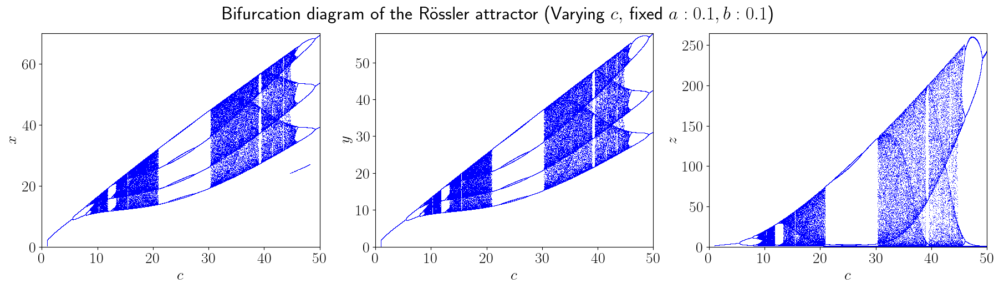

In [54]:
fig = plt.figure(figsize=(22, 5))
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.plot(xc2_maxes, cx2_maxes, 'b,')
#ax1.plot(xc2_mins, cx2_mins, 'r,')
ax1.set_ylim([0, 70])
ax1.set_xlim([0, 50])
ax1.set_xlabel(r'$c$')
ax1.set_ylabel(r'$x$')

ax2.plot(yc2_maxes, cy2_maxes, 'b,')
#ax2.plot(yc2_mins, cy2_mins, 'r,')
ax2.set_ylim([0, 58])
ax2.set_xlim([0, 50])
ax2.set_xlabel(r'$c$')
ax2.set_ylabel(r'$y$')

ax3.plot(zc2_maxes, cz2_maxes, 'b,')
#ax3.plot(zc2_mins, cz2_mins, 'r,')
ax3.set_ylim([0, 265])
ax3.set_xlim([0, 50])
ax3.set_xlabel(r'$c$')
ax3.set_ylabel(r'$z$')
fig.suptitle(f'Bifurcation diagram of the Rössler attractor (Varying $c,$ fixed $a:{a}, b:{b}$) ')
plt.show()

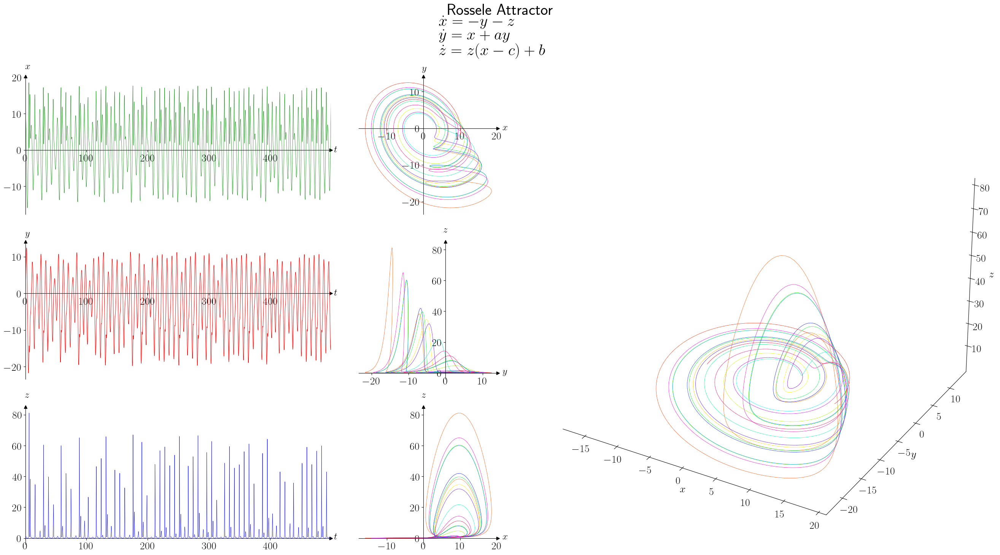

In [187]:
dt     = 0.01 
j      = 1
t_span = [0,500]
y      = [10, -2, 0.2]

a = 0.343        
b = 1.82      
c = 9.75
const = a,b,c    

t, M = RK4(Rf, t_span, const, dt, y)
xx,yy,zz = M[:,0],M[:,1],M[:,2]

fig = plt.figure(figsize=(33,16))
fig.suptitle('Rossele Attractor'+ 
             r'$ \\ \dot{x}= -y-z  \\ \dot{y}= x+ay \\ \dot{z}= z(x- c)+b $',
             fontsize=30,y=1.)
gs=fig.add_gridspec(3,6)
ax1=fig.add_subplot(gs[0,0:2])
ax2=fig.add_subplot(gs[1,0:2])
ax3=fig.add_subplot(gs[2,0:2])
ax4=fig.add_subplot(gs[0,2])
ax5=fig.add_subplot(gs[1,2])
ax6=fig.add_subplot(gs[2,2])
ax7=fig.add_subplot(gs[0:3,3:6],projection='3d')

for ax, data, label in zip([ax1, ax2, ax3], [xx, yy, zz], ['x', 'y', 'z']):
    ax.set_xlim([t[0], t[-1]])
    ax.text(-0.5, np.max(data) + np.max(data)/10 + 2, fr'${label}$', fontsize=18)
    ax.text(t[-1] + 5, -0.5, r'$t$', fontsize=18)
    customize_axes(ax,x_p=0, y_p=0,)

axes_2d = [ax4, ax5, ax6]
coords  = [(xx, yy, 'x', 'y'), (yy, zz, 'y', 'z'), (xx, zz, 'x', 'z')]
for ax, (x_data, y_data, x_label, y_label) in zip(axes_2d, coords):
    customize_axes(ax)
    ax.text(-0.5, np.max(y_data) + np.max(y_data)/10 + 2, fr'${y_label}$', fontsize=18)
    ax.text(np.max(x_data) + 3, -0.5, fr'${x_label}$', fontsize=18)
 
ax7.xaxis.set_pane_color((1,1,1,1))
ax7.yaxis.set_pane_color((1,1,1,1))
ax7.zaxis.set_pane_color((1,1,1,1))
ax7.xaxis.pane.set_edgecolor('w')
ax7.yaxis.pane.set_edgecolor('w')
ax7.zaxis.pane.set_edgecolor('w')
ax7.grid(False)
ax7.set_xlabel(r'$x$')
ax7.set_ylabel(r'$y$')
ax7.set_zlabel(r'$z$')

s = 10
n = 10000
ax1.plot(t,xx,'g', linewidth=0.5)
ax2.plot(t,yy,'r', linewidth=0.7)
ax3.plot(t,zz,'b', linewidth=0.5)
for i in range(0,n-s,s):
    ax4.plot(xx[i:i+s+1],yy[i:i+s+1],color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax5.plot(yy[i:i+s+1],zz[i:i+s+1],color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax6.plot(xx[i:i+s+1],zz[i:i+s+1],color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax7.plot(xx[i:i+s+1], yy[i:i+s+1], zz[i:i+s+1],color=plt.cm.hsv((i+1)/n), linewidth=0.5) 
    #ax7.view_init(10,-50)

plt.show()

<span style="color:red">Numerically integrate the Rössler system for $a=0.4, b=2, c=4,$ and obtain a long time series for $x ( t ).$                 
Then use the attractor-reconstruction method for various values of the delay and plot $( x ( t ), x ( t + \tau )).$        
Find a value of $\tau$ for which the reconstructed attractor looks similar to the actual Rössler attractor.                 
How does that $\tau$ compare to typical orbital periods of the system?

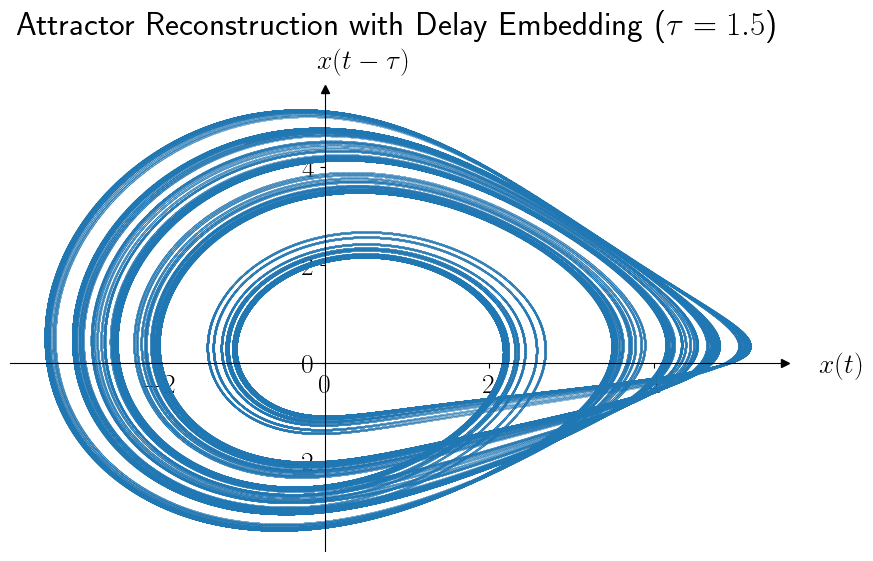

In [39]:
a = 0.4
b = 2.0
c = 4.0
tau = 1.5
t_span = (0, 1000)
dt = 0.001
x0 = np.array([-5.0, 0.0, 0.0])  # Initial conditions
t, x_n = RK4(Rf, t_span, (a, b, c), dt, x0)

# Delay embedding
tau_steps = int(tau / dt)
delayed_x = x_n[:-tau_steps, 0]
delayed_x_tau = x_n[tau_steps:, 0]

# Plotting the delayed coordinates
fig,ax=plt.subplots(figsize=(10, 6))
ax.plot(delayed_x [int(10 / dt):], delayed_x_tau[int(10 / dt):], '.', markersize=0.25)
ax.set_title(f'Attractor Reconstruction with Delay Embedding ($\\tau = {tau}$)', y=1.1)
ax.text(6,-0.2,r'$x(t)$')
ax.text(-0.1, 6,r'$x(t - \tau)$')
customize_axes(ax)
#plt.grid(True)
plt.show()

---
<span style="color:red">The Rössler system has only one non-linear term, yet it is much harder to analyze than the Lorenz system, which has two.    
What makes the Rössler system less tractable ?

---

#### 1. **Symmetry of the Lorenz system**

The Lorenz equations are:

$\qquad\begin{aligned}\dot{x} &= \sigma (y - x) \\ \dot{y} &= x(\rho - z) - y \\ \dot{z} &= xy - \beta z \end{aligned}$

These are invariant under the transformation:

$\qquad(x, y, z) \mapsto (-x, -y, z)$

##### Proof of symmetry:
Apply the transformation to the equations:

- $ \qquad\dot{x} = \sigma(y - x) \Rightarrow \dot{(-x)} = \sigma(-y + x) \Rightarrow -\dot{x} = \sigma(-y + x)$
- $ \qquad\dot{y} = x(\rho - z) - y \Rightarrow \dot{(-y)} = -x(\rho - z) + y \Rightarrow -\dot{y} = -x(\rho - z) + y $
- $ \qquad\dot{z} = xy - \beta z \Rightarrow \dot{z} = (-x)(-y) - \beta z = xy - \beta z$

So the transformed system is satisfied by the negatives of $x(t), y(t)$, and same $z(t)$. This is **discrete symmetry**.


#### 2. **Rössler system lacks this symmetry**

The Rössler equations are:

$\qquad\begin{aligned} \dot{x} &= -y - z \\ \dot{y} &= x + a y \\ \dot{z} &= b + z(x - c) \end{aligned}$

Now try the same transformation: $ (x, y, z) \mapsto (-x, -y, z) $

- $\qquad \dot{x} = -y - z \Rightarrow \dot{(-x)} = y - z $ → Not the same
- $\qquad \dot{y} = x + a y \Rightarrow \dot{(-y)} = -x + a(-y) = -x - a y $ → Not the same
- $\qquad \dot{z} = b + z(x - c) \Rightarrow b + z(-x - c) = b - z(x + c) \neq \dot{z} $

So the system is **not invariant** under that reflection.

The Rössler system lacks the symmetry of the Lorenz system.                                                             
The Lorenz equations are invariant under the transformation $(x, y, z) \rightarrow (-x, -y, z)$,                             
so if $x(t), y(t), z(t) $ is a solution to the Lorenz system, then $-x(t), -y(t), z(t)$ is also a solution.